## Using `archive`, for a wider set of SSO metrics (using the summary statistics CSV file)

This notebook takes the solar system metrics and plots more of them for more families. 
It's a bit of a demo and a bit of a 'make a bunch of plots' notebook. 

In [1]:
# Some useful packages
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import IPython

import rubin_sim.maf as maf

The `archive` module (from `rubin_sim.maf.archive.py`) provides functions to help deal with json/pandas data frames containing lists of the simulations in a given run, as well as typical sets of metrics. With these lists of simulations in each family, it's easier to isolate those metric results to compare the effect of varying that survey strategy. `archive` works with additional functions in `summary_plots` to then normalize and plot metric summary statistics.
(`archive` and `summary_plots` are the evolution of the family_infos and metric_infos classes).

In [2]:
# Get the base 'family' information (which runs are in which family) to use to pull out run names
family_runs = maf.archive.get_family_runs()
family_runs

,run,brief,filepath,version,reference,description,url
family,,,,,,,
baseline,baseline_v2.0_10yrs,v2.0 baseline,baseline/baseline_v2.0_10yrs.db,2,baseline_v2.0_10yrs,**baseline** : The v2.0 baseline simulation. T...,http://epyc.astro.washington.edu/~lynnej/opsim...
retro,baseline_retrofoot_v2.0_10yrs,v1.x footprint but new code capabilities,retro/baseline_retrofoot_v2.0_10yrs.db,2,baseline_v2.0_10yrs,**retro** : The retro family provides two simu...,http://epyc.astro.washington.edu/~lynnej/opsim...
retro,retro_baseline_v2.0_10yrs,v1.x baseline with rubin_sim (without new code...,retro/retro_baseline_v2.0_10yrs.db,2,baseline_v2.0_10yrs,**retro** : The retro family provides two simu...,http://epyc.astro.washington.edu/~lynnej/opsim...
rolling,rolling_ns2_rw0.5_v2.0_10yrs,Rolling half-sky (2 regions) 50%,rolling/rolling_ns2_rw0.5_v2.0_10yrs.db,2,baseline_v2.0_10yrs,**rolling** : The updated baseline contains a ...,http://epyc.astro.washington.edu/~lynnej/opsim...
rolling,rolling_ns3_rw0.5_v2.0_10yrs,Rolling third-sky (3 regions) 50%,rolling/rolling_ns2_rw0.9_v2.0_10yrs.db,2,baseline_v2.0_10yrs,**rolling** : The updated baseline contains a ...,http://epyc.astro.washington.edu/~lynnej/opsim...
...,...,...,...,...,...,...,...
microsurveys,twilight_neo_nightpattern3v2.0_10yrs,Twilight neo observations 1 night on 2 off,microsurveys/local_gals/local_gal_bindx0_v2.0_...,2,baseline_v2.0_10yrs,**microsurveys** : There are special programs ...,http://epyc.astro.washington.edu/~lynnej/opsim...
microsurveys,twilight_neo_nightpattern6v2.0_10yrs,Twilight neo observations 3 night on 4 off,microsurveys/carina/carina_v2.0_10yrs.db,2,baseline_v2.0_10yrs,**microsurveys** : There are special programs ...,http://epyc.astro.washington.edu/~lynnej/opsim...
microsurveys,twilight_neo_nightpattern5v2.0_10yrs,Twilight neo observations 4 night on 4 off,microsurveys/short_exp/short_exp_v2.0_10yrs.db,2,baseline_v2.0_10yrs,**microsurveys** : There are special programs ...,http://epyc.astro.washington.edu/~lynnej/opsim...


We'll also download a version of this dataframe with a mulit-level index on 'family' that provides the same information, just accessible slightly differently.

In [3]:
family_families = maf.archive.get_family_descriptions()

Read the summary stat csv file. 

These are the standard MAF summary stats (which may include something you use!) 
but you could join your own dataframe, as long as it covered all the relevant runs.
This gives us metric results to compare between the runs.

This summary stat file can be downloaded at<br>
https://github.com/lsst-pst/survey_strategy/blob/master/fbs_2.0/summary_2022_1_11.csv

In [4]:
# Read the summary stat csv file
url_source = 'https://raw.githubusercontent.com/lsst-pst/survey_strategy/main/fbs_2.0/summary_2022_1_25.csv'
file_source = 'summary_2022_1_25.csv'
summaries = maf.archive.get_metric_summaries(summary_source=file_source)
# summaries = archive.get_metric_summaries(summary_source=url_source)

In [5]:
# And get the metric subset lists that can help with pulling information out of the big summary dataframe
metrics_url = "https://raw.githubusercontent.com/lsst-pst/survey_strategy/main/fbs_2.0/metric_sets.json"
file_source = 'metric_sets.json'
metrics = maf.archive.get_metric_sets(file_source)
metrics.head()

metric  \
metric set metric                                                                                                  
srd        fONv MedianNvis fO All visits HealpixSlicer               fONv MedianNvis fO All visits HealpixSlicer   
           Median Parallax Error (18k) Parallax Error @ 22...  Median Parallax Error (18k) Parallax Error @ 2...   
           Median Parallax Error (18k) Parallax Error @ 24...  Median Parallax Error (18k) Parallax Error @ 2...   
           Median Proper Motion Error (18k) Proper Motion ...  Median Proper Motion Error (18k) Proper Motion...   
           Median Proper Motion Error (18k) Proper Motion ...  Median Proper Motion Error (18k) Proper Motion...   

                                                                             short_name  \
metric set metric                                                                         
srd        fONv MedianNvis fO All visits HealpixSlicer                  fONv MedianNvis   
           Median Parallax Error (18k) Parallax Error @ 22...  Med Parallax Error @22.4   
           Median Parallax Error (18k) Parallax Error @ 24...  Med Parallax Error @24.0   
           Median Proper Motion Error (18k) Proper Motion ...        Med PM Error @20.5   
           Median Proper Motion Error (18k) Proper Motion ...        Med PM Error @24.0   

                                                                           short_names_norm  \
metric set metric                                                                             
srd        fONv MedianNvis fO All visits HealpixSlicer                      fONv MedianNvis   
           Median Parallax Error (18k) Parallax Error @ 22...  1 / Med Parallax Error @22.4   
           Median Parallax Error (18k) Parallax Error @ 24...  1 / Med Parallax Error @24.0   
           Median Proper Motion Error (18k) Proper Motion ...        1 / Med PM Error @20.5   
           Median Proper Motion Error (18k) Proper Motion ...         1 /Med PM Error @24.0   

                                                              style  invert  \
metric set metric                                                             
srd        fONv MedianNvis fO All visits HealpixSlicer           k-   False   
           Median Parallax Error (18k) Parallax Error @ 22...    c-    True   
           Median Parallax Error (18k) Parallax Error @ 24...    c:    True   
           Median Proper Motion Error (18k) Proper Motion ...    r-    True   
           Median Proper Motion Error (18k) Proper Motion ...    r:    True   

                                                                 mag  
metric set metric                                                     
srd        fONv MedianNvis fO All visits HealpixSlicer         False  
           Median Parallax Error (18k) Parallax Error @ 22...  False  
           Median Parallax Error (18k) Parallax Error @ 24...  False  
           Median Proper Motion Error (18k) Proper Motion ...  False  
           Median Proper Motion Error (18k) Proper Motion ...  False

In [6]:
# What are the 'sets' of metrics?
metrics.groupby('metric set').first().index

Index(['Fraction Pop 3 bands', 'Fraction Pop 4 bands', 'Fraction Pop 5 bands',
       'Fraction Pop 6 bands', 'Lightcurve Inversion', 'Nvis', 'SSO NOBJ',
       'SSO discovery', 'area', 'cadence', 'descWFD', 'galaxies', 'radar',
       'short', 'srd', 'sso disc options', 'tvs'],
      dtype='object', name='metric set')

### Solar system metrics

Using utilities from `archive` (to normalize the data frame and plot metrics), combined with the family information dataframe with the simulations in each family, we can pull up some plots for each family.

In [7]:
sso_metrics = ['SSO discovery', 
               'SSO NOBJ',
               'Fraction Pop 3 bands', 
               'Fraction Pop 4 bands',
               'Fraction Pop 5 bands',
               'Fraction Pop 6 bands', 
               'Lightcurve Inversion']

outDir = 'sso_plots'
if not os.path.exists(outDir):
    os.mkdir(outDir)

# Basic 'general' metrics for a family(s)
def describe_family(family_names):
    for family in family_names:
        IPython.display.display_markdown(family_families['description'].loc[family], raw=True)
    these_runs = list(family_runs["run"].loc[family_names].values)
    baseline_run = family_runs['reference'].loc[family_names].iloc[0]
    if baseline_run not in these_runs:
        these_runs = [baseline_run] + these_runs
        family_names = family_names + list(family_runs.query('run == @baseline_run').index)
    d = summaries.loc[these_runs, metrics.loc['short']['metric']]
    d.columns = metrics.loc['short']['short_name'].values
    d['Briefly'] = family_runs.loc[family_names][['run', 'brief']].reset_index(drop=True).set_index('run')
    IPython.display.display(d)
    mset = 'area'
    fig, ax = maf.plot_run_metric(  # pylint: disable=invalid-name
        summaries.loc[these_runs, :], 
        metric_set=metrics.loc[mset],
        baseline_run=baseline_run,
        vertical_quantity="value",
        horizontal_quantity="run",
        metric_label_map=metrics.loc[mset]['short_name']
    )
    plt.xlim(0, len(d)-1)
    xlims = plt.xlim()
    if plt.ylim()[0] < 0.50:
        plt.ylim(bottom=0.50)
    if plt.ylim()[1] > 1.5:
        plt.ylim(top=1.5)
    plt.fill_between(xlims, 1.05, plt.ylim()[1], color='g', alpha=0.1)
    plt.fill_between(xlims, 0.95, plt.ylim()[0], color='r', alpha=0.1)
    plt.savefig(f'{outDir}/area__{"_".join(family_names)}.pdf')

# Show and plot set of solar system specific metric outputs
def sso_family(family_names, mset):
    these_runs = list(family_runs["run"].loc[family_names].values)
    baseline_run = family_runs['reference'].loc[family_names].iloc[0]
    if baseline_run not in these_runs:
        these_runs = [baseline_run] + these_runs
    fig, ax = maf.plot_run_metric(  # pylint: disable=invalid-name
            summaries.loc[these_runs, :], 
            metric_set=metrics.loc[mset],
            baseline_run=baseline_run,
            vertical_quantity="value",
            horizontal_quantity="run",
            metric_label_map=metrics.loc[mset]['short_name']
        )
    lgd = plt.legend(loc=(1.01, 0.2), fancybox=True, numpoints=1, fontsize='medium')
    figwidth = min(4, len(these_runs))
    figwidth = max(figwidth, 15)
    fig.set_figwidth(figwidth)
    d = summaries.loc[these_runs, metrics.loc[mset]['metric']]
    d.columns = metrics.loc[mset]['short_name']
    plt.xlim(0, len(d)-1)
    xlims = plt.xlim()
    if plt.ylim()[0] < 0.50:
        plt.ylim(bottom=0.50)
    if plt.ylim()[1] > 1.5:
        plt.ylim(top=1.5)
    plt.fill_between(xlims, 1.05, plt.ylim()[1], color='g', alpha=0.1)
    plt.fill_between(xlims, 0.95, plt.ylim()[0], color='r', alpha=0.1)
    plt.savefig(f'{outDir}/{mset.replace(" ", "_")}__{"_".join(family_names)}.pdf', 
                bbox_extra_artists=(lgd,), bbox_inches='tight')
    return d

**baseline** : The v2.0 baseline simulation. This features a modified survey footprint with expanded dust-free area and WFD-level visits in the Galactic Bulge and Magellanic Clouds. Coverage of the Northern Ecliptic Spur, South Celestial Pole, and remainder of the Galactic Plane is maintained, at lower levels. Filter balance is modified in different areas of the sky. A 2-region rolling cadence is used in the dust-free WFD sky, to improve cadence. 

**retro** : The retro family provides two simulations to bridge the gap between previous sets of simulations and the updated baseline. One (retro_baseline) uses the current code base to re-run the previous baseline (i.e. this is baseline_nexp2_v1.7.1_10yrs, but run with rubin_sim) while the other (retrofoot) uses updated code settings but re-creates the baseline_nexp2_v1.7.1_10yrs footprint. These are primarily intended to help users understand potential changes in their metric results from the 1.x series of runs to the v2.0 runs, as well as the modification from sims_maf to rubin_sim.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
baseline_retrofoot_v2.0_10yrs,17510.183320,14959.569932,2086534.0,875.0,56.0,79.0,185.0,188.0,166.0,173.0,v1.x footprint but new code capabilities
retro_baseline_v2.0_10yrs,14611.263069,15095.535503,2048566.0,848.0,53.0,74.0,180.0,180.0,161.0,172.0,v1.x baseline with rubin_sim (without new code...


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
baseline_retrofoot_v2.0_10yrs,0.9400,0.580009,0.9260,0.566718,1.0,0.521977,1.0,0.424528,0.676619,0.454312
retro_baseline_v2.0_10yrs,0.9130,0.586427,0.9094,0.567183,1.0,0.570506,1.0,0.480267,0.682227,0.474403


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
baseline_retrofoot_v2.0_10yrs,15433.932501,54931.434095,16584.534108,64332.904482,18658.710148,94313.838051
retro_baseline_v2.0_10yrs,15440.123475,61060.572243,16644.678738,72879.425179,18715.390923,101918.006132


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0,0.901780,1.0,0.9996,0.6168,0.4794
baseline_retrofoot_v2.0_10yrs,0.8296,0.5178,0.8416,0.5148,1.0,0.887578,1.0,0.9988,0.5996,0.4540
retro_baseline_v2.0_10yrs,0.8094,0.5208,0.8272,0.5182,1.0,0.934587,1.0,1.0000,0.6048,0.4766


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0,0.901780,1.0,0.9996,0.5978,0.4248
baseline_retrofoot_v2.0_10yrs,0.8296,0.5176,0.8416,0.5144,1.0,0.887578,1.0,0.9988,0.5826,0.3924
retro_baseline_v2.0_10yrs,0.8090,0.5202,0.8270,0.5178,1.0,0.934587,1.0,1.0000,0.5940,0.4304


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
baseline_retrofoot_v2.0_10yrs,0.6910,0.3192,0.7302,0.3288,0.993599,0.427686,0.9992,0.5568,0.3612,0.1746
retro_baseline_v2.0_10yrs,0.6690,0.3112,0.7076,0.3294,0.997800,0.455291,0.9996,0.5854,0.3680,0.1848


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
baseline_retrofoot_v2.0_10yrs,0.4438,0.0458,0.4526,0.0498,0.876375,0.051810,0.9068,0.0018,0.0180,0.0006
retro_baseline_v2.0_10yrs,0.3796,0.0332,0.3914,0.0372,0.866973,0.034407,0.8370,0.0020,0.0108,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
baseline_retrofoot_v2.0_10yrs,0.4690,0.0550,0.4822,0.0546,0.926985,0.129426,0.8984,0.1092
retro_baseline_v2.0_10yrs,0.4450,0.0470,0.4650,0.0438,0.964793,0.152831,0.9786,0.0836


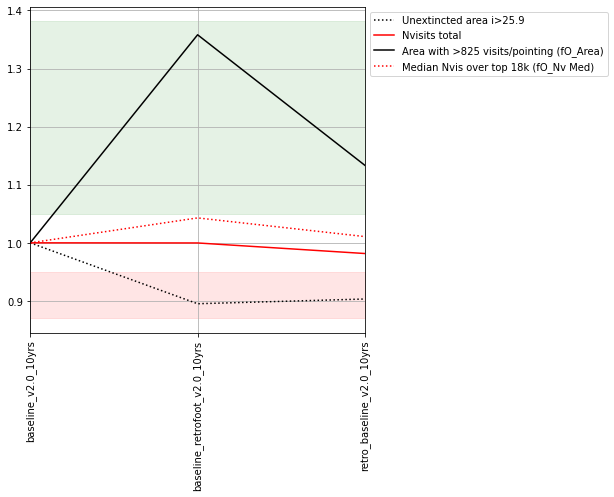

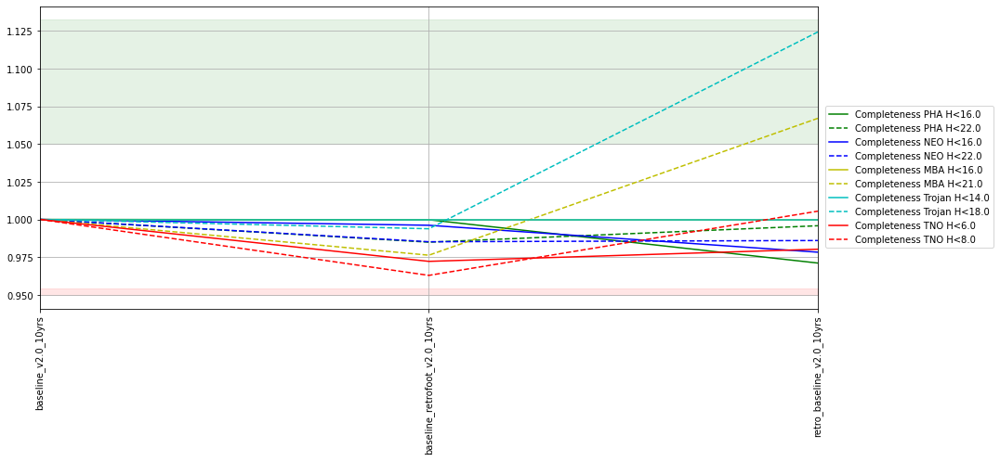

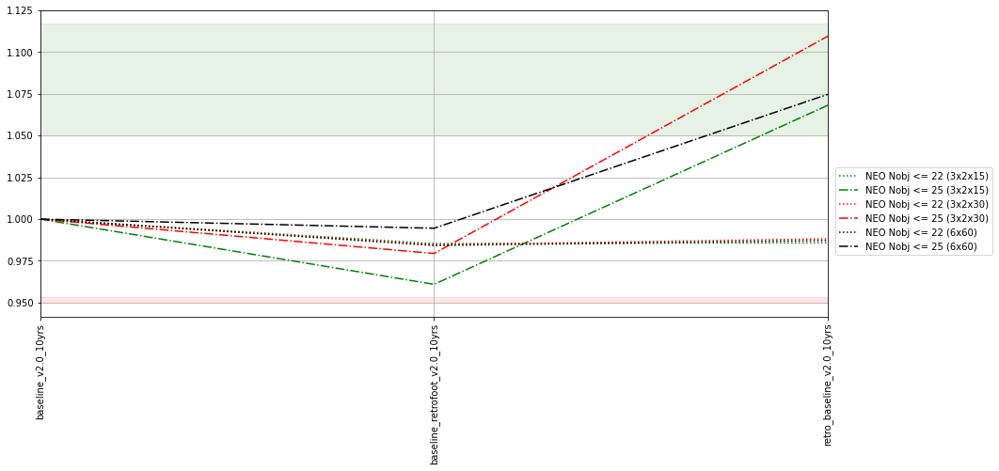

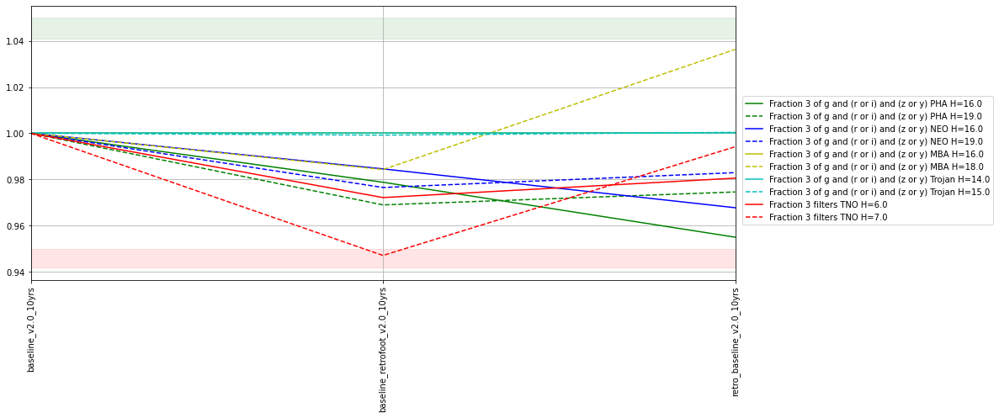

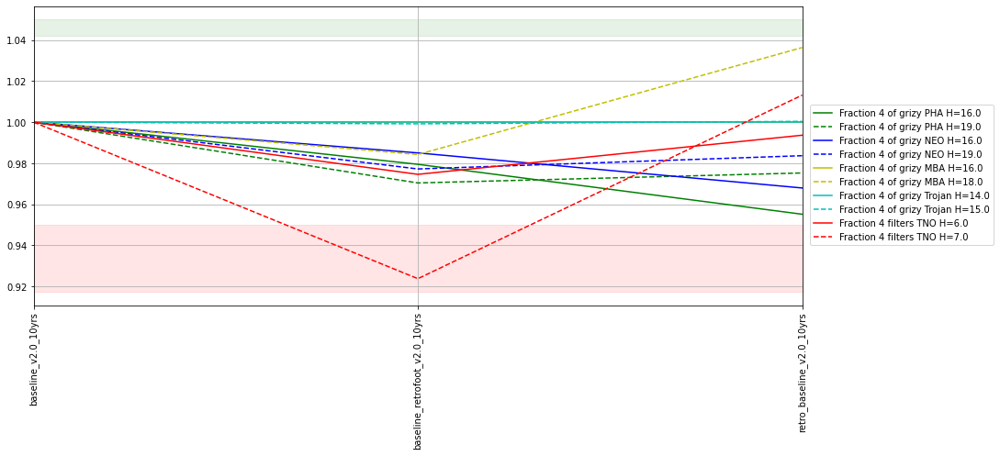

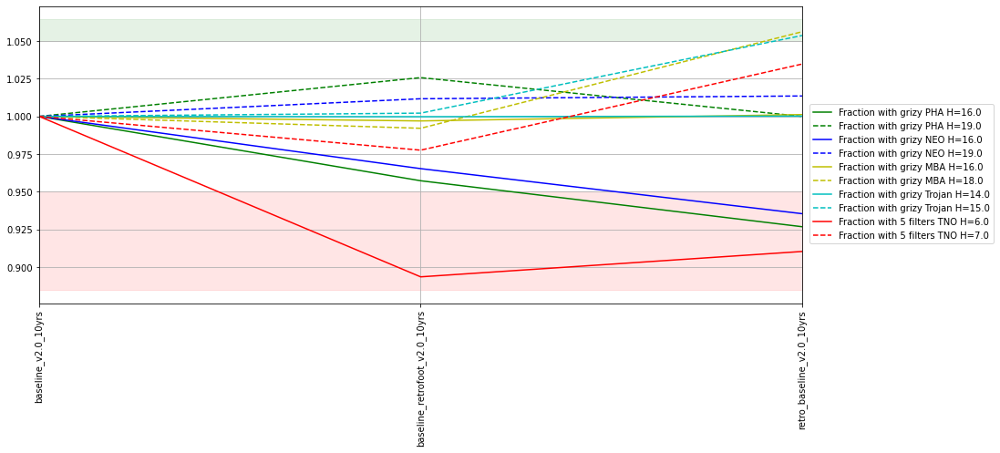

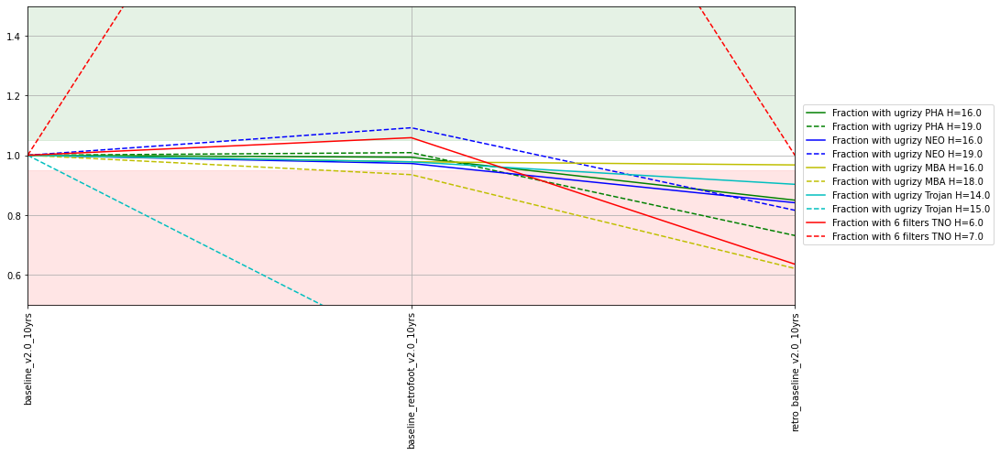

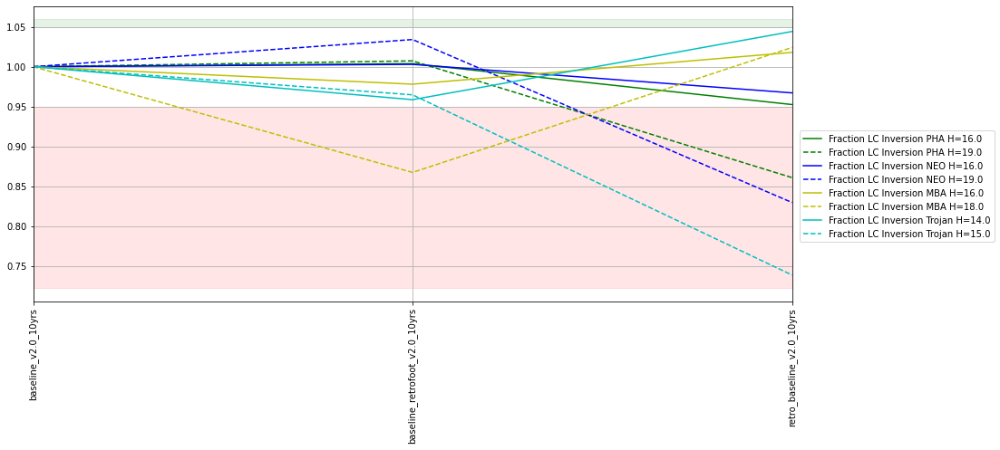

In [8]:
fam = ['baseline', 'retro']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**vary_nes** : These simulations investigate the effect of varying the amount of survey time spent on covering the North Ecliptic Spur area. The baseline characteristics, including the ratio of visits over the remainder of the footprint, are kept the same. 

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
vary_nes_nesfrac0.01_v2.0_10yrs,17534.522836,16896.659665,2087392.0,869.0,55.0,72.0,184.0,187.0,167.0,172.0,NES at 1% WFD level
vary_nes_nesfrac0.05_v2.0_10yrs,17223.144893,16868.962975,2087572.0,865.0,55.0,71.0,183.0,186.0,166.0,172.0,NES at 5% WFD level
vary_nes_nesfrac0.10_v2.0_10yrs,16779.158555,16769.087031,2087761.0,861.0,55.0,71.0,182.0,185.0,165.0,171.0,NES at 10% WFD level
vary_nes_nesfrac0.15_v2.0_10yrs,16146.331147,16760.694095,2087741.0,856.0,55.0,71.0,181.0,184.0,164.0,170.0,NES at 15% WFD level
vary_nes_nesfrac0.20_v2.0_10yrs,15380.056048,16815.248182,2087462.0,851.0,55.0,71.0,180.0,183.0,163.0,169.0,NES at 20% WFD level
vary_nes_nesfrac0.25_v2.0_10yrs,14228.545167,16691.032722,2087377.0,845.0,54.0,70.0,179.0,181.0,161.0,168.0,NES at 25% WFD level
vary_nes_nesfrac0.30_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,NES at 30% WFD level
vary_nes_nesfrac0.35_v2.0_10yrs,11059.372363,16583.603136,2087488.0,832.0,53.0,69.0,176.0,178.0,159.0,165.0,NES at 35% WFD level


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
vary_nes_nesfrac0.01_v2.0_10yrs,0.9288,0.582260,0.9204,0.571490,1.0,0.519912,1.0,0.420827,0.646536,0.430100
vary_nes_nesfrac0.05_v2.0_10yrs,0.9292,0.578065,0.9238,0.566988,1.0,0.522519,1.0,0.423186,0.683730,0.450519
vary_nes_nesfrac0.10_v2.0_10yrs,0.9352,0.576135,0.9256,0.568213,1.0,0.518835,1.0,0.420995,0.691674,0.457132
vary_nes_nesfrac0.15_v2.0_10yrs,0.9396,0.585770,0.9262,0.570950,1.0,0.525441,1.0,0.421213,0.693704,0.460856
vary_nes_nesfrac0.20_v2.0_10yrs,0.9384,0.586042,0.9292,0.573157,1.0,0.529549,1.0,0.418937,0.694224,0.469233
vary_nes_nesfrac0.25_v2.0_10yrs,0.9368,0.579744,0.9282,0.571837,1.0,0.532602,1.0,0.426423,0.696000,0.469920
vary_nes_nesfrac0.30_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
vary_nes_nesfrac0.35_v2.0_10yrs,0.9402,0.589964,0.9310,0.574886,1.0,0.530026,1.0,0.425618,0.696167,0.472005


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
vary_nes_nesfrac0.01_v2.0_10yrs,15558.429678,55908.021643,16586.765316,64515.652943,18563.463349,92250.779020
vary_nes_nesfrac0.05_v2.0_10yrs,15440.861187,55758.437549,16513.562673,63237.726074,18584.871339,91295.542630
vary_nes_nesfrac0.10_v2.0_10yrs,15475.016771,54820.818941,16592.537985,63268.910641,18663.529586,91774.594523
vary_nes_nesfrac0.15_v2.0_10yrs,15546.809383,55790.041994,16628.540280,64567.318762,18761.277772,93477.592749
vary_nes_nesfrac0.20_v2.0_10yrs,15608.429868,56830.914038,16775.545650,65188.300909,18854.023874,94959.046581
vary_nes_nesfrac0.25_v2.0_10yrs,15572.667617,56542.783448,16675.875418,65872.992427,18794.158475,94417.631207
vary_nes_nesfrac0.30_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
vary_nes_nesfrac0.35_v2.0_10yrs,15655.004160,57538.124272,16844.377119,66348.847883,18969.885835,95697.531906


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0000,0.9996,0.6168,0.4794
vary_nes_nesfrac0.01_v2.0_10yrs,0.8128,0.5092,0.8362,0.5202,0.9998,0.883977,0.9998,0.9990,0.4766,0.3910
vary_nes_nesfrac0.05_v2.0_10yrs,0.8174,0.5052,0.8368,0.5150,0.9998,0.880776,0.9998,0.9988,0.4792,0.3914
vary_nes_nesfrac0.10_v2.0_10yrs,0.8228,0.5116,0.8452,0.5250,0.9998,0.887978,1.0000,0.9988,0.4902,0.3938
vary_nes_nesfrac0.15_v2.0_10yrs,0.8334,0.5244,0.8460,0.5210,1.0000,0.894579,1.0000,0.9994,0.5964,0.4246
vary_nes_nesfrac0.20_v2.0_10yrs,0.8378,0.5236,0.8502,0.5260,1.0000,0.895179,1.0000,0.9994,0.6128,0.4532
vary_nes_nesfrac0.25_v2.0_10yrs,0.8408,0.5282,0.8540,0.5320,1.0000,0.905381,1.0000,0.9998,0.6164,0.4692
vary_nes_nesfrac0.30_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0000,0.9996,0.6168,0.4794
vary_nes_nesfrac0.35_v2.0_10yrs,0.8504,0.5336,0.8564,0.5328,1.0000,0.905781,1.0000,0.9996,0.6190,0.4878


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0000,0.9996,0.5978,0.4248
vary_nes_nesfrac0.01_v2.0_10yrs,0.8124,0.5086,0.8356,0.5202,0.9998,0.883977,0.9998,0.9990,0.4606,0.3680
vary_nes_nesfrac0.05_v2.0_10yrs,0.8168,0.5040,0.8362,0.5142,0.9998,0.880776,0.9998,0.9988,0.4644,0.3690
vary_nes_nesfrac0.10_v2.0_10yrs,0.8208,0.5104,0.8446,0.5244,0.9998,0.887978,1.0000,0.9988,0.4650,0.3712
vary_nes_nesfrac0.15_v2.0_10yrs,0.8330,0.5238,0.8456,0.5204,1.0000,0.894579,1.0000,0.9994,0.4832,0.3706
vary_nes_nesfrac0.20_v2.0_10yrs,0.8374,0.5230,0.8498,0.5252,1.0000,0.895179,1.0000,0.9994,0.5608,0.3850
vary_nes_nesfrac0.25_v2.0_10yrs,0.8408,0.5274,0.8538,0.5316,1.0000,0.905381,1.0000,0.9998,0.5926,0.4062
vary_nes_nesfrac0.30_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0000,0.9996,0.5978,0.4248
vary_nes_nesfrac0.35_v2.0_10yrs,0.8504,0.5334,0.8564,0.5322,1.0000,0.905781,1.0000,0.9996,0.6016,0.4380


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
vary_nes_nesfrac0.01_v2.0_10yrs,0.6972,0.3052,0.7306,0.3204,0.996199,0.434087,0.9994,0.6060,0.4034,0.1840
vary_nes_nesfrac0.05_v2.0_10yrs,0.7060,0.3080,0.7406,0.3288,0.994799,0.432286,0.9992,0.5684,0.4028,0.1782
vary_nes_nesfrac0.10_v2.0_10yrs,0.7122,0.3074,0.7414,0.3284,0.996399,0.428486,0.9998,0.5648,0.4036,0.1808
vary_nes_nesfrac0.15_v2.0_10yrs,0.7160,0.3142,0.7496,0.3256,0.994999,0.430086,0.9996,0.5720,0.4070,0.1804
vary_nes_nesfrac0.20_v2.0_10yrs,0.7206,0.3178,0.7534,0.3286,0.995599,0.427085,0.9998,0.5928,0.4072,0.1802
vary_nes_nesfrac0.25_v2.0_10yrs,0.7180,0.3134,0.7478,0.3298,0.995799,0.427686,0.9994,0.5584,0.4096,0.1808
vary_nes_nesfrac0.30_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
vary_nes_nesfrac0.35_v2.0_10yrs,0.7290,0.3208,0.7506,0.3238,0.995399,0.418484,0.9994,0.5604,0.4068,0.1778


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
vary_nes_nesfrac0.01_v2.0_10yrs,0.4646,0.0498,0.4814,0.0500,0.902781,0.053011,0.9500,0.0040,0.0164,0.0002
vary_nes_nesfrac0.05_v2.0_10yrs,0.4566,0.0474,0.4786,0.0506,0.910982,0.057211,0.9288,0.0036,0.0170,0.0002
vary_nes_nesfrac0.10_v2.0_10yrs,0.4526,0.0512,0.4784,0.0488,0.901380,0.052210,0.9408,0.0034,0.0180,0.0002
vary_nes_nesfrac0.15_v2.0_10yrs,0.4578,0.0504,0.4732,0.0486,0.901580,0.054011,0.9372,0.0030,0.0174,0.0002
vary_nes_nesfrac0.20_v2.0_10yrs,0.4548,0.0492,0.4682,0.0476,0.897980,0.053411,0.9370,0.0030,0.0164,0.0002
vary_nes_nesfrac0.25_v2.0_10yrs,0.4446,0.0518,0.4670,0.0492,0.898980,0.048610,0.9382,0.0038,0.0154,0.0002
vary_nes_nesfrac0.30_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
vary_nes_nesfrac0.35_v2.0_10yrs,0.4462,0.0456,0.4592,0.0458,0.891778,0.051810,0.9346,0.0036,0.0160,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
vary_nes_nesfrac0.01_v2.0_10yrs,0.4316,0.0538,0.4536,0.0508,0.892979,0.116623,0.8854,0.0866
vary_nes_nesfrac0.05_v2.0_10yrs,0.4366,0.0538,0.4620,0.0532,0.906181,0.117423,0.8918,0.1030
vary_nes_nesfrac0.10_v2.0_10yrs,0.4412,0.0534,0.4640,0.0530,0.913383,0.122024,0.9068,0.0956
vary_nes_nesfrac0.15_v2.0_10yrs,0.4450,0.0524,0.4594,0.0522,0.923985,0.128826,0.9172,0.1084
vary_nes_nesfrac0.20_v2.0_10yrs,0.4482,0.0506,0.4750,0.0522,0.930786,0.133627,0.9210,0.1172
vary_nes_nesfrac0.25_v2.0_10yrs,0.4618,0.0552,0.4746,0.0508,0.940188,0.145629,0.9398,0.1076
vary_nes_nesfrac0.30_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
vary_nes_nesfrac0.35_v2.0_10yrs,0.4766,0.0532,0.4910,0.0516,0.953791,0.149430,0.9394,0.1134


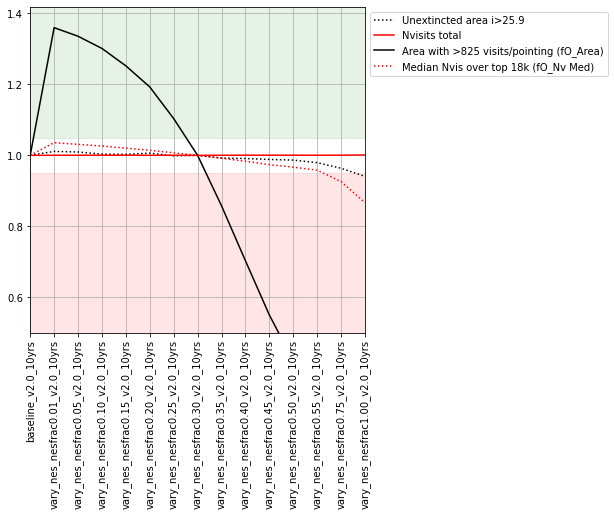

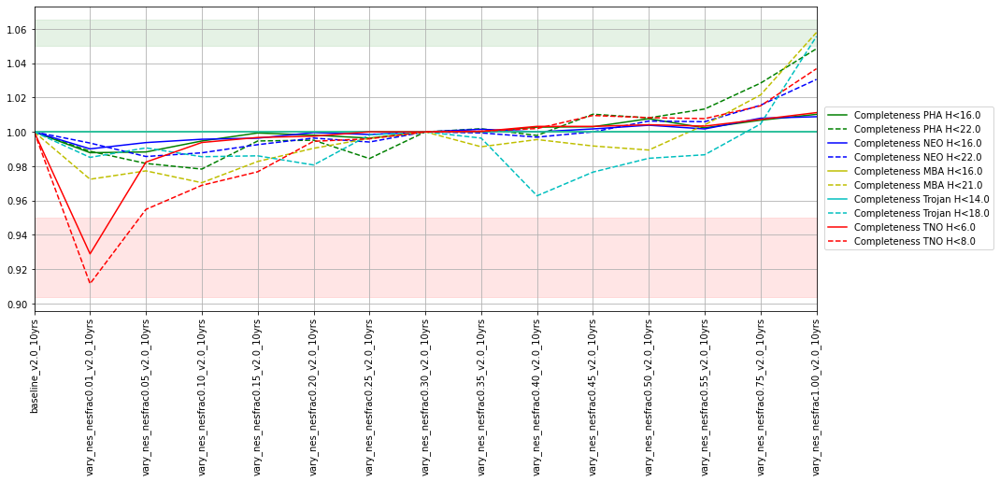

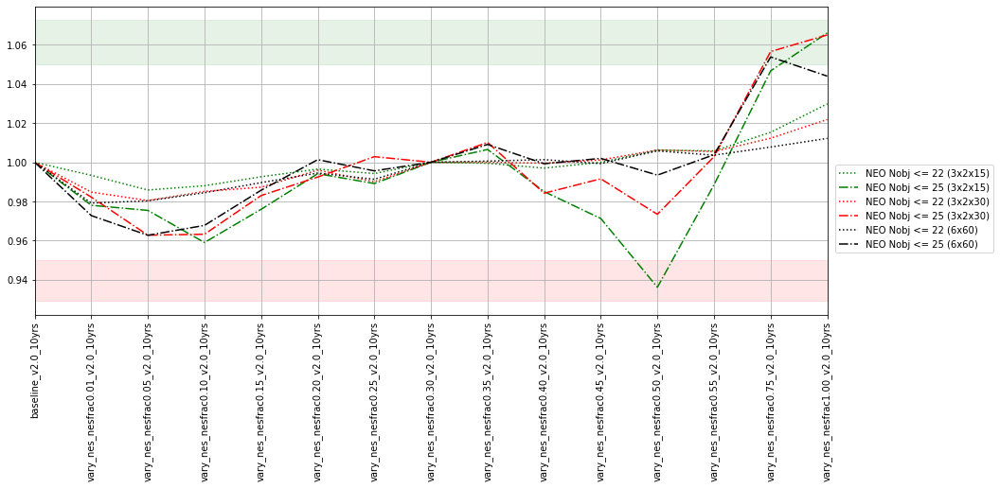

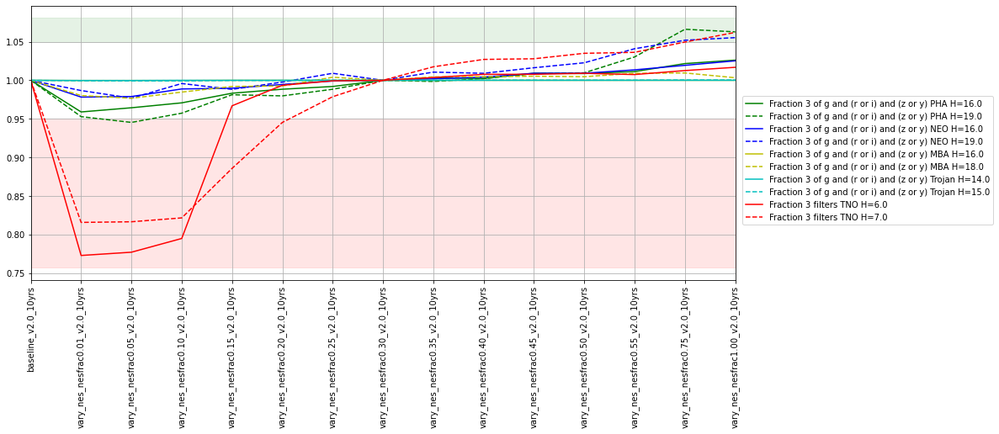

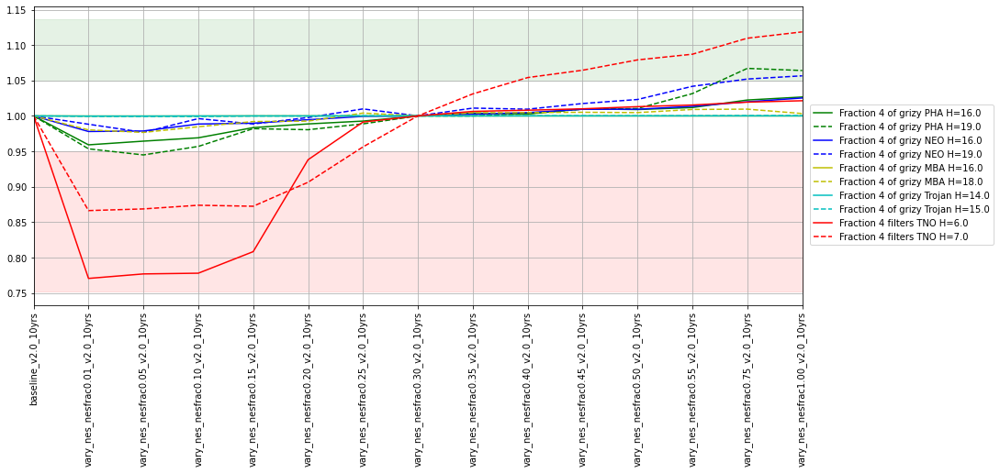

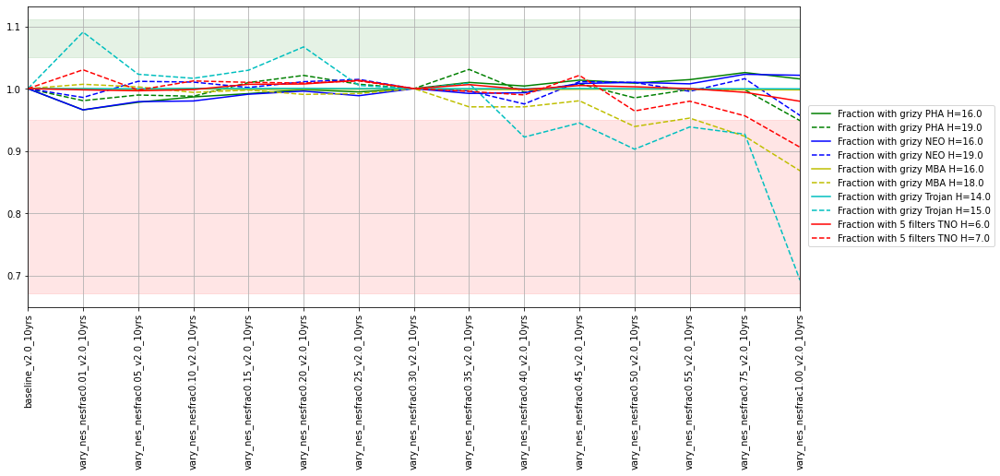

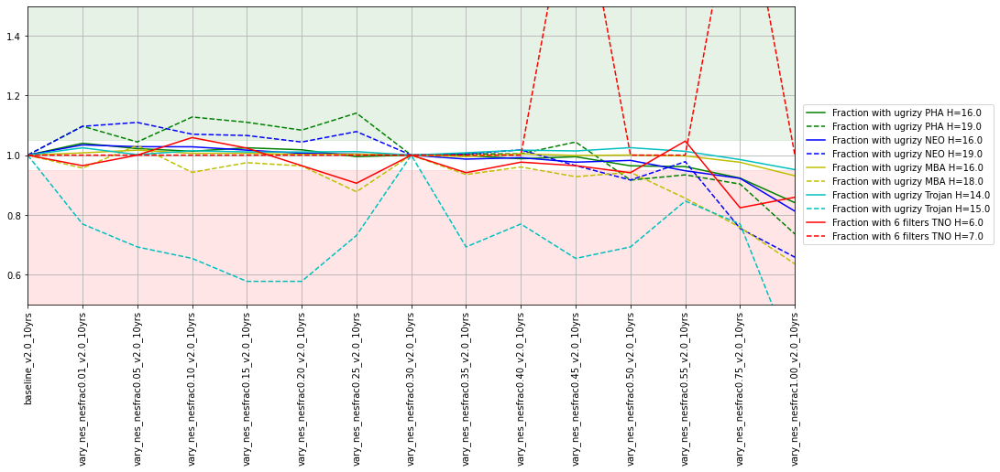

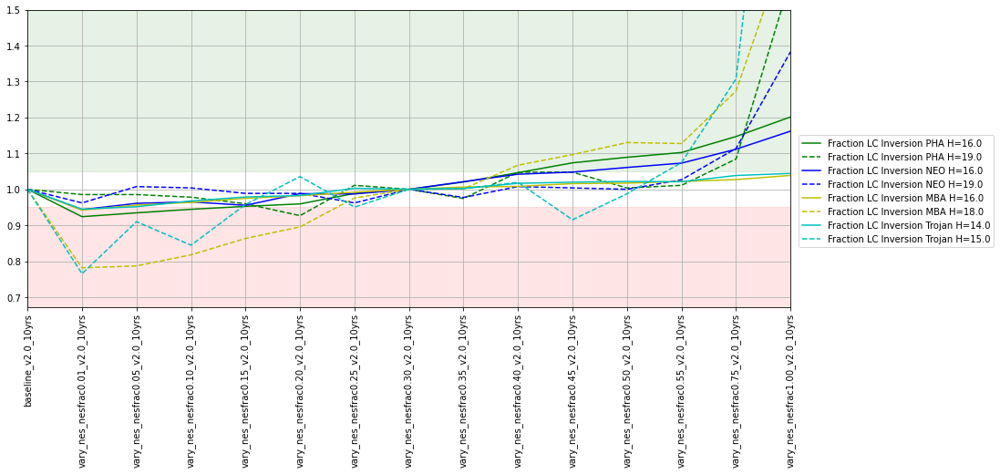

In [9]:
fam = ['vary_nes']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

['rolling', 'rolling_bulge', 'rolling_bulge_6', 'rolling_six', 'rolling_early', 'rolling_all_sky']


**rolling** : The updated baseline contains a 2-band rolling cadence with strength ~90% in the dust-free WFD. These simulations extend upon and modify this rolling cadence in the dust-free WFD including using 3 regions instead of 2, and adding variable weight ("strength") to the level of rolling.

**rolling_bulge** : The updated baseline contains a 2-band rolling cadence with strength ~90% in the dust-free WFD. These simulations add a rolling cadence in the WFD-level area of the galactic plane. The rolling in the bulge is implemented in 2-regions, with varying weights (or strengths).

**rolling_bulge_6** : The updated baseline contains a 2-band rolling cadence with strength ~90% in the dust-free WFD. This simulation add a 6-region rolling cadence to the galactic bulge WFD-level area in addition.

**rolling_six** : The updated baseline contains a 2-band rolling cadence with strength ~90% in the dust-free WFD. These simulations modify this rolling cadence in the dust-free WFD to use 6 regions instead of 2, with variable weight ("strength") to the level of rolling.

**rolling_early** : The updated baseline contains a 2-band rolling cadence with strength ~90% in the dust-free WFD. In the baseline, rolling cadence starts at year 1.5 and ends at 8.5, so that each rolling "season" is an entire season length. This simulation modifies the timing, so that rolling starts at the end of year 1 and ends at year 9. The time available for rolling is longer, although may be split; the time available for all-sky surveying for astrometric purposes is maintained. Data releases may be potentially more uniform (TBD).

**rolling_all_sky** : The updated baseline contains a 2-band rolling cadence with strength ~90% in the dust-free WFD. This simulations adds a 2-region rolling cadence on all parts of the sky, including all parts of the galactic plane, the northern ecliptic spur, and the south celestial pole.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
rolling_ns2_rw0.5_v2.0_10yrs,12614.583488,16807.694539,2084510.0,838.0,54.0,69.0,177.0,180.0,160.0,166.0,Rolling half-sky (2 regions) 50%
rolling_ns3_rw0.5_v2.0_10yrs,12729.566717,16873.159443,2085499.0,838.0,54.0,70.0,177.0,180.0,160.0,166.0,Rolling third-sky (3 regions) 50%
rolling_ns2_rw0.9_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,Rolling half-sky (2 regions) 90%
rolling_ns3_rw0.9_v2.0_10yrs,13255.803832,16568.495850,2090909.0,841.0,54.0,70.0,178.0,181.0,160.0,167.0,Rolling third-sky (3 regions) 90%
rolling_bulge_ns2_rw0.5_v2.0_10yrs,12600.315496,16868.962975,2084413.0,838.0,54.0,69.0,177.0,180.0,160.0,166.0,"Roll in the bulge with 2 regions, 50%"
rolling_bulge_ns2_rw0.8_v2.0_10yrs,12733.763185,16664.175326,2086550.0,838.0,54.0,70.0,178.0,180.0,161.0,166.0,"Roll in the bulge with 2 regions, 80%"
rolling_bulge_ns2_rw0.9_v2.0_10yrs,12940.229422,16706.140008,2087907.0,840.0,54.0,70.0,178.0,180.0,160.0,166.0,"Roll in the bulge with 2 regions, 90%"
rolling_bulge_6_v2.0_10yrs,12492.885909,16606.264064,2085745.0,838.0,53.0,69.0,177.0,180.0,160.0,166.0,Roll the bulge in 6 stripes (low-dust WFD in 2...


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0000,0.534662,1.0,0.427171,0.695976,0.471819
rolling_ns2_rw0.5_v2.0_10yrs,0.9356,0.590608,0.9282,0.574481,1.0000,0.532391,1.0,0.416318,0.694734,0.468886
rolling_ns3_rw0.5_v2.0_10yrs,0.9340,0.585846,0.9292,0.578934,1.0000,0.528978,1.0,0.415417,0.696531,0.473095
rolling_ns2_rw0.9_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0000,0.534662,1.0,0.427171,0.695976,0.471819
rolling_ns3_rw0.9_v2.0_10yrs,0.9444,0.581618,0.9324,0.566985,1.0000,0.525043,1.0,0.417641,0.697595,0.476506
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.9358,0.594242,0.9272,0.578730,1.0000,0.531585,1.0,0.423320,0.694457,0.469262
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.9396,0.586697,0.9312,0.575349,1.0000,0.534771,1.0,0.424635,0.696074,0.471744
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.9426,0.588636,0.9318,0.574934,1.0000,0.534093,1.0,0.419650,0.695751,0.472651
rolling_bulge_6_v2.0_10yrs,0.9464,0.585296,0.9354,0.574870,1.0000,0.532178,1.0,0.427731,0.697226,0.476866


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
rolling_ns2_rw0.5_v2.0_10yrs,15642.651174,59729.542587,16910.413086,69880.358652,19062.957642,97970.173134
rolling_ns3_rw0.5_v2.0_10yrs,15758.386132,56291.844221,16984.087874,66534.493520,19073.401430,97921.292300
rolling_ns2_rw0.9_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
rolling_ns3_rw0.9_v2.0_10yrs,15444.638048,55450.306678,16547.246025,63871.367530,18756.522687,92015.414085
rolling_bulge_ns2_rw0.5_v2.0_10yrs,15753.971823,57080.500256,16976.590514,67169.098009,19053.896446,97649.716294
rolling_bulge_ns2_rw0.8_v2.0_10yrs,15667.624192,57083.289206,16833.496591,66415.978716,18942.904383,95332.160710
rolling_bulge_ns2_rw0.9_v2.0_10yrs,15654.974460,59142.404297,16824.020112,67917.452450,18909.544935,96114.523096
rolling_bulge_6_v2.0_10yrs,15657.009589,57701.527001,16777.812027,65812.488214,18897.164088,94147.687641


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0000,0.9996,0.6168,0.4794
rolling_ns2_rw0.5_v2.0_10yrs,0.8472,0.5394,0.8556,0.5322,1.0000,0.922384,1.0000,0.9998,0.6188,0.4840
rolling_ns3_rw0.5_v2.0_10yrs,0.8456,0.5382,0.8546,0.5312,1.0000,0.908782,1.0000,1.0000,0.6162,0.4788
rolling_ns2_rw0.9_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0000,0.9996,0.6168,0.4794
rolling_ns3_rw0.9_v2.0_10yrs,0.8462,0.5188,0.8506,0.5216,1.0000,0.874575,1.0000,0.9990,0.6146,0.4744
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.8450,0.5346,0.8564,0.5324,1.0000,0.917784,1.0000,0.9998,0.6190,0.4850
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.8428,0.5306,0.8544,0.5260,1.0000,0.902981,1.0000,0.9998,0.6162,0.4790
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.8446,0.5270,0.8568,0.5312,1.0000,0.900380,1.0000,0.9994,0.6188,0.4764
rolling_bulge_6_v2.0_10yrs,0.8518,0.5292,0.8584,0.5282,1.0000,0.892579,1.0000,0.9996,0.6158,0.4792


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0000,0.9996,0.5978,0.4248
rolling_ns2_rw0.5_v2.0_10yrs,0.8466,0.5390,0.8550,0.5318,1.0000,0.922384,1.0000,0.9998,0.5990,0.4302
rolling_ns3_rw0.5_v2.0_10yrs,0.8452,0.5382,0.8546,0.5312,1.0000,0.908782,1.0000,1.0000,0.5998,0.4264
rolling_ns2_rw0.9_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0000,0.9996,0.5978,0.4248
rolling_ns3_rw0.9_v2.0_10yrs,0.8454,0.5180,0.8498,0.5204,1.0000,0.874575,1.0000,0.9990,0.5960,0.4156
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.8450,0.5344,0.8564,0.5322,1.0000,0.917784,1.0000,0.9998,0.6004,0.4312
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.8424,0.5302,0.8540,0.5258,1.0000,0.902981,1.0000,0.9998,0.5990,0.4228
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.8444,0.5266,0.8568,0.5306,1.0000,0.900380,1.0000,0.9994,0.5968,0.4236
rolling_bulge_6_v2.0_10yrs,0.8514,0.5282,0.8582,0.5278,1.0000,0.892579,1.0000,0.9996,0.5966,0.4204


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
rolling_ns2_rw0.5_v2.0_10yrs,0.7270,0.3204,0.7512,0.3228,0.996999,0.437087,0.9994,0.5748,0.4076,0.1830
rolling_ns3_rw0.5_v2.0_10yrs,0.7160,0.3122,0.7460,0.3244,0.997600,0.441488,0.9998,0.6084,0.4086,0.1824
rolling_ns2_rw0.9_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
rolling_ns3_rw0.9_v2.0_10yrs,0.7196,0.3060,0.7506,0.3248,0.996399,0.411482,0.9986,0.5262,0.4062,0.1782
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.7246,0.3144,0.7518,0.3272,0.997199,0.431886,0.9996,0.5748,0.4066,0.1786
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.7196,0.3078,0.7520,0.3216,0.995599,0.424485,0.9988,0.5692,0.4062,0.1820
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.7282,0.3158,0.7540,0.3286,0.995599,0.427285,0.9990,0.5544,0.4054,0.1808
rolling_bulge_6_v2.0_10yrs,0.7326,0.3176,0.7602,0.3290,0.995999,0.418884,0.9992,0.5328,0.4018,0.1808


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
rolling_ns2_rw0.5_v2.0_10yrs,0.4488,0.0496,0.4646,0.0482,0.918584,0.059812,0.9470,0.0036,0.0188,0.0004
rolling_ns3_rw0.5_v2.0_10yrs,0.4538,0.0476,0.4704,0.0476,0.901780,0.053411,0.9336,0.0062,0.0174,0.0004
rolling_ns2_rw0.9_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
rolling_ns3_rw0.9_v2.0_10yrs,0.4556,0.0460,0.4756,0.0496,0.859172,0.041608,0.8930,0.0040,0.0158,0.0002
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.4406,0.0486,0.4580,0.0494,0.912583,0.051410,0.9402,0.0052,0.0164,0.0004
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.4522,0.0476,0.4640,0.0480,0.904781,0.051610,0.9490,0.0048,0.0168,0.0002
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.4516,0.0472,0.4674,0.0462,0.899180,0.049010,0.9434,0.0042,0.0180,0.0002
rolling_bulge_6_v2.0_10yrs,0.4662,0.0468,0.4824,0.0490,0.886377,0.045609,0.9126,0.0028,0.0168,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
rolling_ns2_rw0.5_v2.0_10yrs,0.4678,0.0500,0.4866,0.0516,0.966993,0.154831,0.9692,0.0902
rolling_ns3_rw0.5_v2.0_10yrs,0.4664,0.0518,0.4896,0.0502,0.957191,0.146429,0.9602,0.1002
rolling_ns2_rw0.9_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
rolling_ns3_rw0.9_v2.0_10yrs,0.4614,0.0532,0.4804,0.0530,0.913983,0.138828,0.8984,0.1446
rolling_bulge_ns2_rw0.5_v2.0_10yrs,0.4708,0.0526,0.4892,0.0522,0.961992,0.154831,0.9636,0.0830
rolling_bulge_ns2_rw0.8_v2.0_10yrs,0.4672,0.0528,0.4860,0.0508,0.948390,0.151030,0.9416,0.0928
rolling_bulge_ns2_rw0.9_v2.0_10yrs,0.4686,0.0534,0.4840,0.0526,0.943789,0.148230,0.9294,0.0952
rolling_bulge_6_v2.0_10yrs,0.4638,0.0544,0.4884,0.0554,0.927986,0.145029,0.9190,0.1104


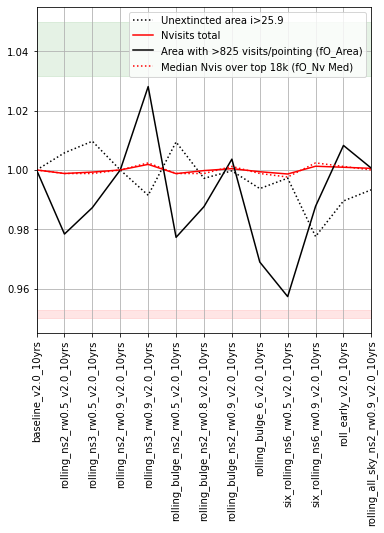

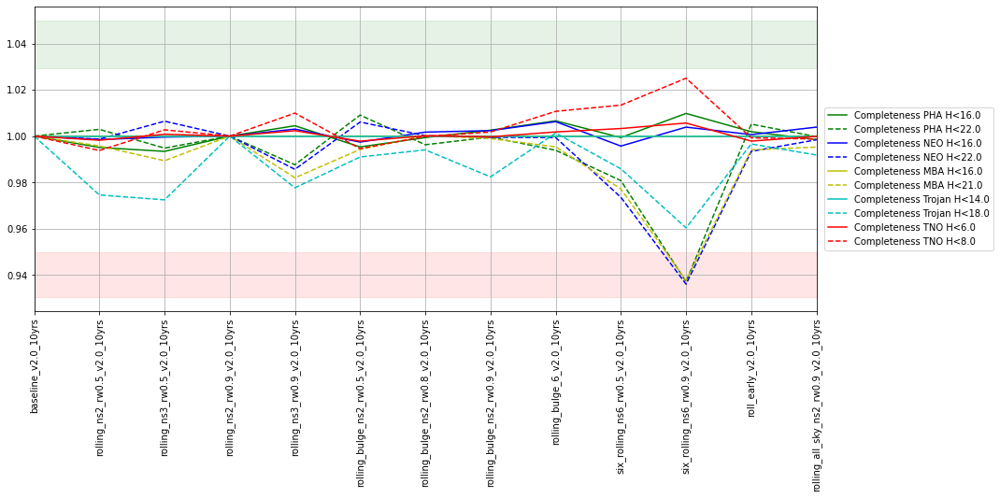

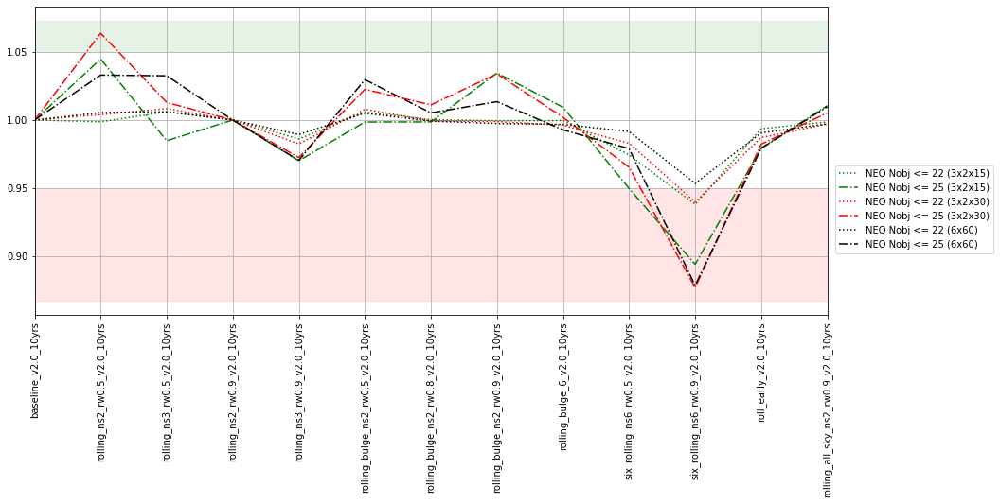

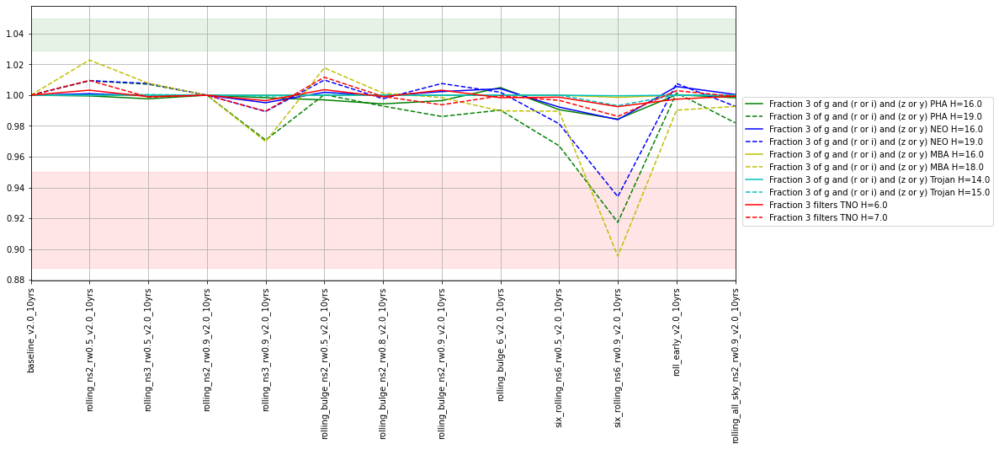

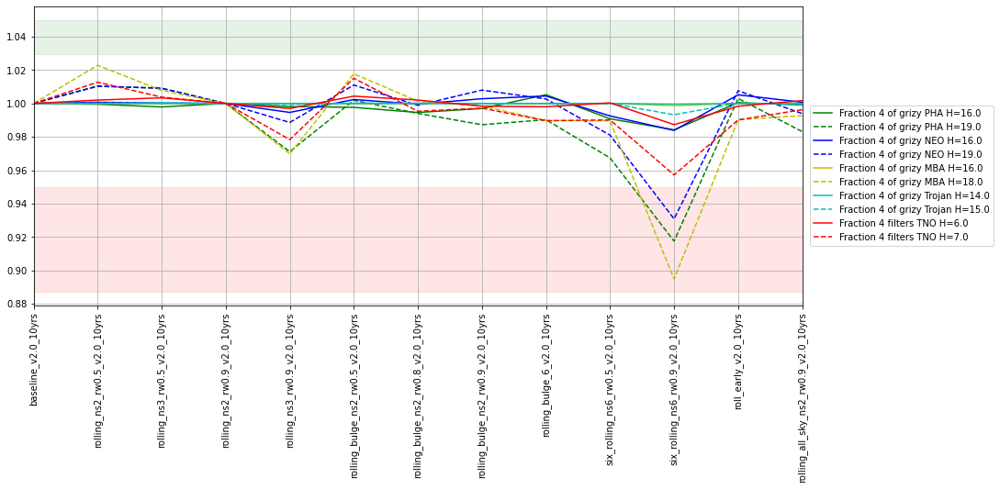

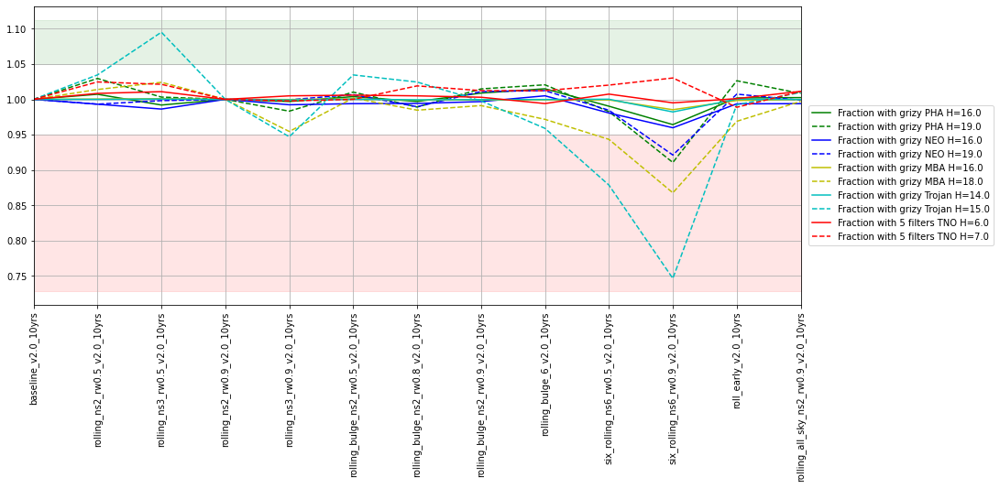

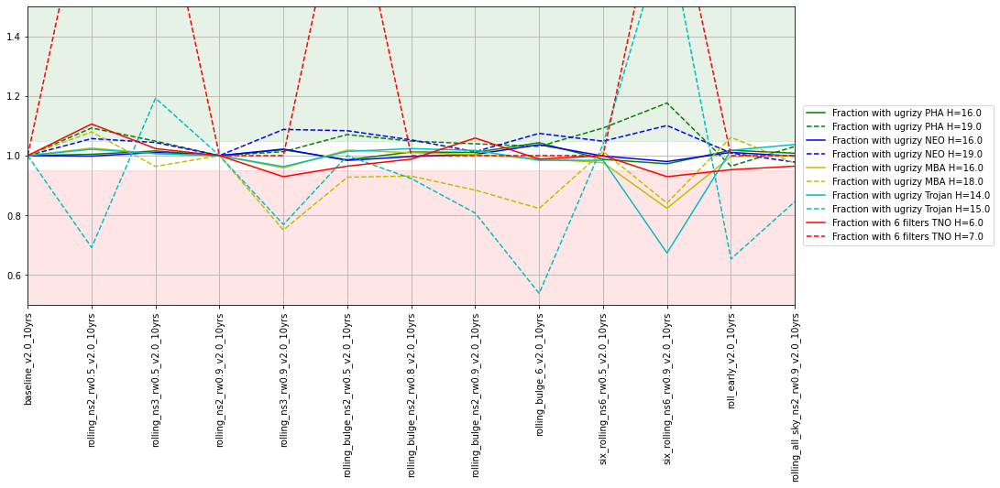

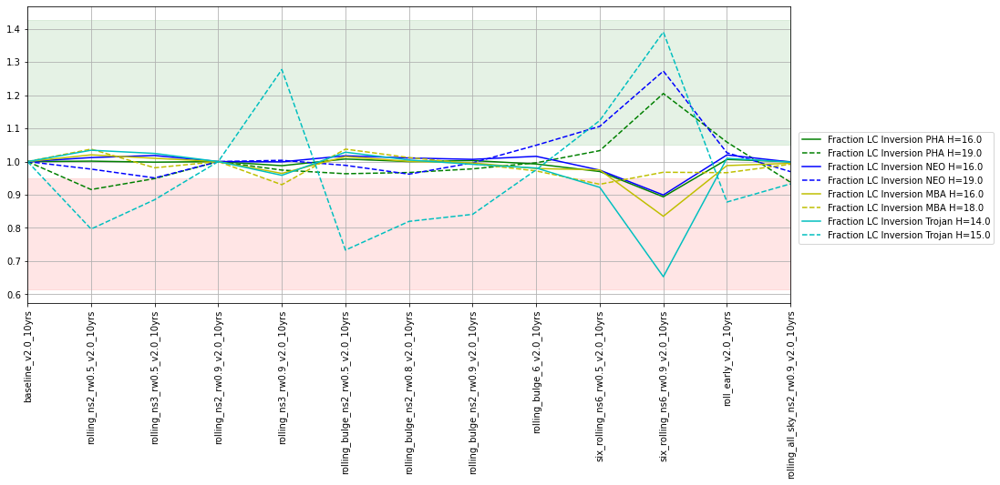

In [10]:
fam = [f for f in family_families.index if 'rolling' in f]
print(fam)
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**presto_half** : The baseline survey strategy takes pairs of visits every few nights, where the pair is separated by about 33 minutes. The pairs are taken in mixed filters, for color measurements. These simulations investigate adding a third visit after a time period of between 1.5 to 4 hours. The triplet visit is in one of the same filters as the earlier pair. This set of simulations take triplets every other night, in the filter combinations described in their brief descriptions.

**presto** : The baseline survey strategy takes pairs of visits every few nights, where the pair is separated by about 33 minutes. The pairs are taken in mixed filters, for color measurements. These simulations investigate adding a third visit after a time period of between 1.5 to 4 hours. The triplet visit is in one of the same filters as the earlier pair. This set of simulations take triplets all the time, in the filter combinations described in their brief descriptions.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
presto_half_gap1.5_v2.0_10yrs,7436.141697,14974.677218,2039120.0,819.0,51.0,69.0,174.0,176.0,156.0,161.0,"Triples spaced 1.5 hours apart g+r,r+i,i+z ini..."
presto_half_gap2.0_v2.0_10yrs,9016.531631,15079.588924,2052706.0,825.0,52.0,69.0,175.0,178.0,157.0,162.0,"Triples spaced 2.0 hours apart g+r,r+i,i+z ini..."
presto_half_gap2.5_v2.0_10yrs,8104.219438,15095.535503,2044849.0,821.0,51.0,69.0,174.0,177.0,156.0,162.0,"Triples spaced 2.5 hours apart g+r,r+i,i+z ini..."
presto_half_gap3.0_v2.0_10yrs,8098.344383,15230.661780,2044562.0,821.0,51.0,69.0,174.0,177.0,156.0,162.0,"Triples spaced 3.0 hours apart g+r,r+i,i+z ini..."
presto_half_gap3.5_v2.0_10yrs,8476.865817,15317.948319,2046991.0,823.0,51.0,69.0,174.0,177.0,157.0,162.0,"Triples spaced 3.5 hours apart g+r,r+i,i+z ini..."
presto_half_gap4.0_v2.0_10yrs,8649.760308,15407.752739,2049239.0,823.0,52.0,69.0,174.0,177.0,157.0,162.0,"Triples spaced 4.0 hours apart g+r,r+i,i+z ini..."
presto_half_gap1.5_mix_v2.0_10yrs,7093.709889,16329.297161,2035981.0,818.0,50.0,69.0,173.0,175.0,157.0,162.0,"Triples spaced 1.5 hours apart g+i,r+z,i+y ini..."
presto_half_gap2.0_mix_v2.0_10yrs,8497.848158,16212.635345,2048771.0,823.0,51.0,69.0,174.0,176.0,158.0,162.0,"Triples spaced 2.0 hours apart g+i,r+z,i+y ini..."


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
presto_half_gap1.5_v2.0_10yrs,0.9476,0.566861,0.9332,0.547261,1.0,0.494838,1.0,0.384842,0.689870,0.454849
presto_half_gap2.0_v2.0_10yrs,0.9448,0.564204,0.9342,0.548480,1.0,0.493708,1.0,0.386255,0.690200,0.452545
presto_half_gap2.5_v2.0_10yrs,0.9416,0.552393,0.9312,0.534753,1.0,0.487905,1.0,0.389913,0.688019,0.442175
presto_half_gap3.0_v2.0_10yrs,0.9390,0.552212,0.9272,0.531117,1.0,0.483869,1.0,0.382304,0.689627,0.448988
presto_half_gap3.5_v2.0_10yrs,0.9404,0.557619,0.9292,0.539056,1.0,0.491859,1.0,0.378806,0.689304,0.446231
presto_half_gap4.0_v2.0_10yrs,0.9380,0.554682,0.9294,0.534560,1.0,0.493026,1.0,0.392449,0.689617,0.446912
presto_half_gap1.5_mix_v2.0_10yrs,0.9474,0.564448,0.9338,0.545040,1.0,0.481428,1.0,0.377566,0.689333,0.450689
presto_half_gap2.0_mix_v2.0_10yrs,0.9440,0.553530,0.9322,0.541076,1.0,0.476198,1.0,0.365275,0.689624,0.446341


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
presto_half_gap1.5_v2.0_10yrs,14927.580974,47958.297926,16415.203615,57972.941070,18782.823733,85304.712910
presto_half_gap2.0_v2.0_10yrs,14961.849789,48619.797252,16322.050060,57528.805206,18739.615182,87684.693704
presto_half_gap2.5_v2.0_10yrs,14597.492183,46717.968792,15961.688864,55872.500662,18691.901848,88903.410319
presto_half_gap3.0_v2.0_10yrs,14498.402144,47114.522416,15966.609856,55807.492804,18650.521682,89897.518604
presto_half_gap3.5_v2.0_10yrs,14707.446467,46191.244682,16013.994480,54507.688108,18650.525759,90877.855901
presto_half_gap4.0_v2.0_10yrs,14590.305152,47709.148157,15942.483161,57671.814455,18550.988189,91175.775486
presto_half_gap1.5_mix_v2.0_10yrs,14870.171069,46547.494869,16311.032563,56060.057189,18644.168705,85173.627031
presto_half_gap2.0_mix_v2.0_10yrs,14763.476853,45662.690713,16170.436008,54654.158103,18608.314788,86520.238263


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0,0.9996,0.6168,0.4794
presto_half_gap1.5_v2.0_10yrs,0.8568,0.5252,0.8676,0.5234,1.0000,0.860372,1.0,0.9994,0.6106,0.4638
presto_half_gap2.0_v2.0_10yrs,0.8528,0.5190,0.8590,0.5146,1.0000,0.862172,1.0,0.9992,0.6112,0.4634
presto_half_gap2.5_v2.0_10yrs,0.8488,0.5148,0.8598,0.5212,0.9998,0.879576,1.0,0.9996,0.6110,0.4632
presto_half_gap3.0_v2.0_10yrs,0.8450,0.5170,0.8554,0.5138,1.0000,0.884177,1.0,0.9998,0.6120,0.4656
presto_half_gap3.5_v2.0_10yrs,0.8436,0.5158,0.8542,0.5162,1.0000,0.886177,1.0,0.9998,0.6122,0.4620
presto_half_gap4.0_v2.0_10yrs,0.8406,0.5116,0.8504,0.5140,1.0000,0.887978,1.0,0.9996,0.6122,0.4658
presto_half_gap1.5_mix_v2.0_10yrs,0.8578,0.5276,0.8654,0.5224,1.0000,0.873175,1.0,0.9998,0.6114,0.4662
presto_half_gap2.0_mix_v2.0_10yrs,0.8512,0.5248,0.8598,0.5220,1.0000,0.888178,1.0,0.9998,0.6120,0.4674


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0,0.9996,0.5978,0.4248
presto_half_gap1.5_v2.0_10yrs,0.8564,0.5246,0.8674,0.5230,1.0000,0.860372,1.0,0.9994,0.5886,0.4006
presto_half_gap2.0_v2.0_10yrs,0.8526,0.5188,0.8586,0.5140,1.0000,0.862172,1.0,0.9992,0.5894,0.4028
presto_half_gap2.5_v2.0_10yrs,0.8484,0.5138,0.8594,0.5200,0.9998,0.879576,1.0,0.9996,0.5886,0.3966
presto_half_gap3.0_v2.0_10yrs,0.8448,0.5160,0.8550,0.5128,1.0000,0.884177,1.0,0.9998,0.5908,0.4040
presto_half_gap3.5_v2.0_10yrs,0.8428,0.5148,0.8542,0.5154,1.0000,0.886177,1.0,0.9998,0.5892,0.3990
presto_half_gap4.0_v2.0_10yrs,0.8402,0.5110,0.8504,0.5140,1.0000,0.887978,1.0,0.9996,0.5914,0.4070
presto_half_gap1.5_mix_v2.0_10yrs,0.8572,0.5266,0.8650,0.5216,1.0000,0.873175,1.0,0.9998,0.5918,0.4056
presto_half_gap2.0_mix_v2.0_10yrs,0.8510,0.5242,0.8594,0.5214,1.0000,0.888178,1.0,0.9998,0.5924,0.4092


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
presto_half_gap1.5_v2.0_10yrs,0.7320,0.3118,0.7588,0.3186,0.994399,0.397680,0.9996,0.5340,0.4028,0.1688
presto_half_gap2.0_v2.0_10yrs,0.7220,0.3030,0.7490,0.3098,0.995399,0.398480,0.9996,0.5086,0.4026,0.1748
presto_half_gap2.5_v2.0_10yrs,0.7192,0.3032,0.7484,0.3144,0.994399,0.400880,0.9996,0.5356,0.4056,0.1756
presto_half_gap3.0_v2.0_10yrs,0.7162,0.2990,0.7424,0.3140,0.995599,0.413283,0.9996,0.5742,0.4064,0.1780
presto_half_gap3.5_v2.0_10yrs,0.7168,0.2992,0.7398,0.3110,0.995399,0.411282,0.9994,0.5546,0.4058,0.1764
presto_half_gap4.0_v2.0_10yrs,0.7148,0.2974,0.7368,0.3132,0.995199,0.411882,0.9992,0.5584,0.4066,0.1712
presto_half_gap1.5_mix_v2.0_10yrs,0.7270,0.3104,0.7534,0.3130,0.994999,0.397680,0.9990,0.4742,0.4072,0.1748
presto_half_gap2.0_mix_v2.0_10yrs,0.7192,0.3036,0.7490,0.3162,0.993999,0.396879,0.9998,0.4764,0.4046,0.1672


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,2.000000e-04
presto_half_gap1.5_v2.0_10yrs,0.4344,0.0414,0.4504,0.0356,0.861772,0.034407,0.8700,0.0014,0.0136,5.312591e-18
presto_half_gap2.0_v2.0_10yrs,0.4350,0.0402,0.4590,0.0410,0.850770,0.034607,0.8708,0.0022,0.0144,2.000000e-04
presto_half_gap2.5_v2.0_10yrs,0.4386,0.0422,0.4582,0.0398,0.863173,0.034407,0.8670,0.0016,0.0146,2.000000e-04
presto_half_gap3.0_v2.0_10yrs,0.4366,0.0406,0.4550,0.0400,0.852370,0.030606,0.8724,0.0016,0.0144,2.000000e-04
presto_half_gap3.5_v2.0_10yrs,0.4376,0.0428,0.4534,0.0420,0.864973,0.033207,0.8630,0.0026,0.0144,2.000000e-04
presto_half_gap4.0_v2.0_10yrs,0.4282,0.0394,0.4490,0.0414,0.865173,0.033407,0.8910,0.0022,0.0142,2.000000e-04
presto_half_gap1.5_mix_v2.0_10yrs,0.4178,0.0406,0.4448,0.0386,0.847169,0.034007,0.8466,0.0016,0.0126,2.000000e-04
presto_half_gap2.0_mix_v2.0_10yrs,0.4302,0.0446,0.4542,0.0400,0.848970,0.031406,0.8662,0.0034,0.0134,2.000000e-04


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
presto_half_gap1.5_v2.0_10yrs,0.4876,0.0484,0.5090,0.0490,0.945189,0.114823,0.9236,0.0532
presto_half_gap2.0_v2.0_10yrs,0.4722,0.0486,0.4926,0.0464,0.948390,0.121624,0.9230,0.0490
presto_half_gap2.5_v2.0_10yrs,0.4640,0.0468,0.4814,0.0482,0.942589,0.124625,0.9238,0.0676
presto_half_gap3.0_v2.0_10yrs,0.4598,0.0446,0.4746,0.0476,0.941188,0.126625,0.9302,0.0616
presto_half_gap3.5_v2.0_10yrs,0.4568,0.0466,0.4764,0.0490,0.945389,0.128626,0.9274,0.0604
presto_half_gap4.0_v2.0_10yrs,0.4500,0.0452,0.4720,0.0464,0.947990,0.134827,0.9396,0.0782
presto_half_gap1.5_mix_v2.0_10yrs,0.4728,0.0418,0.4910,0.0414,0.918584,0.085617,0.8562,0.0290
presto_half_gap2.0_mix_v2.0_10yrs,0.4662,0.0434,0.4830,0.0420,0.928186,0.091618,0.8610,0.0308


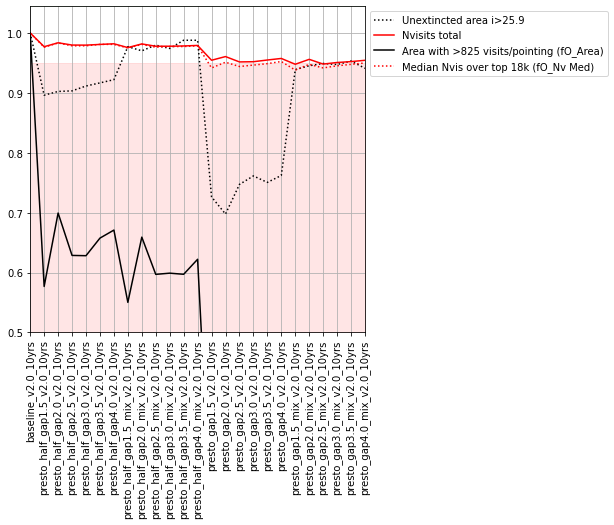

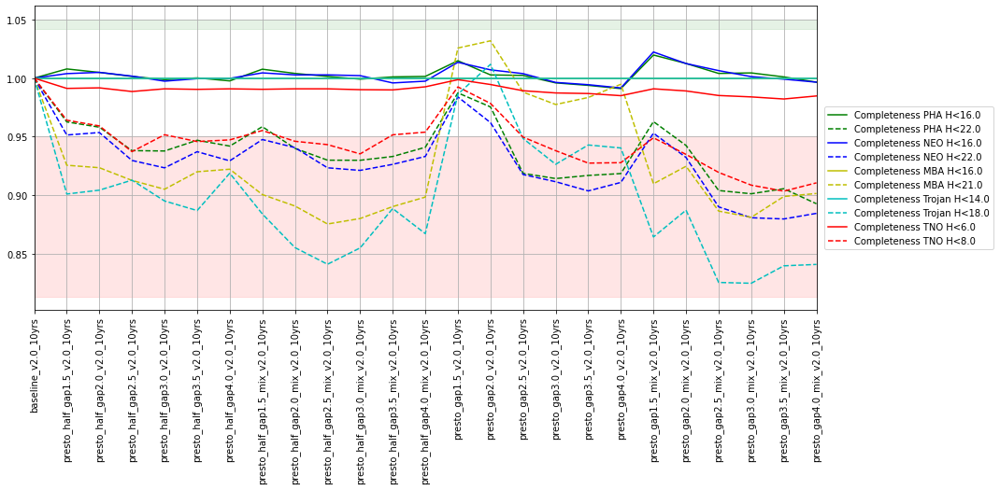

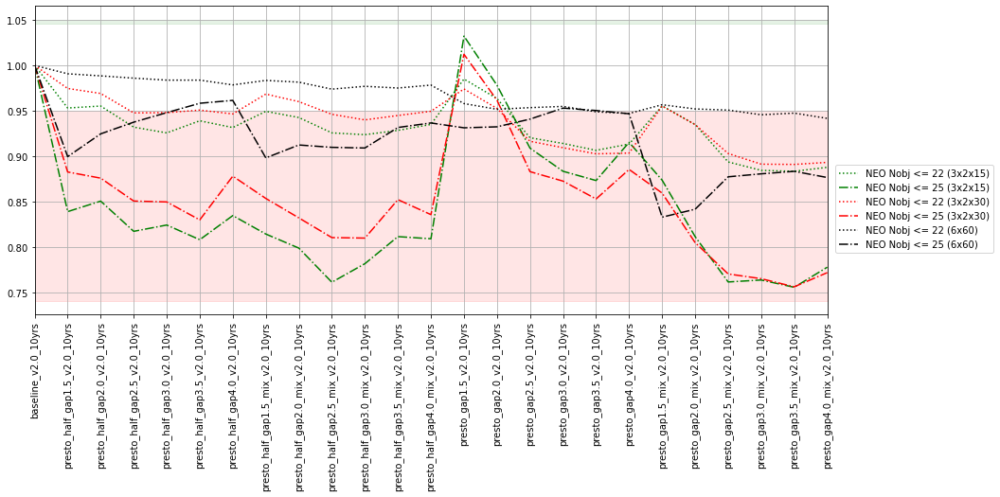

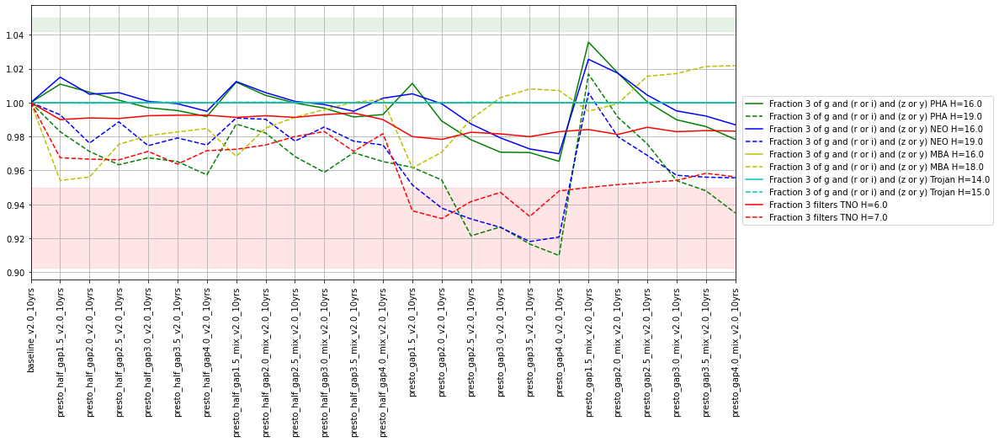

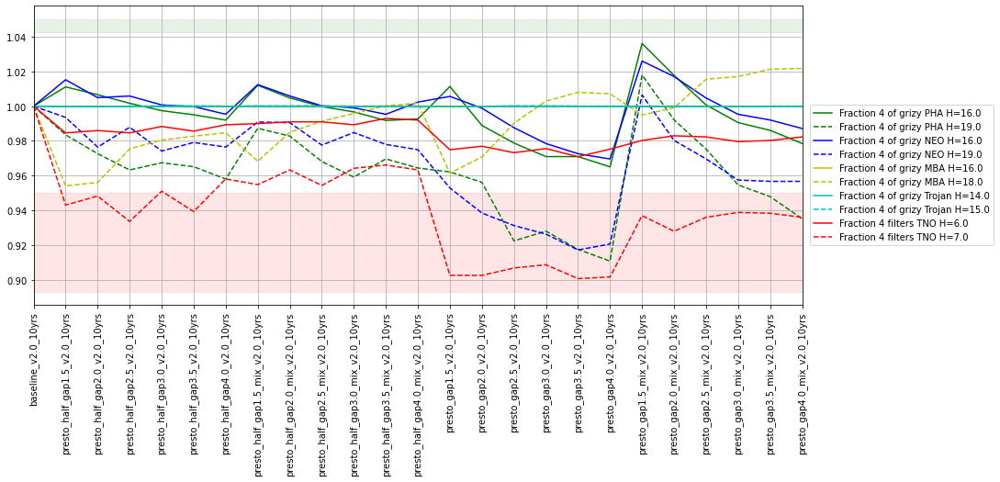

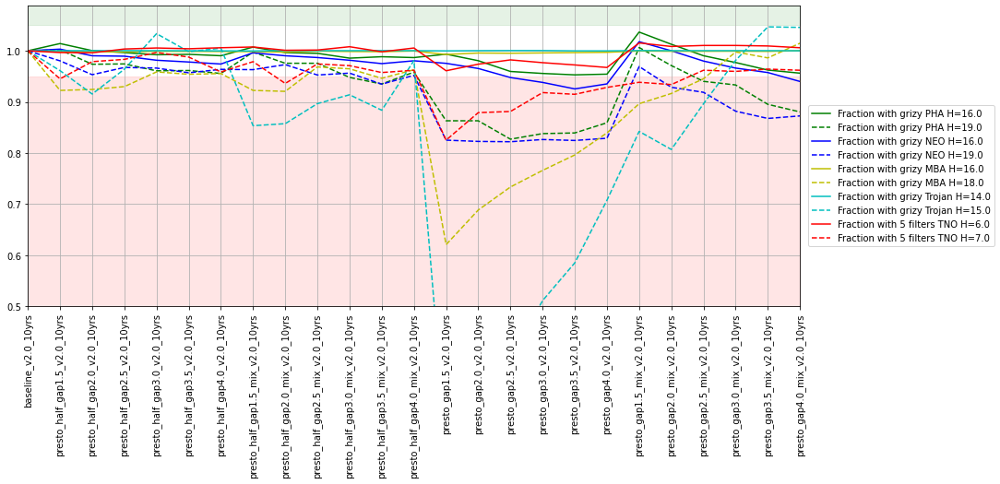

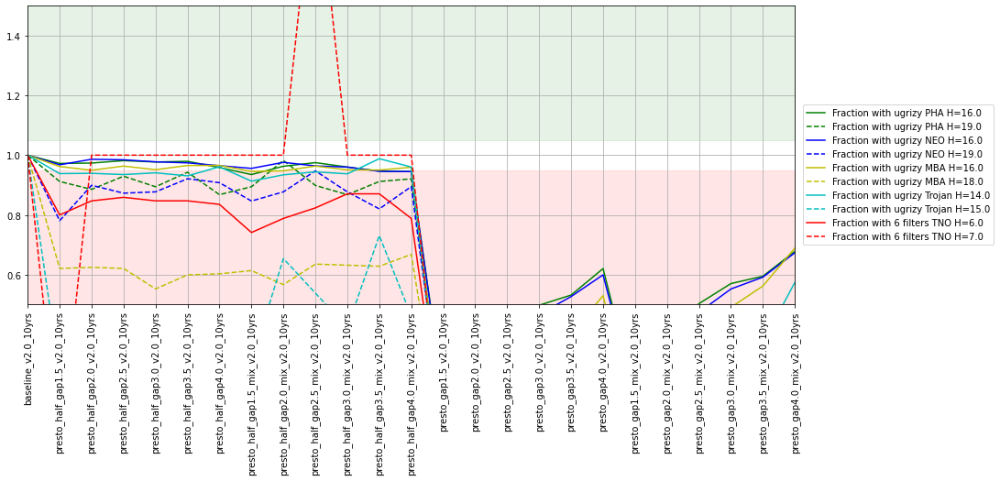

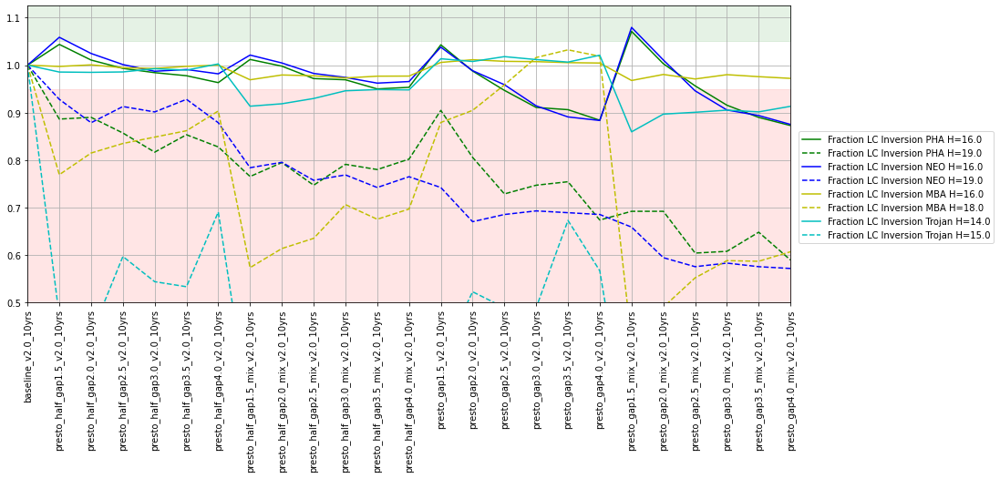

In [11]:
fam = ['presto_half', 'presto']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**long_gaps** : The baseline survey strategy takes pairs of visits every few nights, wherethe pair is separated by about 33 minutes. The pairs are taken in mixed filters, for color measurements. These simulations add a third visit after a variable time period of between 2 to 7 hours. The triplet visit is in one of the same filters as the earlier pair, and only occurs if the first pair is in contained within griz filters. In some of the simulations, these triplet visits are obtained throughout the survey, while for other simulations the triplets do not start until year 5.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
long_gaps_nightsoff7_delayed1827_v2.0_10yrs,12702.709320,16691.032722,2085109.0,838.0,54.0,70.0,177.0,180.0,160.0,166.0,Long gaps every 7 nights starting after year 5
long_gaps_nightsoff6_delayed1827_v2.0_10yrs,12451.760520,16642.353691,2084436.0,837.0,54.0,70.0,177.0,180.0,160.0,166.0,Long gaps every 6 nights starting after year 5
long_gaps_nightsoff5_delayed1827_v2.0_10yrs,12548.279290,16660.818151,2084570.0,838.0,54.0,70.0,177.0,180.0,160.0,166.0,Long gaps every 5 nights starting after year 5
long_gaps_nightsoff4_delayed1827_v2.0_10yrs,12463.510631,16612.139120,2083856.0,837.0,54.0,69.0,177.0,180.0,160.0,166.0,Long gaps every 4 nights starting after year 5
long_gaps_nightsoff3_delayed1827_v2.0_10yrs,12372.866918,16570.174437,2082889.0,837.0,53.0,70.0,177.0,180.0,160.0,165.0,Long gaps every 3 nights starting after year 5
long_gaps_nightsoff2_delayed1827_v2.0_10yrs,12188.222316,16565.977969,2081844.0,836.0,53.0,70.0,177.0,180.0,159.0,165.0,Long gaps every 2 nights starting after year 5
long_gaps_nightsoff1_delayed1827_v2.0_10yrs,11770.254080,16421.619462,2078434.0,834.0,53.0,70.0,177.0,180.0,159.0,165.0,Long gaps every other night starting after year 5
long_gaps_nightsoff0_delayed1827_v2.0_10yrs,10288.900797,15954.132902,2067452.0,830.0,50.0,70.0,177.0,180.0,158.0,162.0,Long gaps every night starting after year 5


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
long_gaps_nightsoff7_delayed1827_v2.0_10yrs,0.9410,0.587783,0.9276,0.571854,1.0,0.533646,1.0,0.426110,0.695393,0.471034
long_gaps_nightsoff6_delayed1827_v2.0_10yrs,0.9414,0.586975,0.9302,0.570659,1.0,0.533348,1.0,0.423776,0.695492,0.470817
long_gaps_nightsoff5_delayed1827_v2.0_10yrs,0.9412,0.586708,0.9300,0.572950,1.0,0.530919,1.0,0.423493,0.695634,0.470580
long_gaps_nightsoff4_delayed1827_v2.0_10yrs,0.9424,0.585586,0.9296,0.569628,1.0,0.530993,1.0,0.420486,0.695382,0.471330
long_gaps_nightsoff3_delayed1827_v2.0_10yrs,0.9418,0.583807,0.9306,0.572408,1.0,0.530383,1.0,0.426742,0.697296,0.471025
long_gaps_nightsoff2_delayed1827_v2.0_10yrs,0.9402,0.582369,0.9270,0.567917,1.0,0.527094,1.0,0.419130,0.694893,0.469139
long_gaps_nightsoff1_delayed1827_v2.0_10yrs,0.9412,0.579769,0.9288,0.563721,1.0,0.526900,1.0,0.414592,0.695158,0.470159
long_gaps_nightsoff0_delayed1827_v2.0_10yrs,0.9396,0.575661,0.9276,0.559248,1.0,0.535373,1.0,0.419865,0.694190,0.469287


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
long_gaps_nightsoff7_delayed1827_v2.0_10yrs,15573.121041,56325.579758,16769.434755,65739.063215,18931.819008,94665.135690
long_gaps_nightsoff6_delayed1827_v2.0_10yrs,15543.115853,56474.940324,16675.888871,65370.860448,18900.911196,94708.776241
long_gaps_nightsoff5_delayed1827_v2.0_10yrs,15603.483976,57337.519626,16770.500366,66055.093333,18903.294880,95175.679535
long_gaps_nightsoff4_delayed1827_v2.0_10yrs,15514.760866,55684.639100,16659.036560,64296.722600,18878.307448,94337.016791
long_gaps_nightsoff3_delayed1827_v2.0_10yrs,15589.262320,55508.395567,16730.459113,64597.384039,18911.331238,94461.854532
long_gaps_nightsoff2_delayed1827_v2.0_10yrs,15469.155945,56669.087958,16659.092172,64681.410269,18822.815646,94174.014932
long_gaps_nightsoff1_delayed1827_v2.0_10yrs,15359.532834,55018.300453,16526.841447,63954.531162,18790.224238,93423.373656
long_gaps_nightsoff0_delayed1827_v2.0_10yrs,15240.980773,54978.229693,16332.620926,62135.264780,18643.363358,91018.679364


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0,0.901780,1.0,0.9996,0.6168,0.4794
long_gaps_nightsoff7_delayed1827_v2.0_10yrs,0.8486,0.5344,0.8568,0.5304,1.0,0.901580,1.0,0.9998,0.6184,0.4810
long_gaps_nightsoff6_delayed1827_v2.0_10yrs,0.8466,0.5302,0.8554,0.5278,1.0,0.903181,1.0,0.9998,0.6166,0.4792
long_gaps_nightsoff5_delayed1827_v2.0_10yrs,0.8478,0.5296,0.8592,0.5314,1.0,0.899180,1.0,0.9998,0.6174,0.4824
long_gaps_nightsoff4_delayed1827_v2.0_10yrs,0.8444,0.5250,0.8540,0.5316,1.0,0.904181,1.0,0.9996,0.6160,0.4814
long_gaps_nightsoff3_delayed1827_v2.0_10yrs,0.8446,0.5282,0.8534,0.5290,1.0,0.903181,1.0,0.9998,0.6170,0.4780
long_gaps_nightsoff2_delayed1827_v2.0_10yrs,0.8452,0.5284,0.8538,0.5254,1.0,0.901580,1.0,0.9994,0.6166,0.4820
long_gaps_nightsoff1_delayed1827_v2.0_10yrs,0.8448,0.5256,0.8562,0.5270,1.0,0.899580,1.0,0.9998,0.6168,0.4764
long_gaps_nightsoff0_delayed1827_v2.0_10yrs,0.8416,0.5182,0.8480,0.5158,1.0,0.901780,1.0,0.9996,0.6138,0.4726


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0,0.901780,1.0,0.9996,0.5978,0.4248
long_gaps_nightsoff7_delayed1827_v2.0_10yrs,0.8478,0.5342,0.8562,0.5300,1.0,0.901580,1.0,0.9998,0.5998,0.4258
long_gaps_nightsoff6_delayed1827_v2.0_10yrs,0.8464,0.5296,0.8552,0.5276,1.0,0.903181,1.0,0.9998,0.5974,0.4212
long_gaps_nightsoff5_delayed1827_v2.0_10yrs,0.8472,0.5286,0.8592,0.5312,1.0,0.898980,1.0,0.9998,0.5976,0.4276
long_gaps_nightsoff4_delayed1827_v2.0_10yrs,0.8442,0.5242,0.8538,0.5312,1.0,0.904181,1.0,0.9996,0.5978,0.4258
long_gaps_nightsoff3_delayed1827_v2.0_10yrs,0.8442,0.5274,0.8532,0.5286,1.0,0.903181,1.0,0.9998,0.5968,0.4232
long_gaps_nightsoff2_delayed1827_v2.0_10yrs,0.8448,0.5280,0.8534,0.5248,1.0,0.901580,1.0,0.9994,0.5980,0.4238
long_gaps_nightsoff1_delayed1827_v2.0_10yrs,0.8440,0.5250,0.8560,0.5268,1.0,0.899580,1.0,0.9998,0.5968,0.4192
long_gaps_nightsoff0_delayed1827_v2.0_10yrs,0.8410,0.5170,0.8476,0.5156,1.0,0.901780,1.0,0.9996,0.5916,0.4110


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
long_gaps_nightsoff7_delayed1827_v2.0_10yrs,0.7228,0.3100,0.7518,0.3248,0.996199,0.426485,0.9994,0.5720,0.4032,0.1756
long_gaps_nightsoff6_delayed1827_v2.0_10yrs,0.7212,0.3070,0.7552,0.3234,0.995999,0.422084,0.9990,0.5664,0.4022,0.1770
long_gaps_nightsoff5_delayed1827_v2.0_10yrs,0.7240,0.3048,0.7542,0.3196,0.995399,0.423685,0.9992,0.5494,0.4018,0.1774
long_gaps_nightsoff4_delayed1827_v2.0_10yrs,0.7216,0.3120,0.7530,0.3220,0.996199,0.433887,0.9994,0.5958,0.4056,0.1800
long_gaps_nightsoff3_delayed1827_v2.0_10yrs,0.7210,0.3070,0.7542,0.3238,0.995599,0.426285,0.9992,0.5706,0.4042,0.1820
long_gaps_nightsoff2_delayed1827_v2.0_10yrs,0.7192,0.3088,0.7548,0.3204,0.995399,0.431686,0.9992,0.6004,0.4012,0.1774
long_gaps_nightsoff1_delayed1827_v2.0_10yrs,0.7190,0.3060,0.7492,0.3198,0.995799,0.429686,0.9994,0.5760,0.4036,0.1776
long_gaps_nightsoff0_delayed1827_v2.0_10yrs,0.7088,0.2958,0.7430,0.3102,0.995599,0.426885,0.9996,0.5696,0.4014,0.1796


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
long_gaps_nightsoff7_delayed1827_v2.0_10yrs,0.4460,0.0502,0.4726,0.0474,0.899180,0.052611,0.9482,0.0050,0.0170,0.0002
long_gaps_nightsoff6_delayed1827_v2.0_10yrs,0.4478,0.0462,0.4708,0.0476,0.895379,0.052811,0.9430,0.0058,0.0178,0.0002
long_gaps_nightsoff5_delayed1827_v2.0_10yrs,0.4410,0.0468,0.4652,0.0450,0.899180,0.051410,0.9378,0.0054,0.0172,0.0004
long_gaps_nightsoff4_delayed1827_v2.0_10yrs,0.4416,0.0466,0.4762,0.0470,0.894379,0.052410,0.9292,0.0052,0.0166,0.0004
long_gaps_nightsoff3_delayed1827_v2.0_10yrs,0.4504,0.0478,0.4690,0.0496,0.900380,0.051210,0.9418,0.0054,0.0170,0.0002
long_gaps_nightsoff2_delayed1827_v2.0_10yrs,0.4482,0.0488,0.4692,0.0484,0.893379,0.053811,0.9420,0.0050,0.0174,0.0002
long_gaps_nightsoff1_delayed1827_v2.0_10yrs,0.4394,0.0432,0.4694,0.0476,0.890378,0.052410,0.9228,0.0048,0.0178,0.0002
long_gaps_nightsoff0_delayed1827_v2.0_10yrs,0.4158,0.0392,0.4428,0.0396,0.858772,0.038608,0.8630,0.0054,0.0156,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
long_gaps_nightsoff7_delayed1827_v2.0_10yrs,0.4712,0.0528,0.4820,0.0506,0.947189,0.145229,0.9322,0.1086
long_gaps_nightsoff6_delayed1827_v2.0_10yrs,0.4674,0.0510,0.4818,0.0512,0.942989,0.146629,0.9330,0.1124
long_gaps_nightsoff5_delayed1827_v2.0_10yrs,0.4674,0.0518,0.4850,0.0518,0.945989,0.147830,0.9302,0.1040
long_gaps_nightsoff4_delayed1827_v2.0_10yrs,0.4670,0.0530,0.4798,0.0536,0.941388,0.144229,0.9284,0.1082
long_gaps_nightsoff3_delayed1827_v2.0_10yrs,0.4670,0.0530,0.4802,0.0524,0.943989,0.143029,0.9336,0.1148
long_gaps_nightsoff2_delayed1827_v2.0_10yrs,0.4642,0.0518,0.4794,0.0486,0.942989,0.145229,0.9300,0.1082
long_gaps_nightsoff1_delayed1827_v2.0_10yrs,0.4654,0.0524,0.4782,0.0498,0.943389,0.144029,0.9254,0.0990
long_gaps_nightsoff0_delayed1827_v2.0_10yrs,0.4534,0.0472,0.4628,0.0440,0.943389,0.138828,0.9294,0.0900


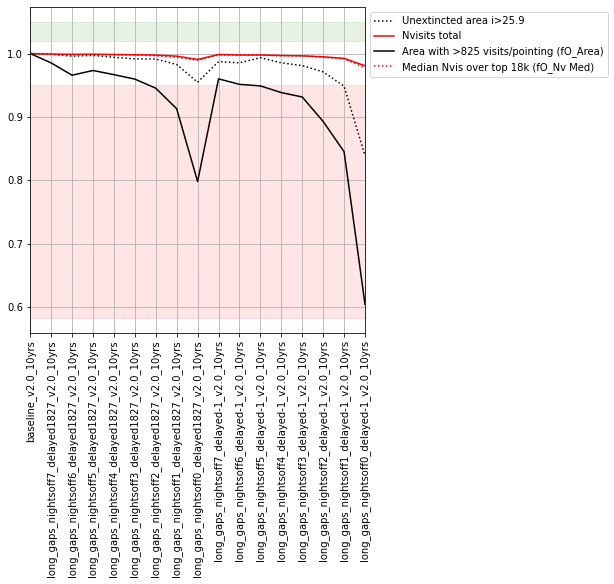

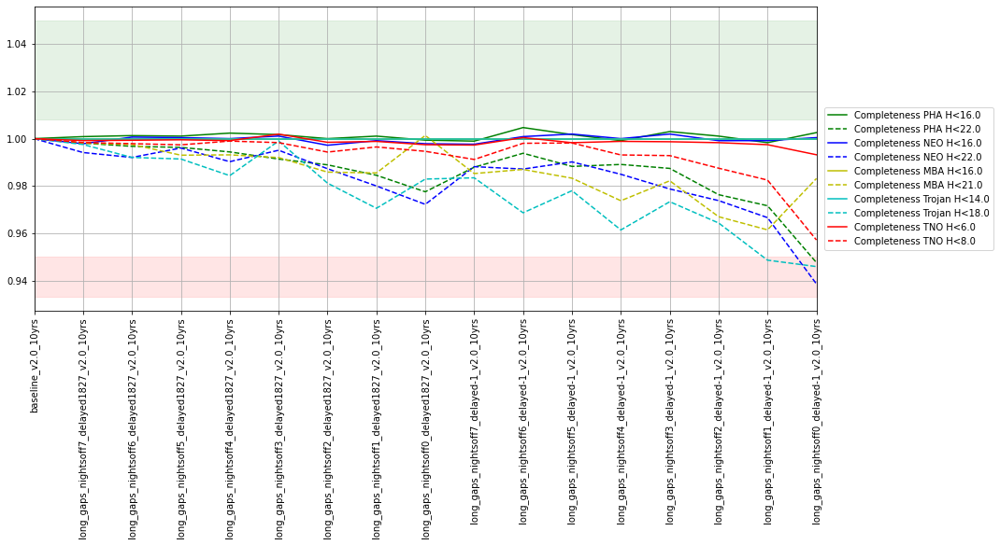

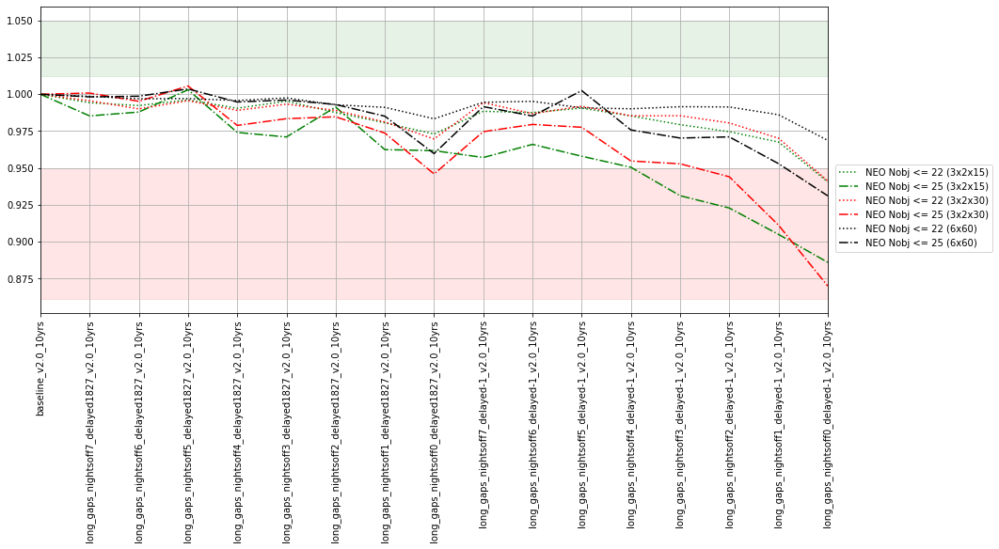

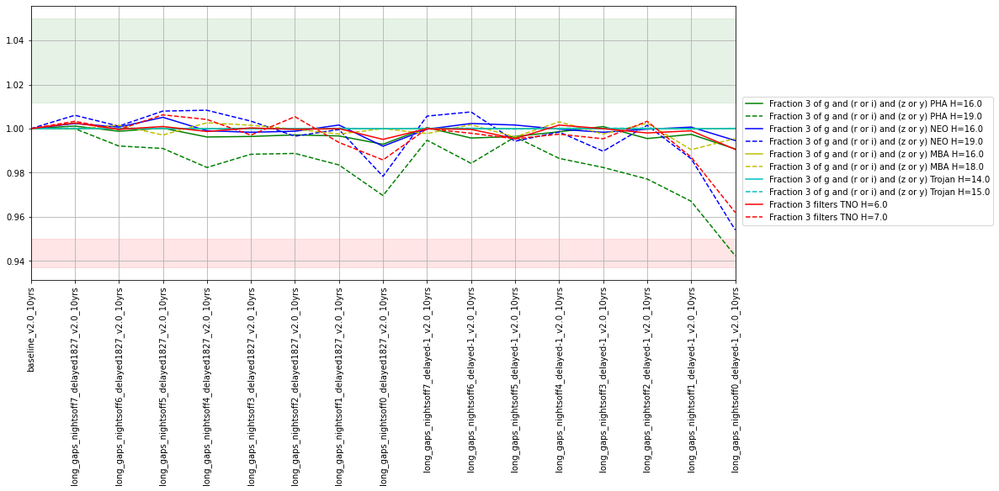

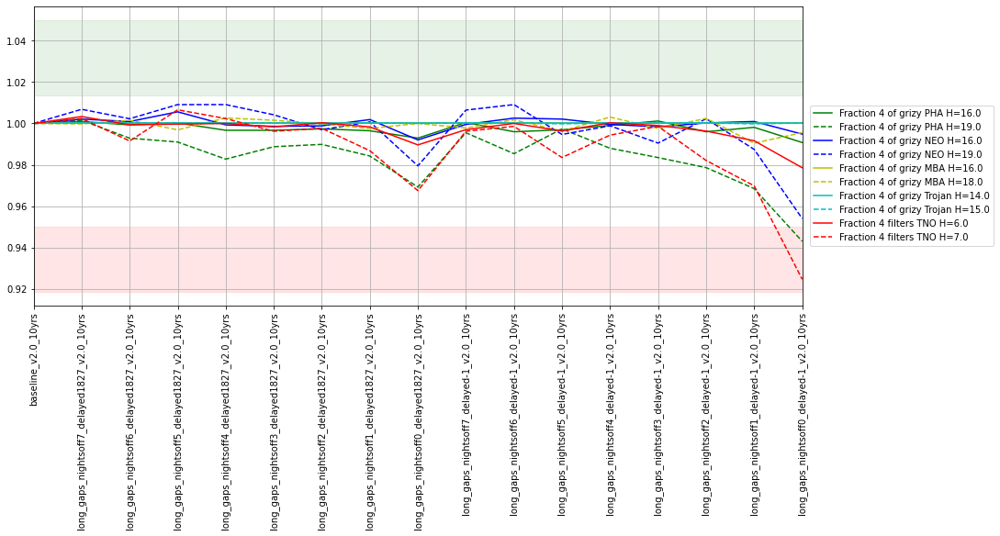

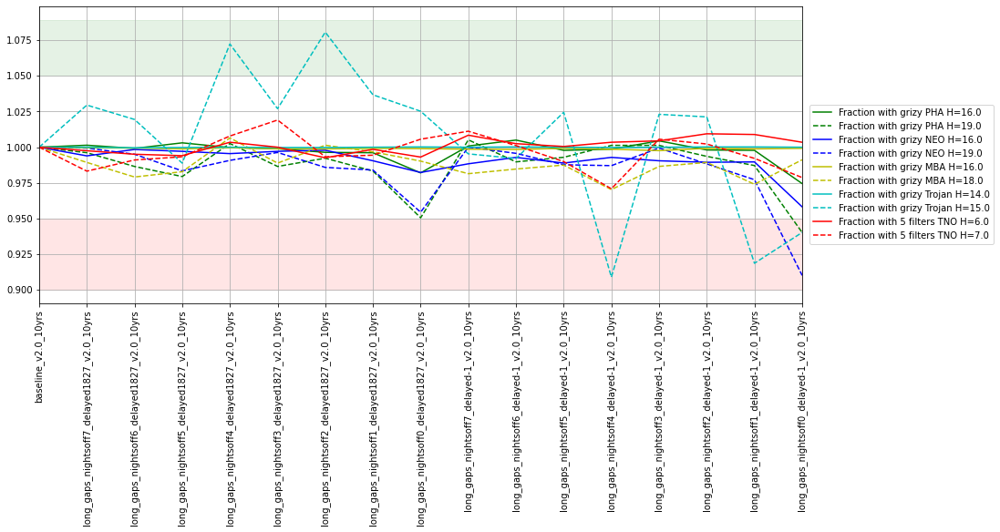

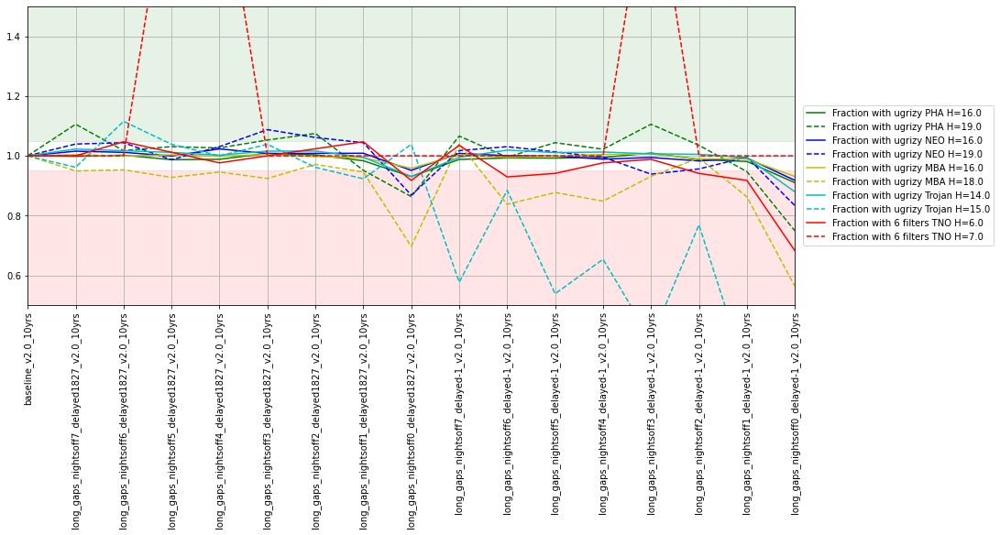

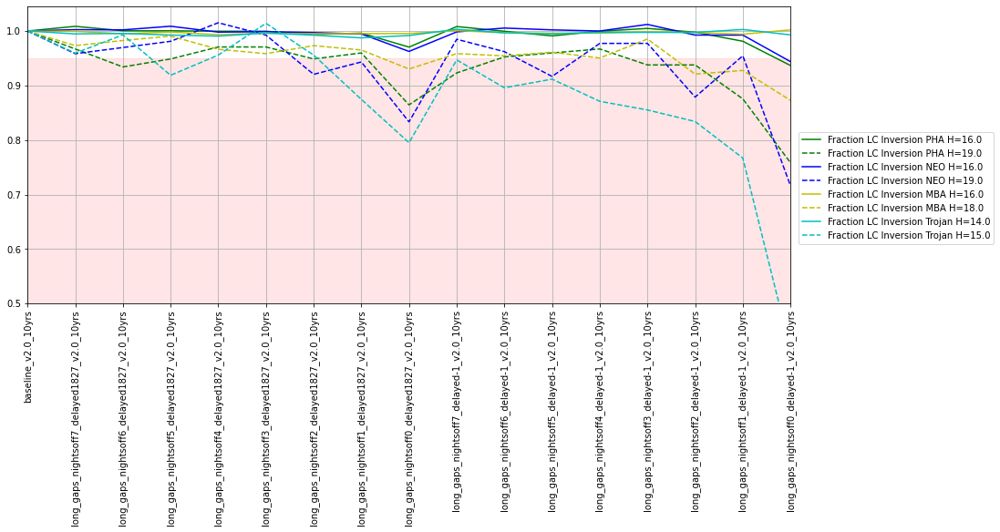

In [12]:
fam = ['long_gaps']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**long_gaps_nopair** : The baseline survey strategy takes pairs of visits every few nights, wherethe pair is separated by about 33 minutes. The pairs are taken in mixed filters, for color measurements. These simulations extend the gap between the pair of visits, modifying it to a variable time period of between 2 to 7 hours. The pair of visits are both in the same filter, in any of griz (g+r, r+i, or i+z pairs). In some of the simulations, these triplet visits are obtained throughout the survey, while for other simulations the triplets do not start until year 5.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,12520.582599,16675.925437,2084679.0,837.0,53.0,70.0,177.0,179.0,160.0,166.0,long gap pairs every 7 nights starting after y...
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,12443.367584,16766.569150,2083998.0,837.0,53.0,69.0,177.0,179.0,160.0,166.0,long gap pairs every 6 nights starting after y...
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,12414.831600,16655.782389,2083679.0,837.0,53.0,70.0,177.0,179.0,160.0,166.0,long gap pairs every 5 nights starting after y...
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,12335.937997,16678.443318,2082707.0,837.0,53.0,70.0,177.0,179.0,160.0,166.0,Long gap pairs every 4 nights starting after y...
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,12362.795394,16618.853469,2082329.0,837.0,53.0,70.0,177.0,179.0,160.0,165.0,Long gap pairs every 3 nights starting after y...
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,12073.239086,16607.103358,2080554.0,836.0,53.0,70.0,177.0,179.0,160.0,165.0,Long gap pairs every 2 nights starting after y...
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,11339.696440,16539.120573,2075040.0,833.0,52.0,69.0,177.0,178.0,160.0,164.0,Long gap pairs every other night starting afte...
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,9217.122812,15952.454315,2059335.0,825.0,48.0,70.0,176.0,176.0,159.0,160.0,Long gap pairs every night starting after year 5


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.9406,0.584432,0.9314,0.571143,1.0,0.531656,1.0,0.421749,0.696165,0.471400
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.9392,0.582092,0.9302,0.570255,1.0,0.531766,1.0,0.421755,0.695805,0.472795
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.9378,0.581347,0.9294,0.570071,1.0,0.534389,1.0,0.426139,0.695404,0.471910
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.9394,0.580846,0.9300,0.569868,1.0,0.529861,1.0,0.421378,0.695987,0.470337
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.9394,0.580839,0.9282,0.568076,1.0,0.529994,1.0,0.425889,0.694365,0.470542
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.9384,0.579987,0.9292,0.565355,1.0,0.528902,1.0,0.420311,0.695375,0.471464
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.9412,0.573136,0.9310,0.557841,1.0,0.522116,1.0,0.414874,0.694946,0.469958
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.9360,0.562478,0.9282,0.546030,1.0,0.525946,1.0,0.410816,0.694403,0.468116


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,15555.918652,56424.913486,16769.705269,64778.204918,18934.728734,94582.856848
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,15532.426777,55988.560399,16727.041426,64785.635914,18872.110397,94680.309301
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,15527.272541,56478.495806,16746.510956,65310.397366,18911.839404,94133.178498
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,15521.525712,56853.219036,16683.897405,65209.916819,18878.706009,95118.220097
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,15472.770973,55963.701493,16663.160598,64744.690695,18830.795519,94036.370631
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,15402.690995,55714.703612,16587.053264,64217.916513,18777.056276,92846.634904
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,15205.109206,53559.147451,16409.920138,62339.388942,18774.751015,93098.039807
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,14891.602589,52226.946702,16068.704488,60199.427557,18542.171441,90738.777592


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0,0.9996,0.6168,0.4794
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.8452,0.5292,0.8546,0.5258,1.0000,0.904781,1.0,0.9998,0.6164,0.4804
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.8462,0.5300,0.8554,0.5274,1.0000,0.901780,1.0,0.9996,0.6164,0.4786
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.8460,0.5302,0.8564,0.5252,1.0000,0.901580,1.0,0.9998,0.6176,0.4818
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.8468,0.5278,0.8550,0.5218,1.0000,0.902380,1.0,0.9998,0.6164,0.4764
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.8458,0.5300,0.8564,0.5232,1.0000,0.904581,1.0,0.9996,0.6168,0.4798
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.8458,0.5266,0.8538,0.5236,1.0000,0.903381,1.0,0.9998,0.6166,0.4814
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.8422,0.5178,0.8512,0.5226,1.0000,0.901580,1.0,0.9996,0.6152,0.4784
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.8348,0.5092,0.8468,0.5062,1.0000,0.905381,1.0,0.9998,0.6122,0.4686


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0,0.9996,0.5978,0.4248
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.8446,0.5286,0.8546,0.5248,1.0000,0.904781,1.0,0.9998,0.5986,0.4262
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.8462,0.5294,0.8548,0.5270,1.0000,0.901780,1.0,0.9996,0.5976,0.4252
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.8454,0.5296,0.8562,0.5240,1.0000,0.901580,1.0,0.9998,0.5990,0.4256
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.8464,0.5272,0.8550,0.5214,1.0000,0.902380,1.0,0.9998,0.5960,0.4174
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.8454,0.5292,0.8562,0.5226,1.0000,0.904381,1.0,0.9996,0.5968,0.4254
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.8454,0.5256,0.8534,0.5222,1.0000,0.903181,1.0,0.9998,0.5960,0.4252
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.8416,0.5170,0.8510,0.5218,1.0000,0.901580,1.0,0.9996,0.5942,0.4198
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.8342,0.5078,0.8466,0.5056,1.0000,0.905381,1.0,0.9998,0.5912,0.4070


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.7222,0.3108,0.7506,0.3244,0.995999,0.420884,0.9992,0.5508,0.4034,0.1812
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.7186,0.3072,0.7536,0.3228,0.995999,0.429886,0.9992,0.5700,0.4044,0.1790
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.7196,0.3116,0.7490,0.3186,0.995199,0.424085,0.9992,0.5498,0.4012,0.1788
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.7222,0.3102,0.7486,0.3220,0.996199,0.426685,0.9994,0.5798,0.4016,0.1788
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.7200,0.3060,0.7486,0.3266,0.995799,0.422084,0.9992,0.5584,0.4016,0.1804
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.7188,0.3034,0.7452,0.3174,0.995799,0.428886,0.9992,0.5646,0.4064,0.1802
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.7154,0.3034,0.7450,0.3180,0.995599,0.427085,0.9992,0.6006,0.4038,0.1790
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.6964,0.2888,0.7352,0.2994,0.995599,0.428886,0.9996,0.5874,0.4006,0.1804


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.4470,0.0470,0.4684,0.0474,0.894379,0.052611,0.9358,0.0050,0.0160,0.0002
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.4408,0.0450,0.4696,0.0460,0.897780,0.047009,0.9272,0.0050,0.0166,0.0002
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.4488,0.0478,0.4662,0.0474,0.891178,0.053811,0.9420,0.0052,0.0164,0.0002
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.4454,0.0482,0.4634,0.0466,0.894379,0.056011,0.9316,0.0048,0.0172,0.0002
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.4430,0.0464,0.4656,0.0462,0.890778,0.051610,0.9398,0.0044,0.0176,0.0004
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.4362,0.0430,0.4644,0.0472,0.885977,0.048810,0.9332,0.0052,0.0162,0.0002
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.4234,0.0452,0.4564,0.0412,0.875375,0.050810,0.9172,0.0048,0.0164,0.0002
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.3860,0.0358,0.4160,0.0380,0.833967,0.037407,0.8238,0.0042,0.0140,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
long_gaps_np_nightsoff7_delayed1827_v2.0_10yrs,0.4672,0.0508,0.4826,0.0512,0.945589,0.149630,0.9318,0.1100
long_gaps_np_nightsoff6_delayed1827_v2.0_10yrs,0.4684,0.0512,0.4772,0.0514,0.944389,0.145829,0.9284,0.1032
long_gaps_np_nightsoff5_delayed1827_v2.0_10yrs,0.4676,0.0510,0.4794,0.0508,0.946389,0.146429,0.9368,0.1080
long_gaps_np_nightsoff4_delayed1827_v2.0_10yrs,0.4612,0.0506,0.4786,0.0522,0.941388,0.145629,0.9374,0.1084
long_gaps_np_nightsoff3_delayed1827_v2.0_10yrs,0.4644,0.0512,0.4776,0.0502,0.944389,0.147429,0.9386,0.1108
long_gaps_np_nightsoff2_delayed1827_v2.0_10yrs,0.4640,0.0512,0.4786,0.0478,0.943389,0.143429,0.9272,0.1046
long_gaps_np_nightsoff1_delayed1827_v2.0_10yrs,0.4604,0.0500,0.4742,0.0480,0.941388,0.138228,0.9168,0.0920
long_gaps_np_nightsoff0_delayed1827_v2.0_10yrs,0.4432,0.0458,0.4576,0.0436,0.945389,0.140628,0.9184,0.0784


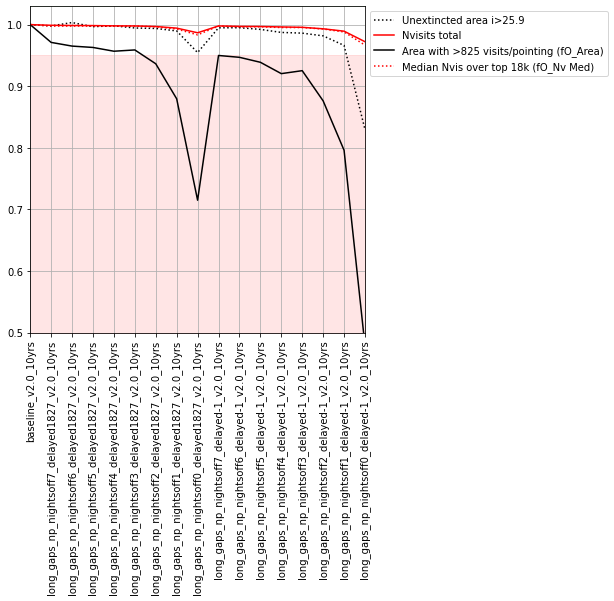

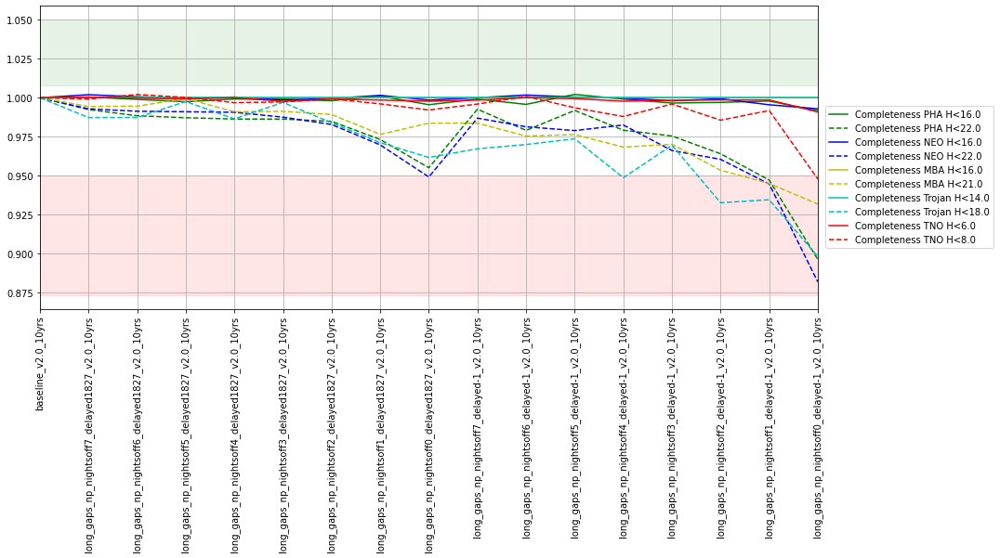

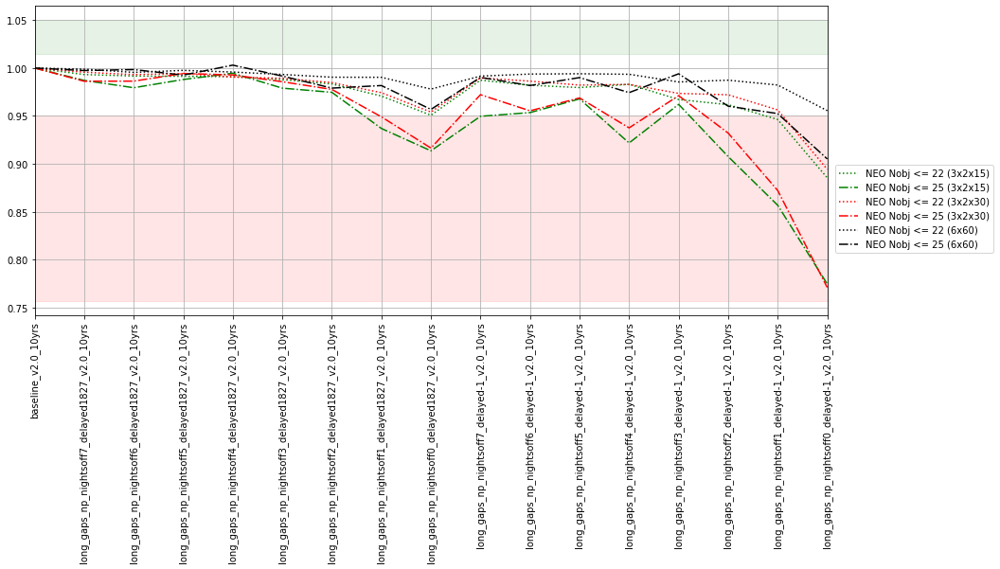

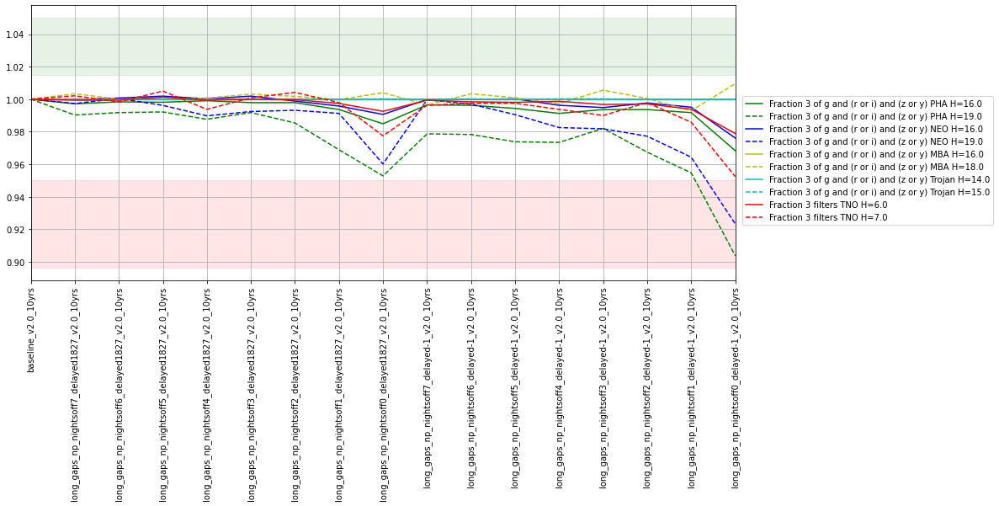

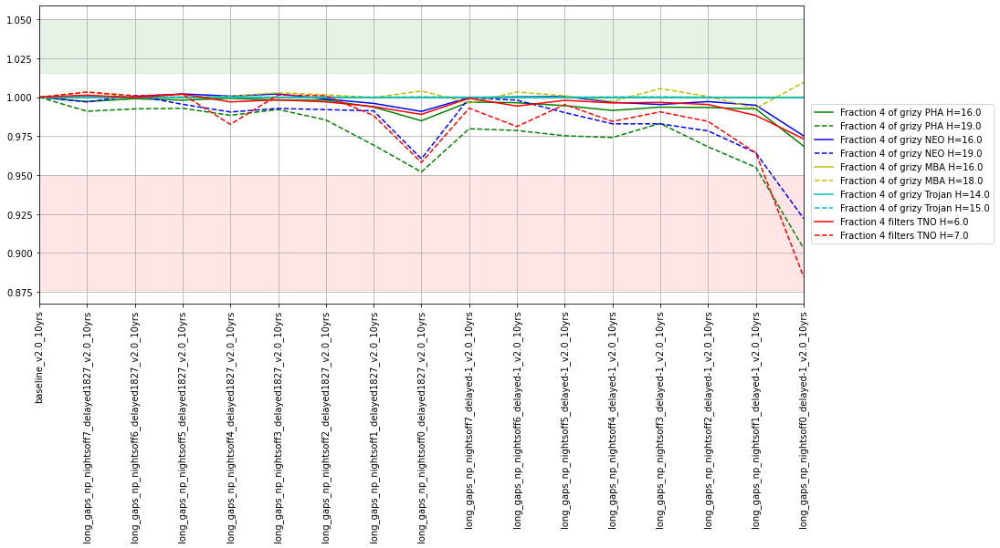

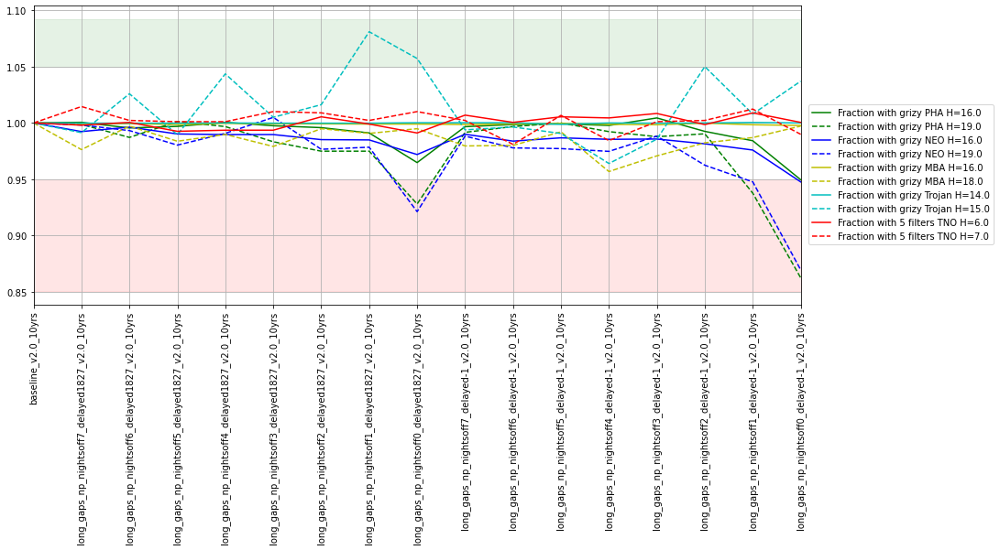

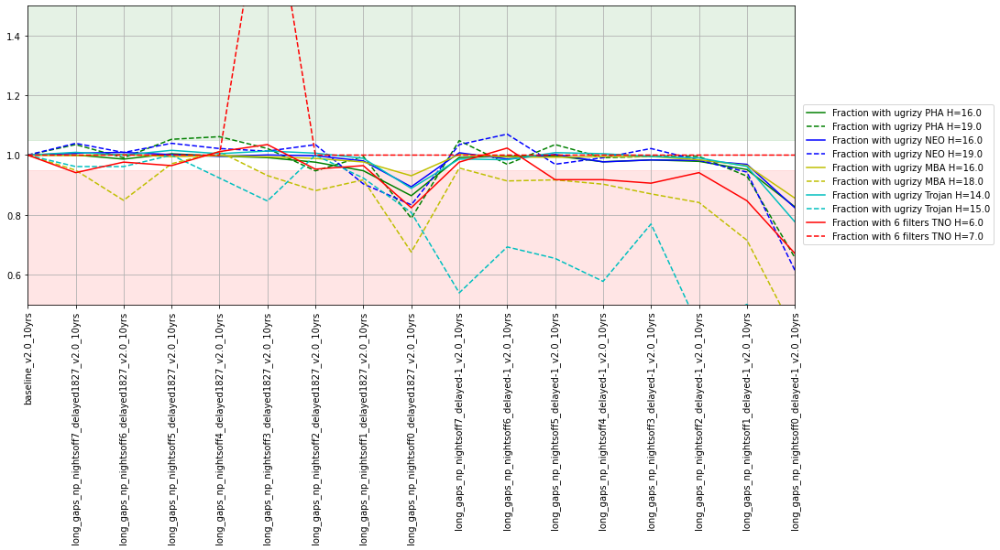

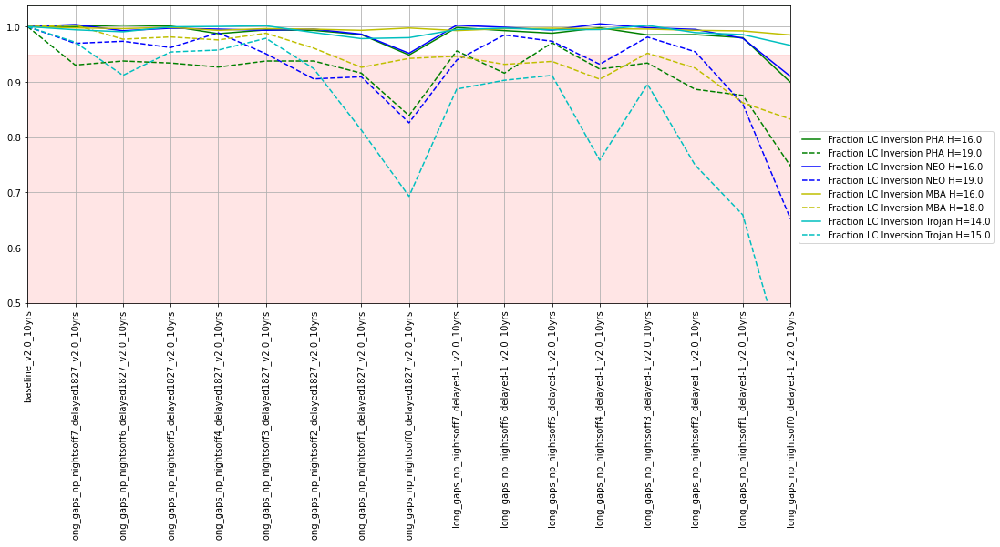

In [13]:
fam = ['long_gaps_nopair']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**bluer** : The standard filter balance in the dust-free WFD in the baseline is {'u': 0.07, 'g': 0.09, 'r': 0.22, 'i': 0.22, 'z': 0.20, 'y': 0.20}. These simulations vary the filter balance, skewing it bluer. One simulation adds visits to g band,while the other adds visits to both u and g band, in each case by taking some visits from rizy.

**long_u** : The baseline survey uses 2x15s visits for all bands except u band. In the baseline, u band visits are 1x30s to reduce the effects of readnoise (which are most extreme in u, due to the low sky-background). These simulations extend the u band visit time further, to 1x50s. In one simulation, the total amount of survey time spent on u band is kept the same, so the number of visits is reduced accordingly. In the other simulation, more survey time is spent in u band in order to maintain the number of visits in u.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
bluer_indx0_v2.0_10yrs,12849.585708,16155.563377,2088051.0,839.0,53.0,94.0,170.0,171.0,152.0,166.0,"More g - filter ratio in WFD of {'u': 0.07, 'g..."
bluer_indx1_v2.0_10yrs,12876.443105,16210.117464,2089107.0,839.0,61.0,86.0,170.0,171.0,152.0,167.0,More u and g - filter ratio in WFD of {'u': 0....
long_u1_v2.0_10yrs,17197.966084,16420.780169,2021286.0,866.0,52.0,67.0,171.0,174.0,155.0,161.0,"u band visits 1x50s, number of u visits same a..."
long_u2_v2.0_10yrs,15840.828260,16687.675548,2040731.0,854.0,33.0,70.0,177.0,181.0,160.0,167.0,"u band visits 1x50s, fewer number of u visits"


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
bluer_indx0_v2.0_10yrs,0.9380,0.590270,0.9288,0.571974,1.0,0.529990,1.0,0.420473,0.693743,0.465246
bluer_indx1_v2.0_10yrs,0.9410,0.586656,0.9280,0.566670,1.0,0.526093,1.0,0.412282,0.696328,0.468987
long_u1_v2.0_10yrs,0.9378,0.585145,0.9282,0.567217,1.0,0.529677,1.0,0.423776,0.695451,0.468040
long_u2_v2.0_10yrs,0.9394,0.593225,0.9314,0.581446,1.0,0.541587,1.0,0.434640,0.695742,0.472711


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
bluer_indx0_v2.0_10yrs,15575.900376,55903.214620,16762.139914,65140.937058,18865.744086,95134.740554
bluer_indx1_v2.0_10yrs,15435.916072,56724.696641,16670.104670,65741.832190,18780.309096,94316.911140
long_u1_v2.0_10yrs,15450.215213,55053.972146,16737.619544,64958.607071,18794.360682,92023.466321
long_u2_v2.0_10yrs,15827.549455,58292.285358,16932.764309,67218.080620,18905.826910,94587.754098


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0,0.901780,1.0,0.9996,0.6168,0.4794
bluer_indx0_v2.0_10yrs,0.8484,0.5454,0.8614,0.5484,1.0,0.901580,1.0,0.9998,0.6178,0.4804
bluer_indx1_v2.0_10yrs,0.8456,0.5398,0.8546,0.5398,1.0,0.899980,1.0,0.9994,0.6190,0.4776
long_u1_v2.0_10yrs,0.8392,0.5116,0.8506,0.5184,1.0,0.894779,1.0,0.9996,0.6154,0.4746
long_u2_v2.0_10yrs,0.8478,0.5342,0.8566,0.5356,1.0,0.900380,1.0,0.9998,0.6166,0.4798


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0,0.901780,1.0,0.9996,0.5978,0.4248
bluer_indx0_v2.0_10yrs,0.8476,0.5442,0.8598,0.5474,1.0,0.901580,1.0,0.9998,0.5990,0.4260
bluer_indx1_v2.0_10yrs,0.8452,0.5390,0.8538,0.5388,1.0,0.899980,1.0,0.9994,0.5990,0.4250
long_u1_v2.0_10yrs,0.8392,0.5110,0.8502,0.5182,1.0,0.894779,1.0,0.9996,0.5962,0.4184
long_u2_v2.0_10yrs,0.8478,0.5340,0.8564,0.5356,1.0,0.900380,1.0,0.9998,0.5992,0.4230


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
bluer_indx0_v2.0_10yrs,0.7522,0.3392,0.7790,0.3456,0.995199,0.428286,0.9998,0.5666,0.4030,0.1792
bluer_indx1_v2.0_10yrs,0.7424,0.3278,0.7678,0.3402,0.995599,0.419884,0.9994,0.5118,0.4042,0.1796
long_u1_v2.0_10yrs,0.7150,0.2978,0.7460,0.3084,0.994799,0.416683,0.9996,0.5144,0.4050,0.1756
long_u2_v2.0_10yrs,0.7262,0.3160,0.7588,0.3308,0.995599,0.421684,0.9992,0.5408,0.4060,0.1758


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
bluer_indx0_v2.0_10yrs,0.4532,0.0466,0.4674,0.0464,0.897780,0.053411,0.9252,0.0030,0.0166,0.0002
bluer_indx1_v2.0_10yrs,0.5002,0.0640,0.5254,0.0614,0.924185,0.060212,0.9686,0.0054,0.0172,0.0002
long_u1_v2.0_10yrs,0.4836,0.0594,0.4956,0.0614,0.942188,0.118824,0.9926,0.1092,0.0484,0.0014
long_u2_v2.0_10yrs,0.2834,0.0222,0.2868,0.0224,0.720544,0.039208,0.9116,0.0314,0.0308,0.0008


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
bluer_indx0_v2.0_10yrs,0.4524,0.0440,0.4634,0.0458,0.934787,0.135227,0.9226,0.0832
bluer_indx1_v2.0_10yrs,0.4534,0.0468,0.4652,0.0468,0.935987,0.127826,0.9168,0.0742
long_u1_v2.0_10yrs,0.4522,0.0460,0.4640,0.0462,0.935387,0.129626,0.9274,0.0894
long_u2_v2.0_10yrs,0.4654,0.0510,0.4872,0.0482,0.944389,0.147630,0.9434,0.1040


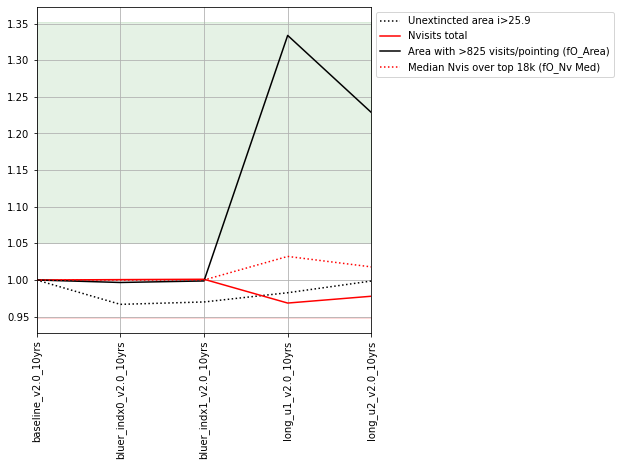

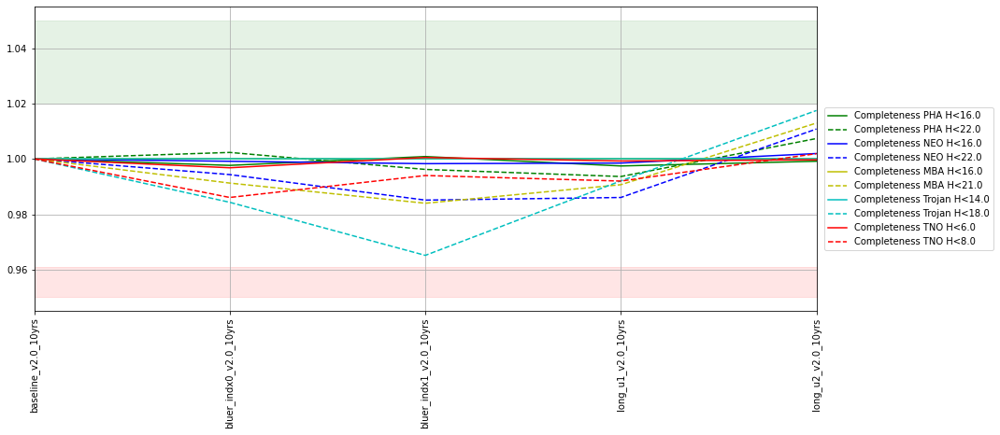

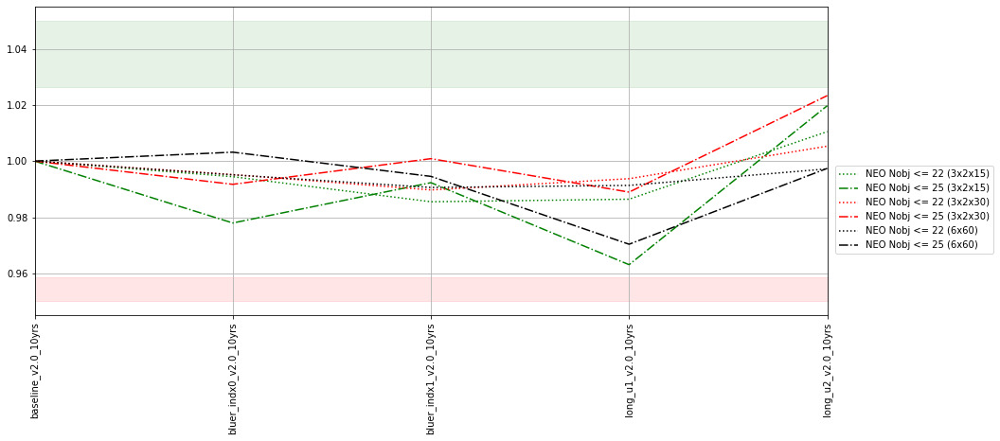

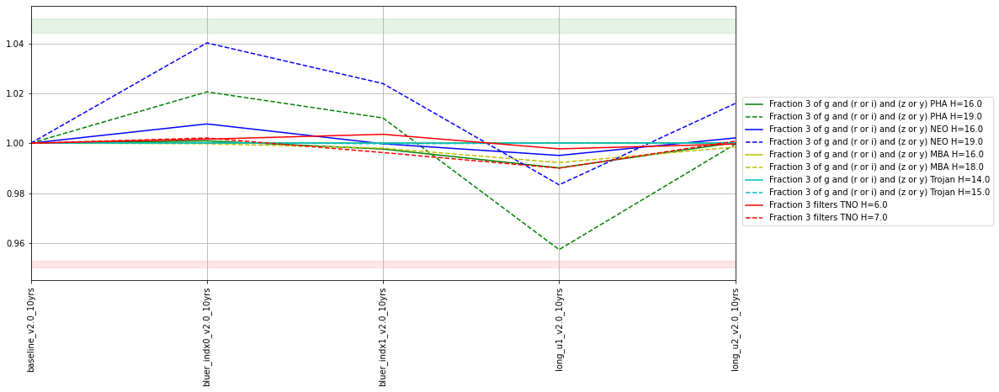

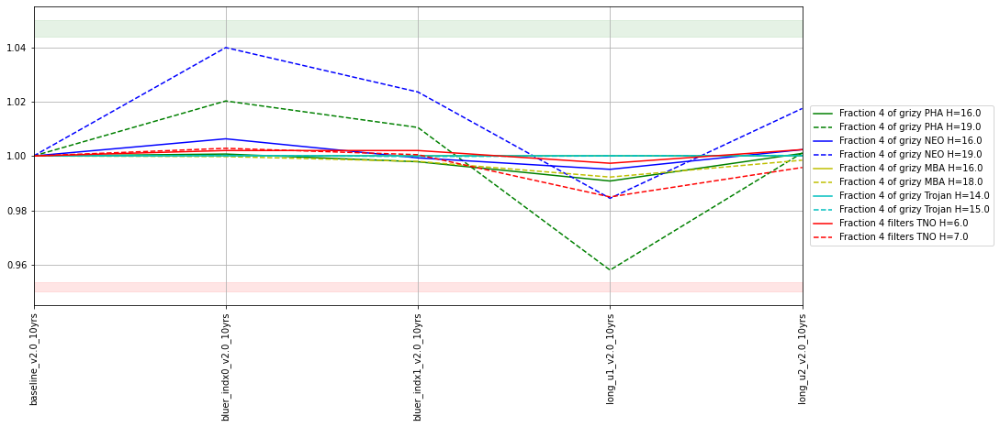

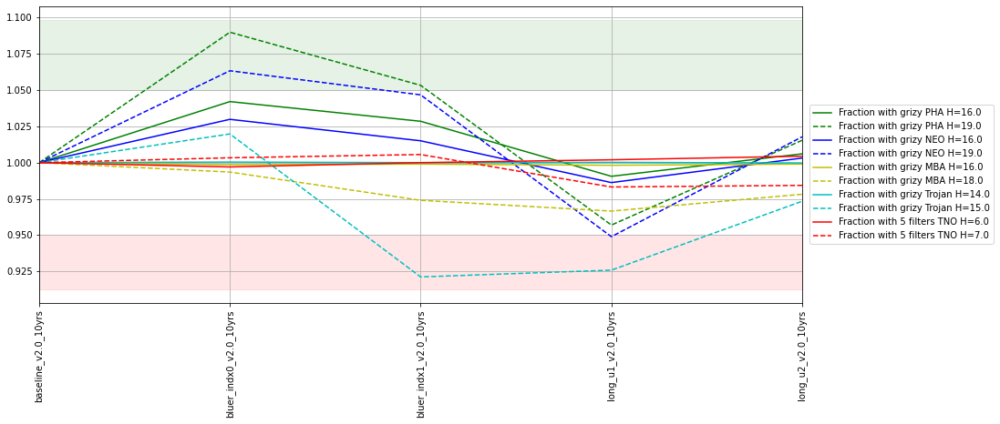

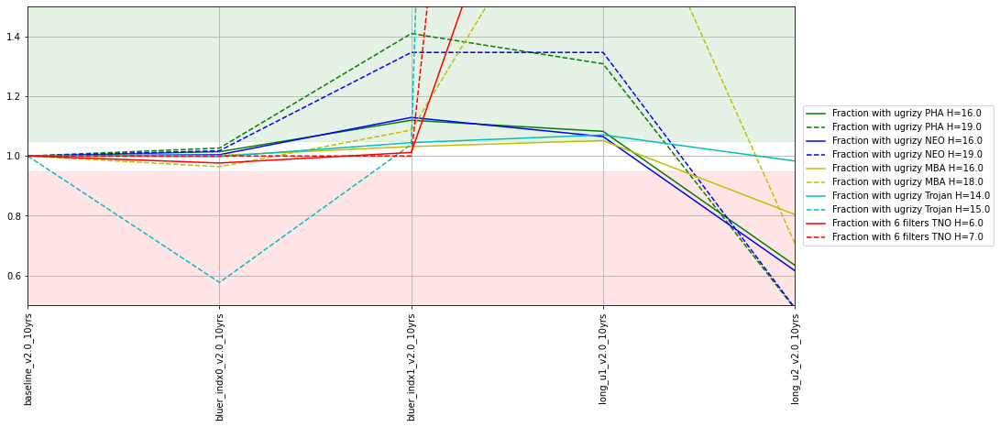

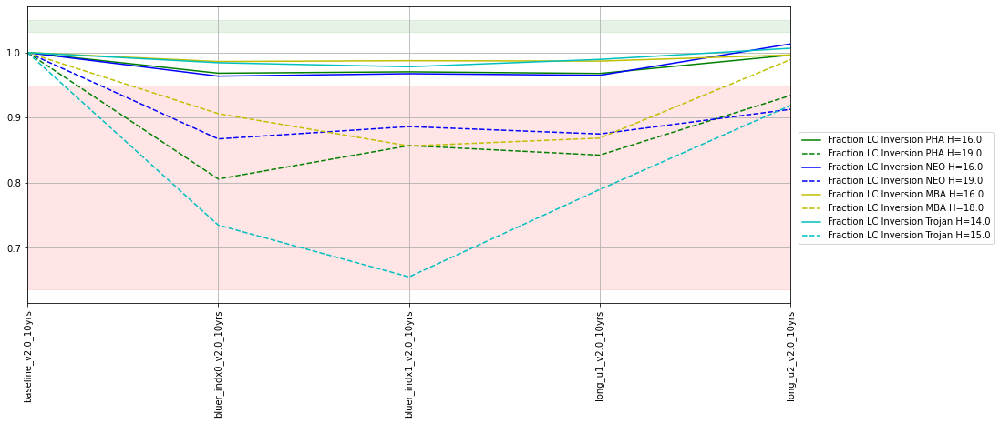

In [14]:
fam = ['bluer', 'long_u']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**vary_gp** : These simulations investigate the effect of varying the amount of survey time spent on covering the background (non-WFD-level) Galactic Plane area. The baseline characteristics, including the ratio of visits over the remainder of the footprint, are kept the same.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
vary_gp_gpfrac0.01_v2.0_10yrs,16736.354579,16818.605356,2088147.0,861.0,55.0,71.0,182.0,185.0,165.0,171.0,Dusty plane at 1% WFD level
vary_gp_gpfrac0.05_v2.0_10yrs,16665.014619,16706.140008,2088534.0,861.0,55.0,71.0,182.0,185.0,164.0,171.0,Dusty plane at 5% WFD level
vary_gp_gpfrac0.10_v2.0_10yrs,16511.423882,16810.212420,2088477.0,859.0,55.0,71.0,182.0,185.0,164.0,170.0,Dusty plane at 10% WFD level
vary_gp_gpfrac0.15_v2.0_10yrs,15621.772618,16739.711754,2088838.0,853.0,54.0,71.0,181.0,183.0,163.0,169.0,Dusty plane at 15% WFD level
vary_gp_gpfrac0.20_v2.0_10yrs,14733.799942,16736.354579,2088077.0,847.0,54.0,70.0,179.0,182.0,162.0,168.0,Dusty plane at 20% WFD level
vary_gp_gpfrac0.25_v2.0_10yrs,13427.019736,16636.478635,2088389.0,841.0,54.0,70.0,178.0,181.0,161.0,167.0,Dusty plane at 25% WFD level
vary_gp_gpfrac0.30_v2.0_10yrs,11804.665120,16665.014619,2087314.0,834.0,54.0,69.0,176.0,179.0,160.0,166.0,Dusty plane at 30% WFD level
vary_gp_gpfrac0.35_v2.0_10yrs,9751.752864,16700.264952,2086873.0,827.0,53.0,69.0,174.0,177.0,158.0,165.0,Dusty plane at 35% WFD level


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
vary_gp_gpfrac0.01_v2.0_10yrs,0.9430,0.587627,0.9316,0.574707,1.0,0.532590,1.0,0.420216,0.694629,0.470786
vary_gp_gpfrac0.05_v2.0_10yrs,0.9426,0.586857,0.9304,0.576471,1.0,0.530615,1.0,0.425146,0.695574,0.472052
vary_gp_gpfrac0.10_v2.0_10yrs,0.9448,0.588280,0.9288,0.574805,1.0,0.533930,1.0,0.426793,0.695184,0.469790
vary_gp_gpfrac0.15_v2.0_10yrs,0.9390,0.587037,0.9320,0.572491,1.0,0.530970,1.0,0.423047,0.696831,0.468749
vary_gp_gpfrac0.20_v2.0_10yrs,0.9422,0.592173,0.9300,0.573147,1.0,0.532039,1.0,0.426598,0.696912,0.472589
vary_gp_gpfrac0.25_v2.0_10yrs,0.9402,0.584509,0.9308,0.572149,1.0,0.527185,1.0,0.418841,0.695837,0.473340
vary_gp_gpfrac0.30_v2.0_10yrs,0.9404,0.588228,0.9322,0.576158,1.0,0.528298,1.0,0.416400,0.696246,0.470994
vary_gp_gpfrac0.35_v2.0_10yrs,0.9392,0.587838,0.9308,0.571671,1.0,0.527966,1.0,0.422899,0.695750,0.470669


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
vary_gp_gpfrac0.01_v2.0_10yrs,15649.422168,56349.382275,16765.305557,65315.252425,18792.396535,93467.714551
vary_gp_gpfrac0.05_v2.0_10yrs,15696.287286,56959.862435,16810.253077,65439.819835,18864.449936,93867.563241
vary_gp_gpfrac0.10_v2.0_10yrs,15651.248166,56666.788599,16768.939321,65389.704253,18828.757470,94750.185876
vary_gp_gpfrac0.15_v2.0_10yrs,15592.053009,55994.303546,16724.552754,65493.433682,18863.574128,93888.714009
vary_gp_gpfrac0.20_v2.0_10yrs,15608.271868,56047.967983,16803.781669,64987.905279,18929.031663,94381.022557
vary_gp_gpfrac0.25_v2.0_10yrs,15581.332823,57900.426835,16788.672233,66879.345178,18885.664586,94715.151340
vary_gp_gpfrac0.30_v2.0_10yrs,15688.616596,57685.956781,16829.540288,66791.693000,18907.710754,94782.395509
vary_gp_gpfrac0.35_v2.0_10yrs,15570.699645,56225.295362,16854.203735,65960.829739,18961.006663,96093.956766


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0000,0.901780,1.0,0.9996,0.6168,0.4794
vary_gp_gpfrac0.01_v2.0_10yrs,0.8460,0.5310,0.8566,0.5304,1.0000,0.901180,1.0,0.9996,0.6100,0.4732
vary_gp_gpfrac0.05_v2.0_10yrs,0.8446,0.5316,0.8558,0.5326,1.0000,0.902781,1.0,0.9996,0.6110,0.4736
vary_gp_gpfrac0.10_v2.0_10yrs,0.8456,0.5300,0.8544,0.5308,1.0000,0.902981,1.0,0.9996,0.6100,0.4742
vary_gp_gpfrac0.15_v2.0_10yrs,0.8472,0.5356,0.8550,0.5294,1.0000,0.902781,1.0,0.9996,0.6142,0.4734
vary_gp_gpfrac0.20_v2.0_10yrs,0.8460,0.5252,0.8568,0.5322,1.0000,0.905781,1.0,0.9998,0.6168,0.4816
vary_gp_gpfrac0.25_v2.0_10yrs,0.8474,0.5324,0.8566,0.5292,1.0000,0.902781,1.0,0.9998,0.6164,0.4788
vary_gp_gpfrac0.30_v2.0_10yrs,0.8438,0.5292,0.8550,0.5274,1.0000,0.906981,1.0,0.9998,0.6176,0.4828
vary_gp_gpfrac0.35_v2.0_10yrs,0.8440,0.5312,0.8572,0.5306,1.0000,0.903781,1.0,0.9998,0.6166,0.4794


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0000,0.901780,1.0,0.9996,0.5978,0.4248
vary_gp_gpfrac0.01_v2.0_10yrs,0.8452,0.5302,0.8564,0.5304,1.0000,0.901180,1.0,0.9996,0.5886,0.4204
vary_gp_gpfrac0.05_v2.0_10yrs,0.8444,0.5314,0.8558,0.5324,1.0000,0.902781,1.0,0.9996,0.5892,0.4182
vary_gp_gpfrac0.10_v2.0_10yrs,0.8456,0.5296,0.8538,0.5304,1.0000,0.902981,1.0,0.9996,0.5908,0.4178
vary_gp_gpfrac0.15_v2.0_10yrs,0.8472,0.5354,0.8544,0.5284,1.0000,0.902581,1.0,0.9996,0.5932,0.4178
vary_gp_gpfrac0.20_v2.0_10yrs,0.8454,0.5246,0.8566,0.5318,1.0000,0.905781,1.0,0.9998,0.5960,0.4212
vary_gp_gpfrac0.25_v2.0_10yrs,0.8474,0.5318,0.8566,0.5288,1.0000,0.902781,1.0,0.9998,0.5978,0.4248
vary_gp_gpfrac0.30_v2.0_10yrs,0.8438,0.5292,0.8550,0.5272,1.0000,0.906981,1.0,0.9998,0.6002,0.4276
vary_gp_gpfrac0.35_v2.0_10yrs,0.8432,0.5302,0.8566,0.5296,1.0000,0.903781,1.0,0.9998,0.5978,0.4290


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
vary_gp_gpfrac0.01_v2.0_10yrs,0.7204,0.3122,0.7508,0.3302,0.994999,0.432286,0.9994,0.5852,0.3988,0.1760
vary_gp_gpfrac0.05_v2.0_10yrs,0.7248,0.3174,0.7516,0.3326,0.994999,0.433287,0.9994,0.5836,0.3992,0.1750
vary_gp_gpfrac0.10_v2.0_10yrs,0.7234,0.3166,0.7560,0.3274,0.995599,0.420884,0.9998,0.5554,0.3998,0.1770
vary_gp_gpfrac0.15_v2.0_10yrs,0.7234,0.3166,0.7490,0.3258,0.995599,0.423085,0.9996,0.5058,0.3998,0.1762
vary_gp_gpfrac0.20_v2.0_10yrs,0.7258,0.3178,0.7480,0.3270,0.994599,0.423885,0.9994,0.5018,0.4054,0.1762
vary_gp_gpfrac0.25_v2.0_10yrs,0.7226,0.3116,0.7540,0.3244,0.996399,0.427686,0.9996,0.5628,0.4078,0.1782
vary_gp_gpfrac0.30_v2.0_10yrs,0.7238,0.3110,0.7496,0.3210,0.995199,0.418484,0.9990,0.5232,0.4056,0.1784
vary_gp_gpfrac0.35_v2.0_10yrs,0.7264,0.3152,0.7582,0.3250,0.995199,0.415083,0.9992,0.5384,0.4060,0.1768


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
vary_gp_gpfrac0.01_v2.0_10yrs,0.4532,0.0504,0.4732,0.0466,0.902781,0.056411,0.9522,0.0046,0.0170,0.0002
vary_gp_gpfrac0.05_v2.0_10yrs,0.4570,0.0464,0.4670,0.0478,0.902180,0.055411,0.9372,0.0046,0.0160,0.0002
vary_gp_gpfrac0.10_v2.0_10yrs,0.4568,0.0472,0.4732,0.0504,0.899780,0.053411,0.9312,0.0032,0.0188,0.0002
vary_gp_gpfrac0.15_v2.0_10yrs,0.4480,0.0488,0.4700,0.0448,0.895579,0.054811,0.9362,0.0044,0.0166,0.0002
vary_gp_gpfrac0.20_v2.0_10yrs,0.4480,0.0474,0.4716,0.0468,0.890378,0.050810,0.9478,0.0034,0.0168,0.0002
vary_gp_gpfrac0.25_v2.0_10yrs,0.4430,0.0490,0.4616,0.0496,0.906981,0.047009,0.9522,0.0040,0.0180,0.0002
vary_gp_gpfrac0.30_v2.0_10yrs,0.4464,0.0478,0.4620,0.0470,0.896579,0.054211,0.9418,0.0048,0.0158,0.0002
vary_gp_gpfrac0.35_v2.0_10yrs,0.4456,0.0484,0.4654,0.0492,0.895779,0.052410,0.9418,0.0038,0.0168,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
vary_gp_gpfrac0.01_v2.0_10yrs,0.4638,0.0550,0.4878,0.0536,0.948390,0.151430,0.9356,0.1110
vary_gp_gpfrac0.05_v2.0_10yrs,0.4670,0.0572,0.4830,0.0548,0.945989,0.150630,0.9408,0.1148
vary_gp_gpfrac0.10_v2.0_10yrs,0.4708,0.0546,0.4852,0.0536,0.947389,0.158032,0.9350,0.1178
vary_gp_gpfrac0.15_v2.0_10yrs,0.4714,0.0558,0.4874,0.0538,0.943789,0.150630,0.9404,0.1100
vary_gp_gpfrac0.20_v2.0_10yrs,0.4726,0.0560,0.4936,0.0520,0.943989,0.149430,0.9404,0.1126
vary_gp_gpfrac0.25_v2.0_10yrs,0.4678,0.0524,0.4870,0.0518,0.942789,0.145429,0.9390,0.1160
vary_gp_gpfrac0.30_v2.0_10yrs,0.4738,0.0518,0.4838,0.0514,0.944589,0.141828,0.9390,0.1090
vary_gp_gpfrac0.35_v2.0_10yrs,0.4620,0.0504,0.4806,0.0508,0.944789,0.140828,0.9314,0.0920


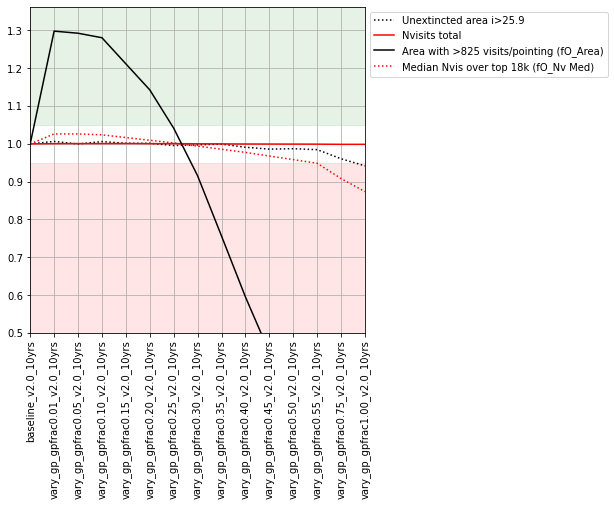

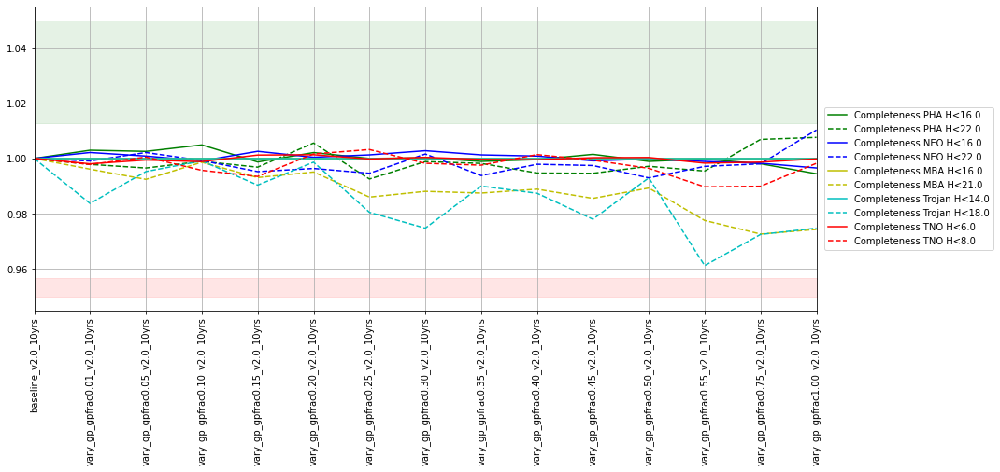

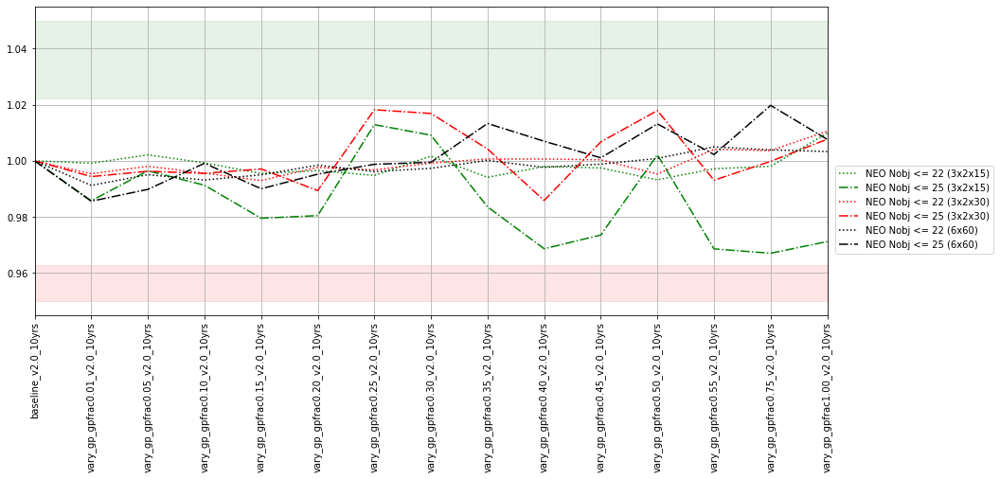

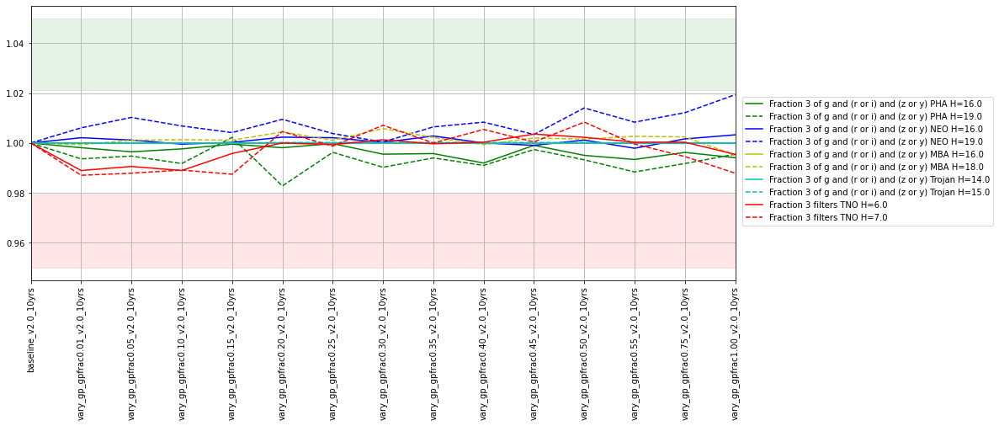

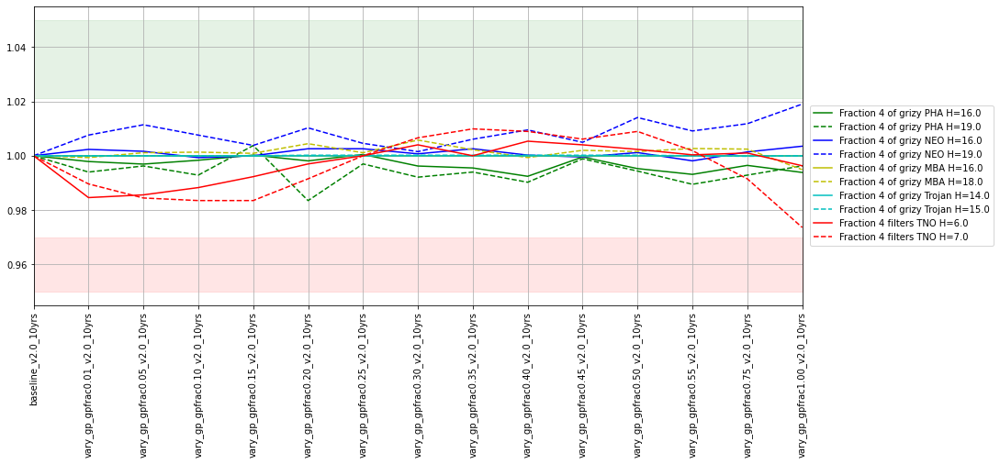

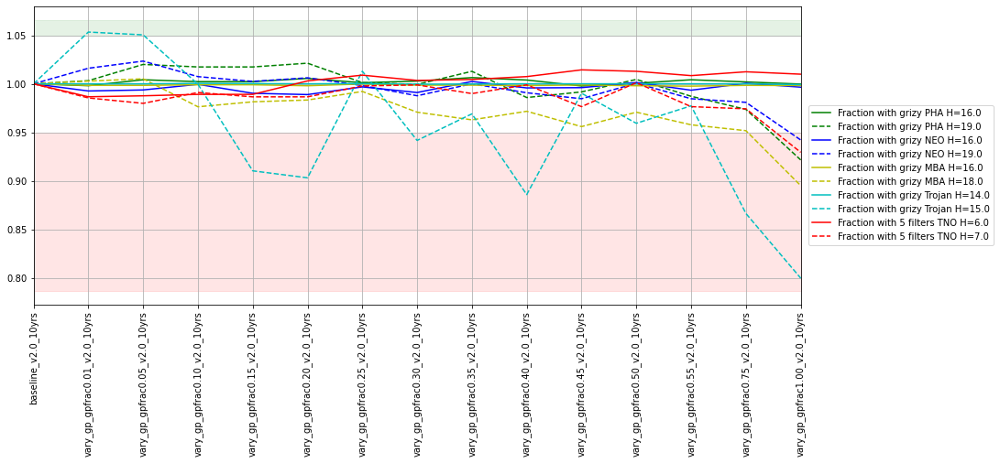

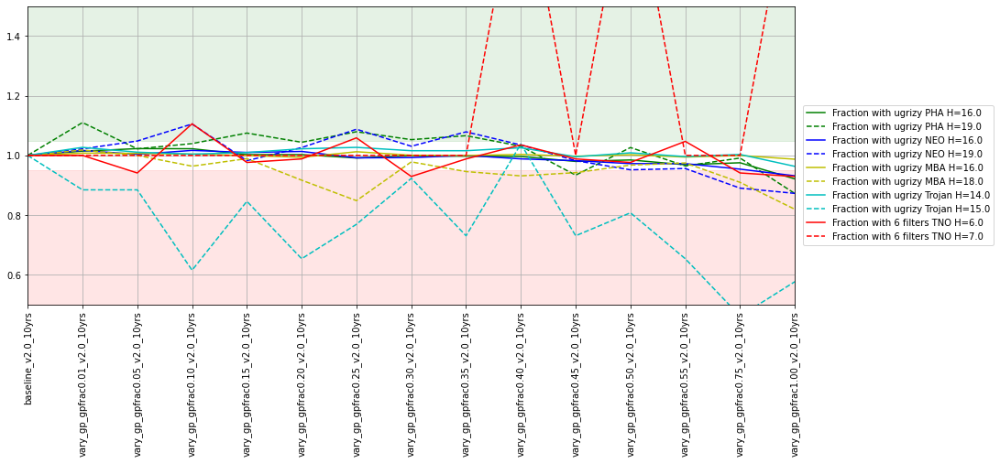

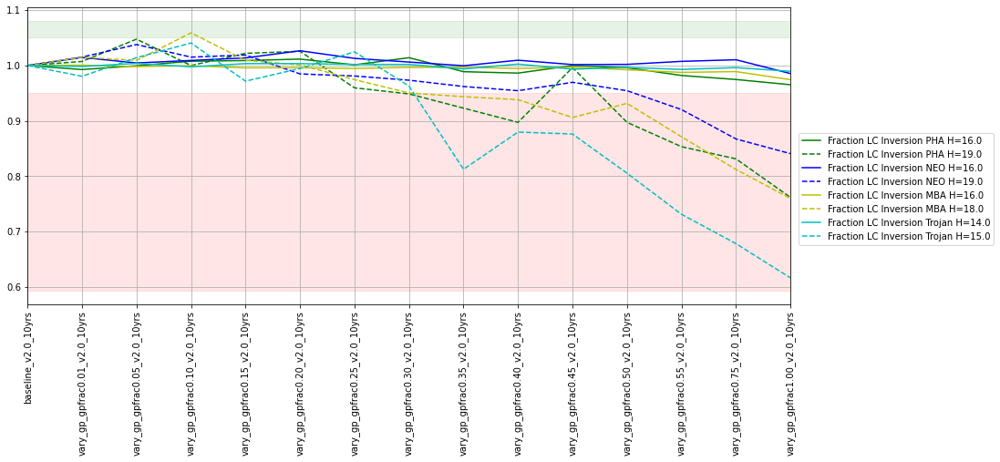

In [15]:
fam = ['vary_gp']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**vary_expt** : The baseline survey strategy uses 2x15s visits for grizy filters, and 1x30s visits for u band. This simulation attempts to make the individual image depth more consistent by varying the exposure time depending on conditions. Each visit could have an on-sky exposure time of between 20s to 100s.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
vary_expt_v2.0_10yrs,18090.974523,16948.695871,1858421.0,934.0,49.0,62.0,157.0,160.0,140.0,147.0,Vary the exposure times between 20 and 100s


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
vary_expt_v2.0_10yrs,0.9252,0.557078,0.9204,0.545786,1.0,0.515258,1.0,0.406154,0.691372,0.464536


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
vary_expt_v2.0_10yrs,14882.400453,51991.608570,16156.728984,60364.779811,18610.236671,90137.426208


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0,0.901780,1.0,0.9996,0.6168,0.4794
vary_expt_v2.0_10yrs,0.8338,0.5020,0.8412,0.5036,1.0,0.890978,1.0,0.9998,0.6166,0.5038


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0,0.901780,1.0,0.9996,0.5978,0.4248
vary_expt_v2.0_10yrs,0.8334,0.5010,0.8410,0.5030,1.0,0.890978,1.0,0.9998,0.5974,0.4520


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
vary_expt_v2.0_10yrs,0.7052,0.2852,0.7294,0.2972,0.994799,0.406481,0.9998,0.5030,0.4074,0.1670


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
vary_expt_v2.0_10yrs,0.4002,0.0396,0.4290,0.0396,0.878976,0.050410,0.9298,0.0032,0.0156,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
vary_expt_v2.0_10yrs,0.4286,0.0388,0.4378,0.0390,0.920784,0.124025,0.9194,0.0708


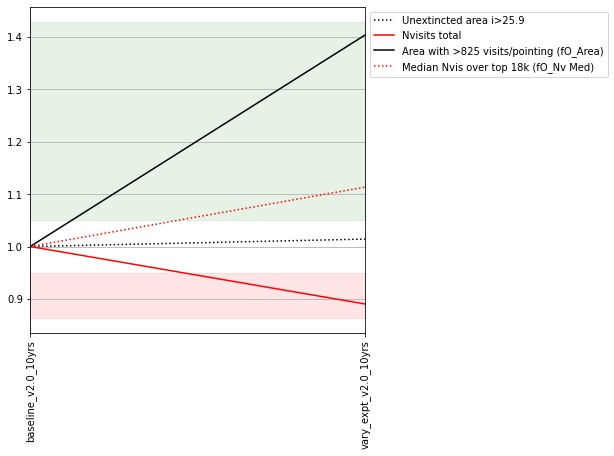

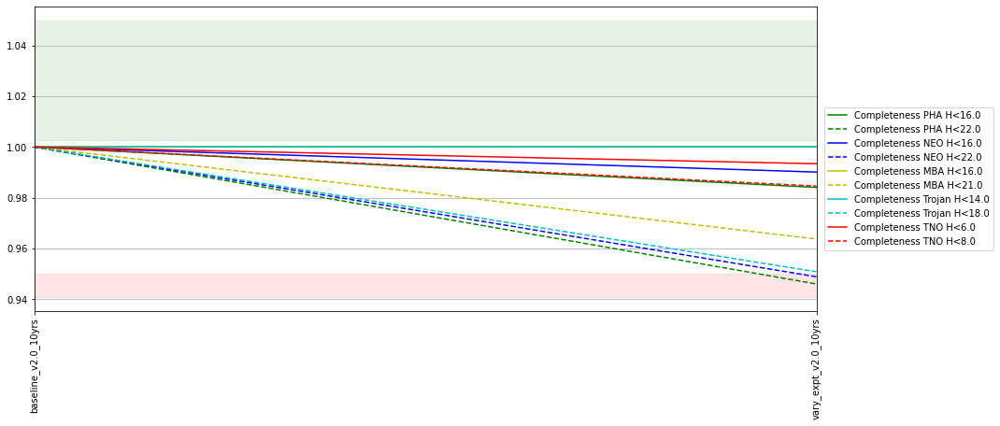

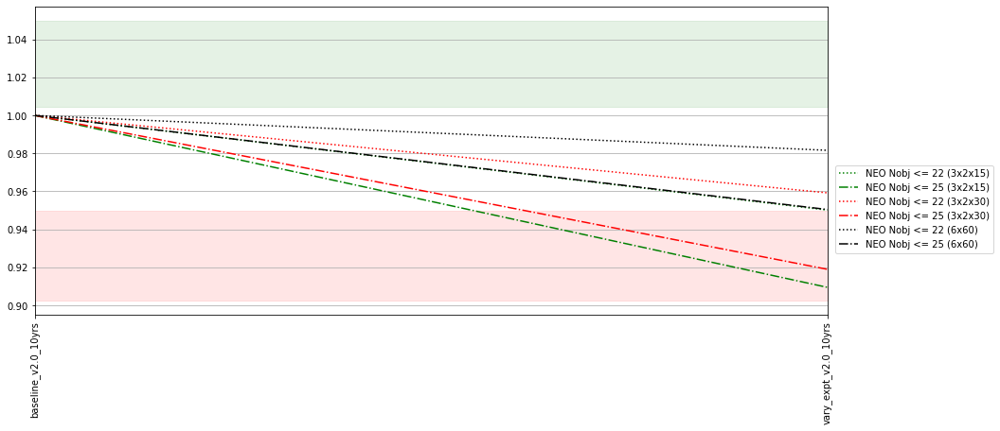

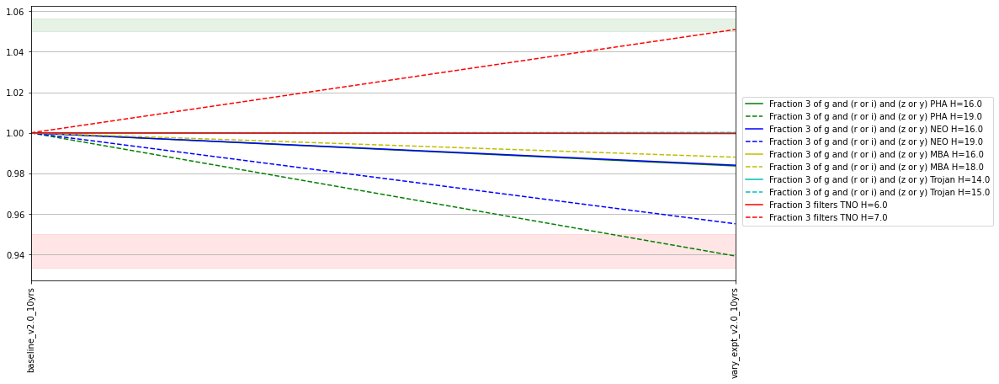

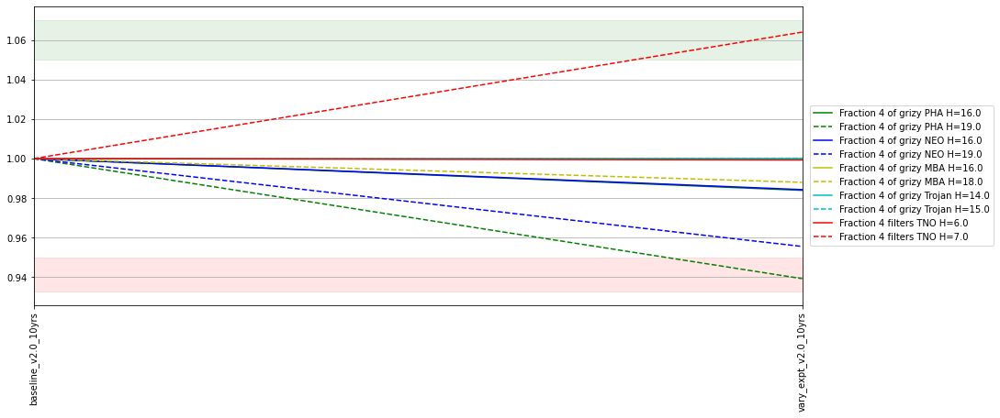

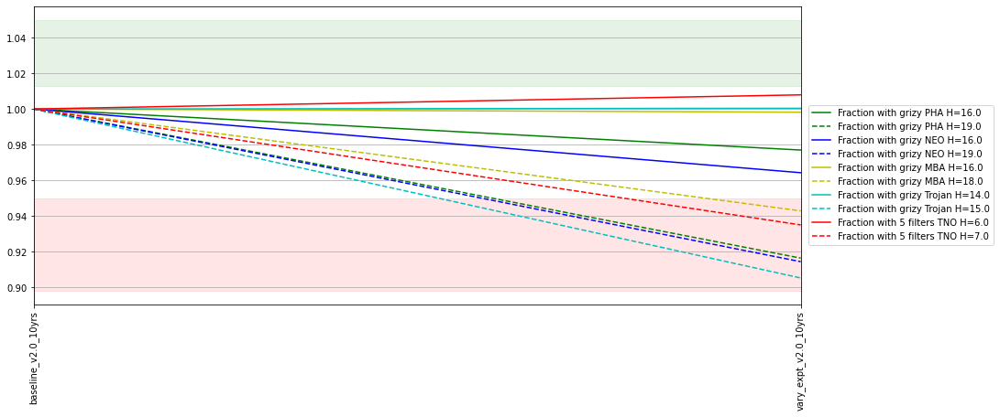

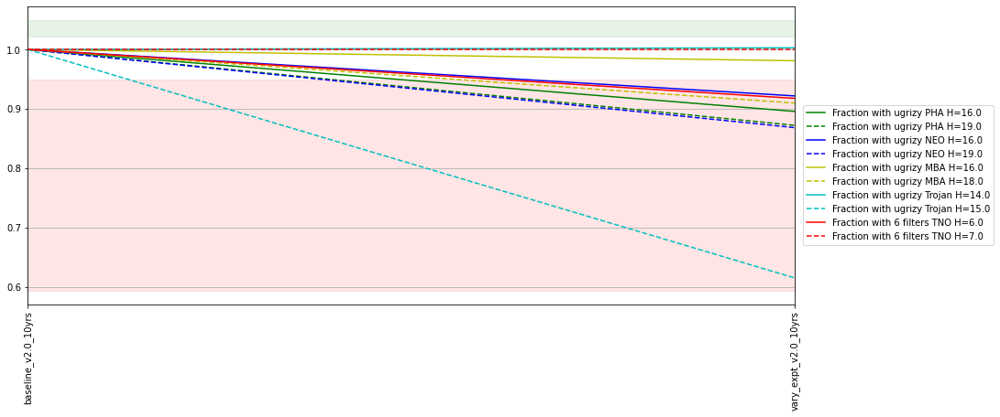

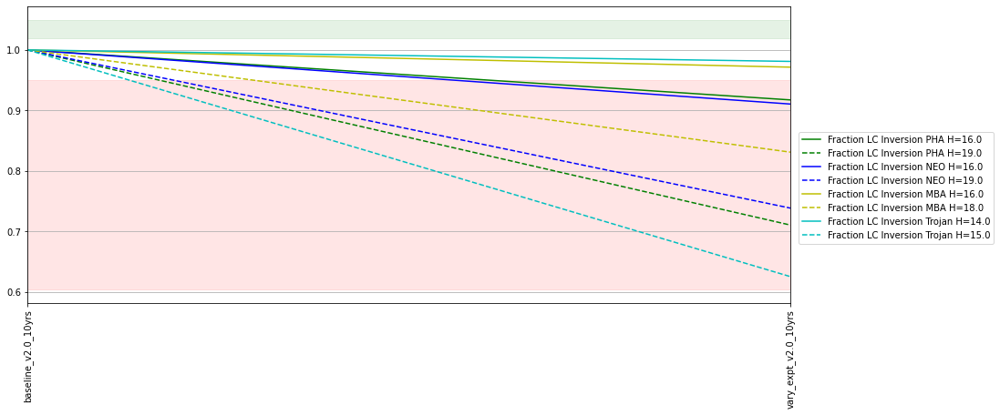

In [16]:
fam = ['vary_expt']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**ddf** : The baseline survey strategy adds five Deep Drilling Fields, each allocated about 1% of the total survey observing time, for about 5% total. In these simulations, the amount of time allocated for DDFs is varied from 3 to 8%. It is worth noting that we anticipate implementing improvements on the DDF scheduling algorithm in the next six months, and will revisit more complicated DDF scheduling requests with that improvement in hand.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
ddf_frac_ddf_per0.6_v2.0_10yrs,15656.183658,16786.712198,2087949.0,853.0,55.0,71.0,180.0,183.0,163.0,169.0,DDF fraction of visits reduced to 3% of total
ddf_frac_ddf_per1.6_v2.0_10yrs,5702.161026,16396.440653,2086426.0,811.0,52.0,67.0,171.0,174.0,155.0,161.0,DDF fraction of visits increased to 8%


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
ddf_frac_ddf_per0.6_v2.0_10yrs,0.9410,0.590562,0.9302,0.574713,1.0,0.532095,1.0,0.417734,0.695258,0.471480
ddf_frac_ddf_per1.6_v2.0_10yrs,0.9378,0.581979,0.9280,0.567519,1.0,0.520435,1.0,0.413901,0.693306,0.463004


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
ddf_frac_ddf_per0.6_v2.0_10yrs,15649.388502,57598.140934,16846.908523,66342.732691,18919.700226,95172.841398
ddf_frac_ddf_per1.6_v2.0_10yrs,15457.892253,55006.783557,16637.462305,64716.294942,18777.397564,92505.416431


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0,0.901780,1.0,0.9996,0.6168,0.4794
ddf_frac_ddf_per0.6_v2.0_10yrs,0.8458,0.5300,0.8540,0.5380,1.0,0.904981,1.0,0.9998,0.6184,0.4780
ddf_frac_ddf_per1.6_v2.0_10yrs,0.8396,0.5162,0.8496,0.5196,1.0,0.897379,1.0,0.9996,0.6146,0.4742


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0,0.901780,1.0,0.9996,0.5978,0.4248
ddf_frac_ddf_per0.6_v2.0_10yrs,0.8454,0.5296,0.8538,0.5376,1.0,0.904981,1.0,0.9998,0.5968,0.4242
ddf_frac_ddf_per1.6_v2.0_10yrs,0.8394,0.5158,0.8494,0.5190,1.0,0.897379,1.0,0.9996,0.5944,0.4140


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
ddf_frac_ddf_per0.6_v2.0_10yrs,0.7298,0.3174,0.7594,0.3284,0.995399,0.428686,0.9998,0.5578,0.4070,0.1820
ddf_frac_ddf_per1.6_v2.0_10yrs,0.7170,0.3014,0.7462,0.3136,0.995399,0.408482,0.9992,0.4726,0.4042,0.1708


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
ddf_frac_ddf_per0.6_v2.0_10yrs,0.4484,0.0472,0.4750,0.0470,0.905381,0.052811,0.9474,0.0014,0.0174,0.0004
ddf_frac_ddf_per1.6_v2.0_10yrs,0.4396,0.0474,0.4624,0.0476,0.891178,0.051010,0.9186,0.0080,0.0164,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
ddf_frac_ddf_per0.6_v2.0_10yrs,0.4662,0.0540,0.4852,0.0518,0.950390,0.147630,0.9374,0.1032
ddf_frac_ddf_per1.6_v2.0_10yrs,0.4552,0.0536,0.4746,0.0526,0.935587,0.139628,0.9222,0.1012


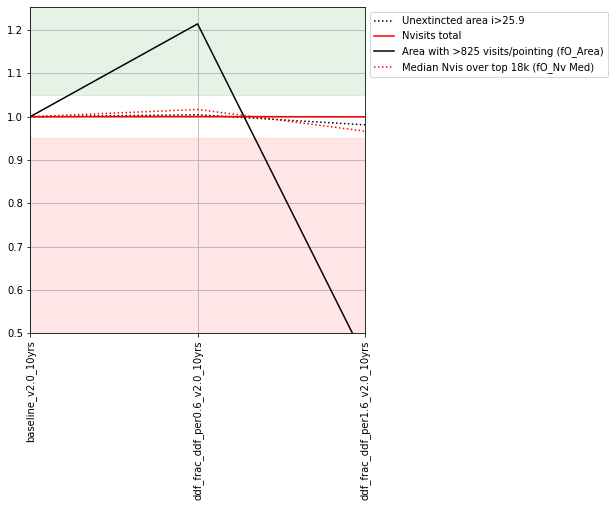

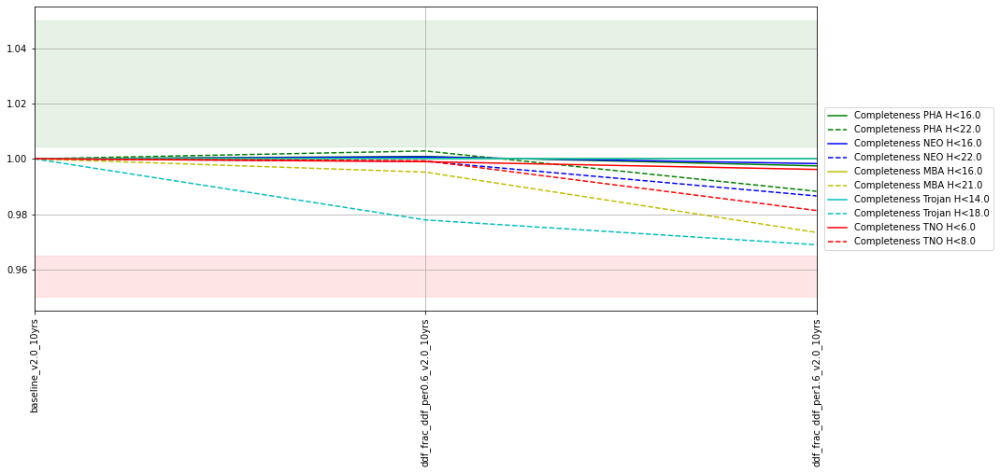

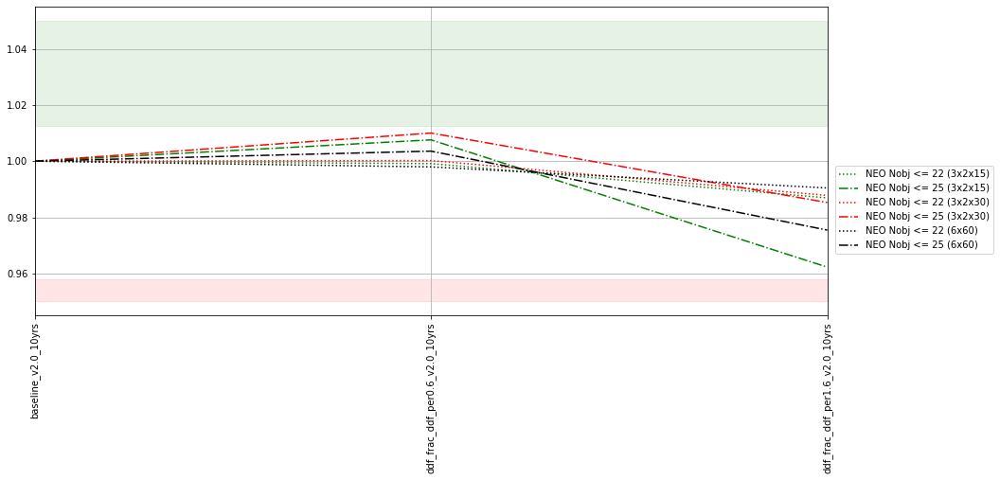

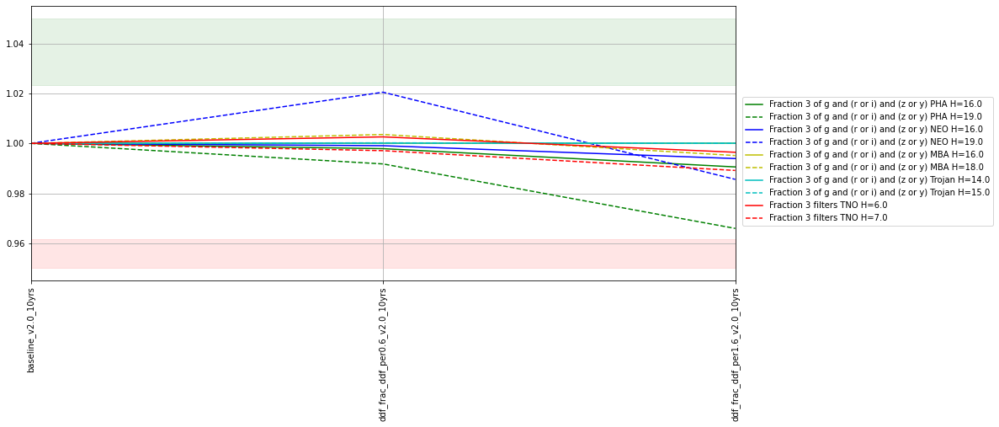

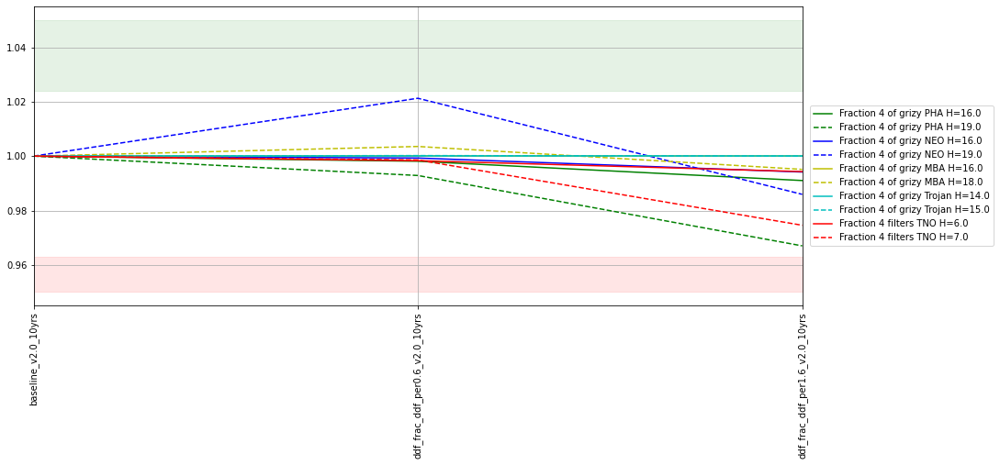

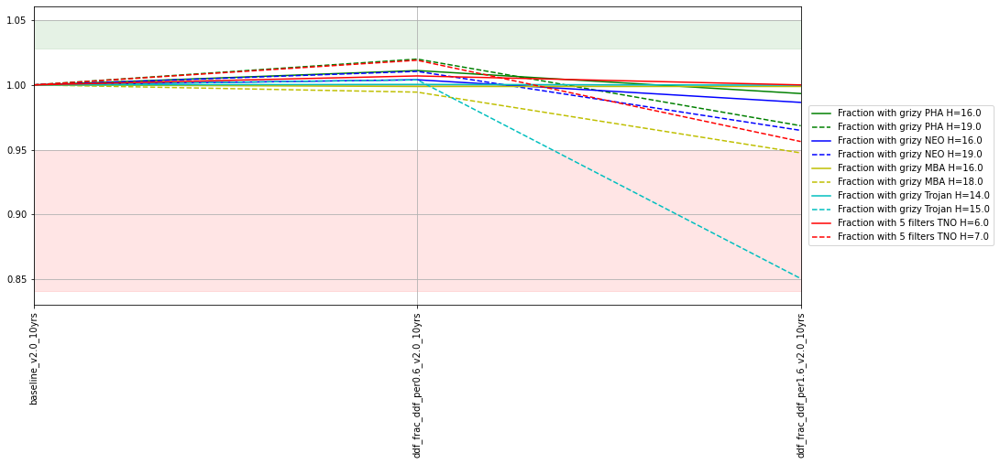

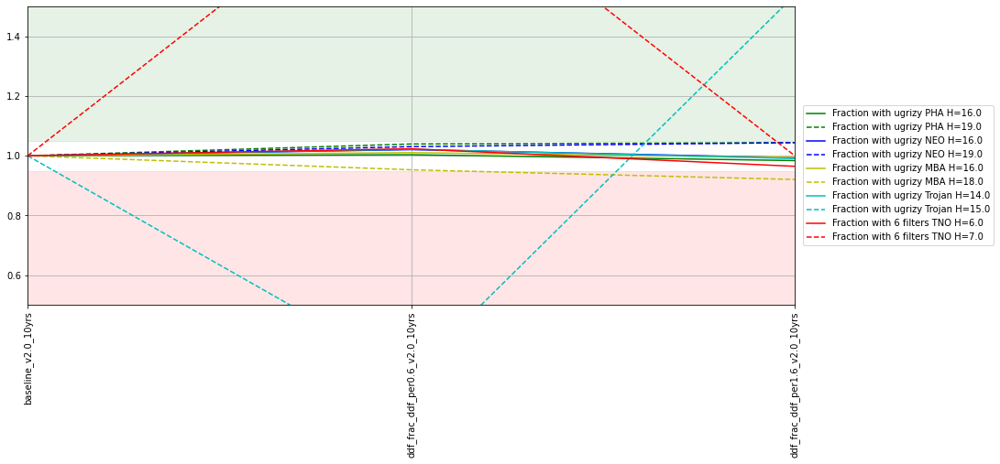

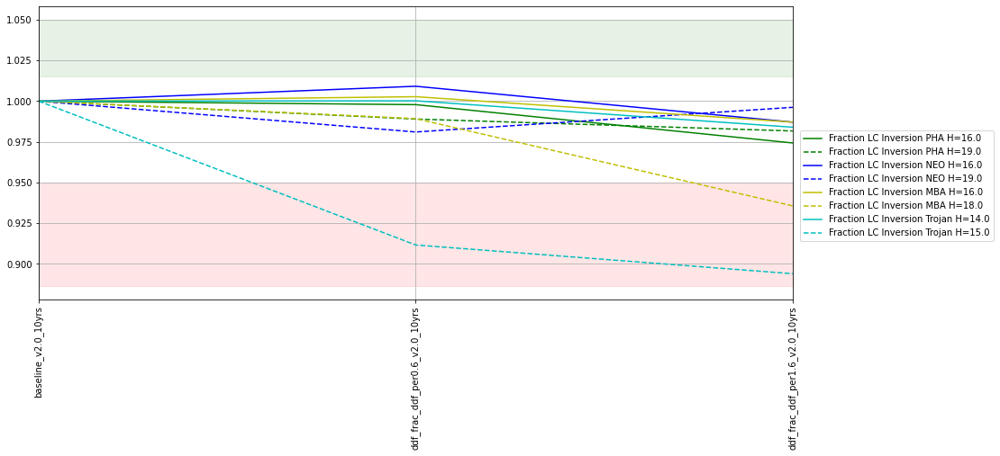

In [17]:
fam = ['ddf']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

**microsurveys** : There are special programs which can achieve additional science beyond or supporting the primary Rubin LSST science drivers, if provided specialized observing time via "microsurveys". These simulations investigate a subset of microsurvey proposals, described further in their brief descriptions.

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
virgo_cluster_v2.0_10yrs,12161.364919,16685.996960,2087802.0,836.0,54.0,70.0,177.0,179.0,160.0,165.0,Add the virgo cluster to WFD footprint
carina_v2.0_10yrs,12519.743306,16385.529835,2087222.0,838.0,54.0,70.0,178.0,178.0,160.0,166.0,One week per year observing Carina
smc_movie_v2.0_10yrs,12732.084598,16743.068928,2089048.0,838.0,54.0,69.0,177.0,180.0,160.0,167.0,Two nights of observing the SMC in movie mode
roman_v2.0_10yrs,12283.062498,16671.728968,2083719.0,837.0,54.0,69.0,177.0,180.0,160.0,166.0,Microsurvey of the Roman bulge field
local_gal_bindx0_v2.0_10yrs,12330.902235,16550.870684,2087499.0,837.0,53.0,70.0,177.0,179.0,159.0,165.0,"Increase local galaxy coverage {'g': 0.5, 'r':..."
local_gal_bindx1_v2.0_10yrs,11938.112809,16554.227858,2087949.0,836.0,52.0,72.0,177.0,178.0,159.0,164.0,"Increasing local galaxy coverage {'g': 1.0, 'r..."
local_gal_bindx2_v2.0_10yrs,11226.391798,16456.869795,2087603.0,833.0,51.0,72.0,176.0,176.0,157.0,163.0,"Increasing local galaxy coverage {'g': 1.5, 'r..."
too_rate10_v2.0_10yrs,12710.262963,16508.906001,2086250.0,838.0,54.0,70.0,177.0,180.0,160.0,166.0,"Follow up ToO alerts, 10 events per year"


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.000000,0.534662,1.0,0.427171,0.695976,0.471819
virgo_cluster_v2.0_10yrs,0.9392,0.584907,0.9288,0.574944,1.000000,0.530222,1.0,0.416138,0.696096,0.470070
carina_v2.0_10yrs,0.9258,0.564285,0.9220,0.550987,1.000000,0.528700,1.0,0.419875,0.693073,0.464829
smc_movie_v2.0_10yrs,0.9402,0.585020,0.9298,0.570064,1.000000,0.535419,1.0,0.419596,0.696093,0.472337
roman_v2.0_10yrs,0.9410,0.587792,0.9302,0.573653,1.000000,0.530834,1.0,0.422513,0.696890,0.472234
local_gal_bindx0_v2.0_10yrs,0.9410,0.584871,0.9274,0.572572,1.000000,0.534587,1.0,0.425268,0.694132,0.470641
local_gal_bindx1_v2.0_10yrs,0.9386,0.588004,0.9300,0.573629,1.000000,0.531625,1.0,0.420715,0.695772,0.470518
local_gal_bindx2_v2.0_10yrs,0.9420,0.588849,0.9314,0.575920,1.000000,0.523389,1.0,0.404866,0.695235,0.468332
too_rate10_v2.0_10yrs,0.9398,0.589307,0.9292,0.572706,1.000000,0.528952,1.0,0.415368,0.696262,0.470529


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
virgo_cluster_v2.0_10yrs,15654.006094,58145.057094,16810.560617,66475.879736,18908.458891,95625.297445
carina_v2.0_10yrs,15017.953803,54460.857138,16287.782401,63187.532101,18836.025992,95542.004474
smc_movie_v2.0_10yrs,15527.045114,57234.545432,16689.603217,65572.790817,18885.602601,95234.587816
roman_v2.0_10yrs,15622.182968,58264.063498,16772.949498,66778.527839,18884.914801,95327.646228
local_gal_bindx0_v2.0_10yrs,15592.408904,56485.960496,16804.458140,65217.272368,18937.455123,94402.405855
local_gal_bindx1_v2.0_10yrs,15620.714436,57327.264236,16765.914680,65678.167125,18879.111667,93337.684672
local_gal_bindx2_v2.0_10yrs,15682.714059,55635.195411,16849.485195,64321.492889,18860.584864,92911.327873
too_rate10_v2.0_10yrs,15595.037563,57960.079619,16779.959975,66459.914390,18897.835204,95928.567779


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.000000,0.901780,1.0,0.9996,0.6168,0.4794
virgo_cluster_v2.0_10yrs,0.8472,0.5292,0.8538,0.5292,1.000000,0.900580,1.0,0.9996,0.6184,0.4782
carina_v2.0_10yrs,0.8418,0.5262,0.8522,0.5342,1.000000,0.901180,1.0,0.9998,0.6174,0.4792
smc_movie_v2.0_10yrs,0.8446,0.5288,0.8548,0.5312,1.000000,0.901980,1.0,0.9998,0.6180,0.4810
roman_v2.0_10yrs,0.8464,0.5288,0.8538,0.5290,1.000000,0.903781,1.0,0.9998,0.6162,0.4776
local_gal_bindx0_v2.0_10yrs,0.8454,0.5334,0.8570,0.5312,1.000000,0.900580,1.0,0.9998,0.6172,0.4794
local_gal_bindx1_v2.0_10yrs,0.8468,0.5324,0.8548,0.5340,1.000000,0.897980,1.0,0.9996,0.6158,0.4794
local_gal_bindx2_v2.0_10yrs,0.8466,0.5320,0.8578,0.5328,1.000000,0.894179,1.0,0.9994,0.6150,0.4742
too_rate10_v2.0_10yrs,0.8466,0.5294,0.8538,0.5246,1.000000,0.899580,1.0,0.9996,0.6174,0.4806


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.000000,0.901780,1.0,0.9996,0.5978,0.4248
virgo_cluster_v2.0_10yrs,0.8468,0.5286,0.8538,0.5292,1.000000,0.900580,1.0,0.9996,0.5986,0.4232
carina_v2.0_10yrs,0.8406,0.5250,0.8520,0.5340,1.000000,0.900980,1.0,0.9998,0.6002,0.4246
smc_movie_v2.0_10yrs,0.8442,0.5284,0.8546,0.5310,1.000000,0.901980,1.0,0.9998,0.5976,0.4208
roman_v2.0_10yrs,0.8462,0.5288,0.8536,0.5284,1.000000,0.903781,1.0,0.9998,0.5968,0.4254
local_gal_bindx0_v2.0_10yrs,0.8452,0.5328,0.8568,0.5310,1.000000,0.900580,1.0,0.9998,0.5980,0.4236
local_gal_bindx1_v2.0_10yrs,0.8460,0.5316,0.8544,0.5332,1.000000,0.897980,1.0,0.9996,0.5956,0.4210
local_gal_bindx2_v2.0_10yrs,0.8456,0.5312,0.8572,0.5318,1.000000,0.894179,1.0,0.9994,0.5946,0.4108
too_rate10_v2.0_10yrs,0.8462,0.5290,0.8536,0.5242,1.000000,0.899580,1.0,0.9996,0.5970,0.4184


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
virgo_cluster_v2.0_10yrs,0.7230,0.3062,0.7528,0.3246,0.995999,0.428686,0.9992,0.5586,0.4060,0.1776
carina_v2.0_10yrs,0.7220,0.3186,0.7562,0.3276,0.995599,0.442889,0.9994,0.6052,0.4094,0.1872
smc_movie_v2.0_10yrs,0.7238,0.3106,0.7540,0.3250,0.994999,0.421284,0.9992,0.4934,0.4046,0.1766
roman_v2.0_10yrs,0.7216,0.3092,0.7538,0.3278,0.995999,0.427085,0.9990,0.5706,0.4082,0.1816
local_gal_bindx0_v2.0_10yrs,0.7298,0.3144,0.7580,0.3282,0.994999,0.417283,0.9994,0.5072,0.4062,0.1774
local_gal_bindx1_v2.0_10yrs,0.7318,0.3198,0.7610,0.3308,0.995799,0.422885,0.9994,0.5388,0.4044,0.1772
local_gal_bindx2_v2.0_10yrs,0.7404,0.3196,0.7636,0.3358,0.995599,0.418284,0.9998,0.5374,0.4042,0.1742
too_rate10_v2.0_10yrs,0.7244,0.3182,0.7472,0.3296,0.995199,0.423885,0.9992,0.5092,0.4076,0.1752


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
virgo_cluster_v2.0_10yrs,0.4510,0.0506,0.4714,0.0474,0.901180,0.049610,0.9446,0.0040,0.0166,0.0002
carina_v2.0_10yrs,0.4556,0.0476,0.4766,0.0442,0.894179,0.043809,0.9304,0.0020,0.0152,0.0002
smc_movie_v2.0_10yrs,0.4418,0.0478,0.4664,0.0472,0.897379,0.051410,0.9478,0.0028,0.0168,0.0002
roman_v2.0_10yrs,0.4436,0.0472,0.4654,0.0486,0.897780,0.050410,0.9398,0.0052,0.0184,0.0002
local_gal_bindx0_v2.0_10yrs,0.4448,0.0440,0.4588,0.0442,0.892579,0.049010,0.9266,0.0028,0.0154,0.0002
local_gal_bindx1_v2.0_10yrs,0.4406,0.0456,0.4578,0.0462,0.879776,0.042008,0.9110,0.0032,0.0152,0.0006
local_gal_bindx2_v2.0_10yrs,0.4292,0.0416,0.4516,0.0422,0.867574,0.039208,0.9050,0.0024,0.0160,0.0002
too_rate10_v2.0_10yrs,0.4518,0.0456,0.4544,0.0440,0.898580,0.056011,0.9410,0.0036,0.0156,0.0006


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
virgo_cluster_v2.0_10yrs,0.4634,0.0538,0.4842,0.0516,0.946389,0.144429,0.9348,0.1032
carina_v2.0_10yrs,0.4614,0.0526,0.4740,0.0522,0.952791,0.147830,0.9362,0.1038
smc_movie_v2.0_10yrs,0.4716,0.0522,0.4828,0.0544,0.945789,0.149630,0.9356,0.1052
roman_v2.0_10yrs,0.4642,0.0540,0.4826,0.0524,0.943189,0.146629,0.9358,0.1084
local_gal_bindx0_v2.0_10yrs,0.4650,0.0544,0.4834,0.0500,0.943389,0.141428,0.9368,0.1150
local_gal_bindx1_v2.0_10yrs,0.4688,0.0550,0.4860,0.0544,0.944989,0.144029,0.9314,0.1078
local_gal_bindx2_v2.0_10yrs,0.4658,0.0502,0.4824,0.0516,0.941188,0.132426,0.9282,0.0708
too_rate10_v2.0_10yrs,0.4672,0.0518,0.4794,0.0512,0.944589,0.147830,0.9316,0.0998


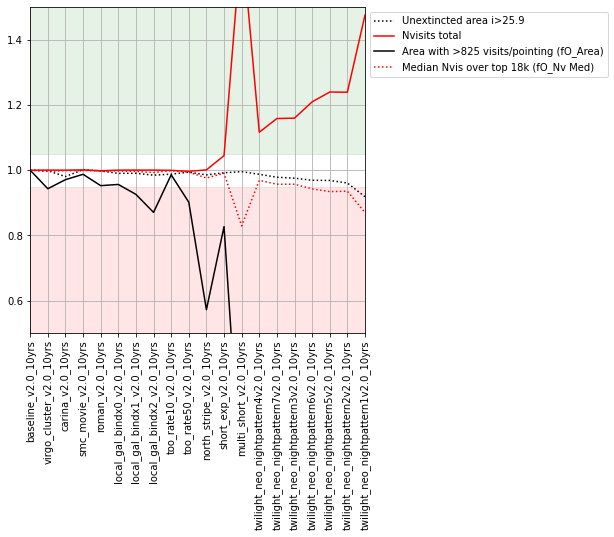

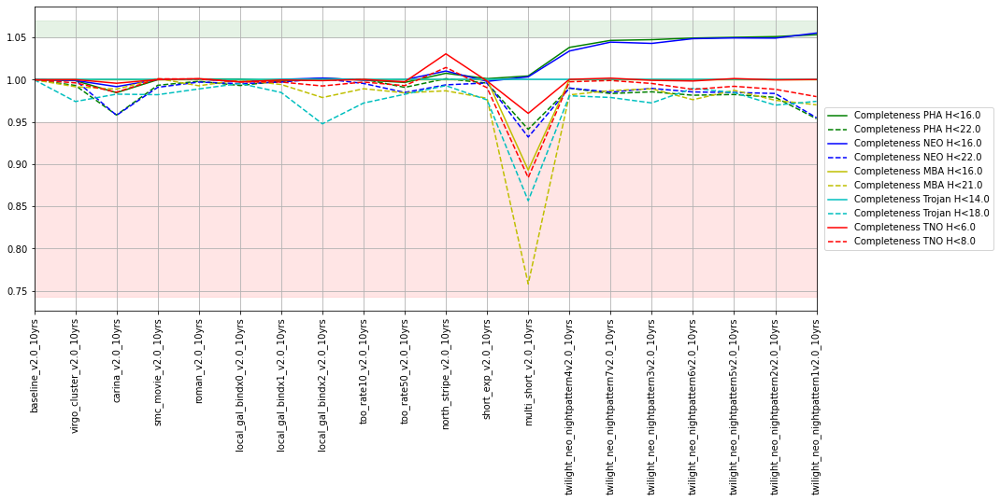

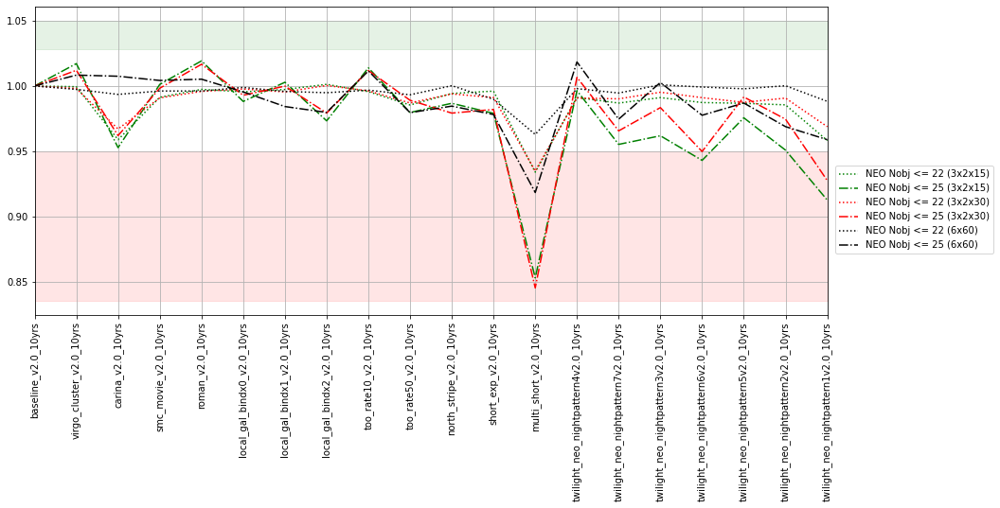

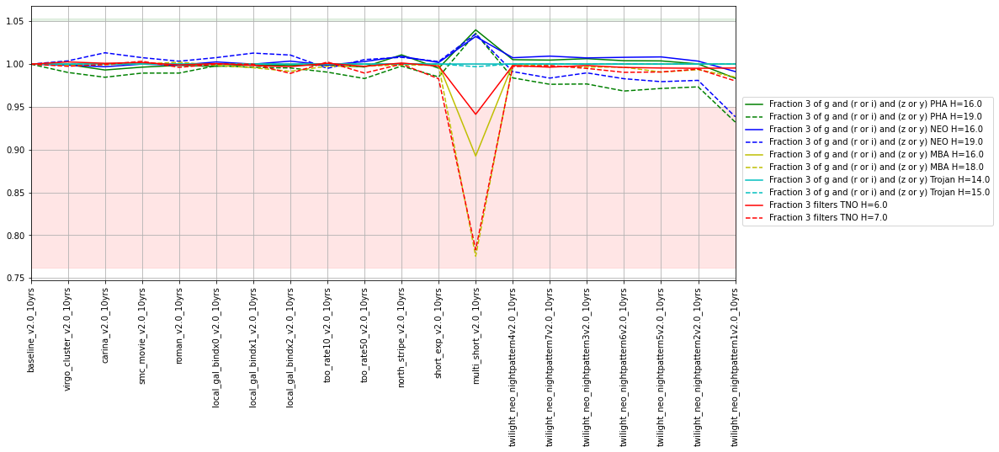

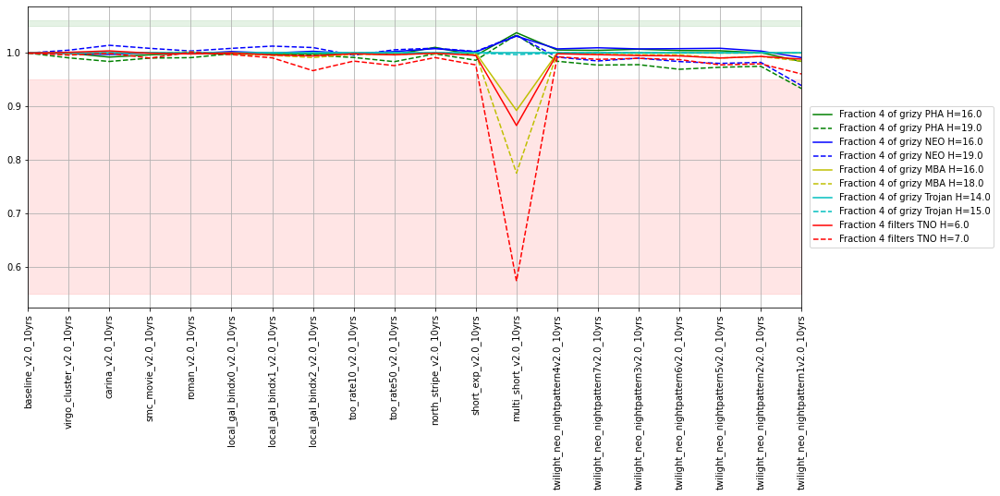

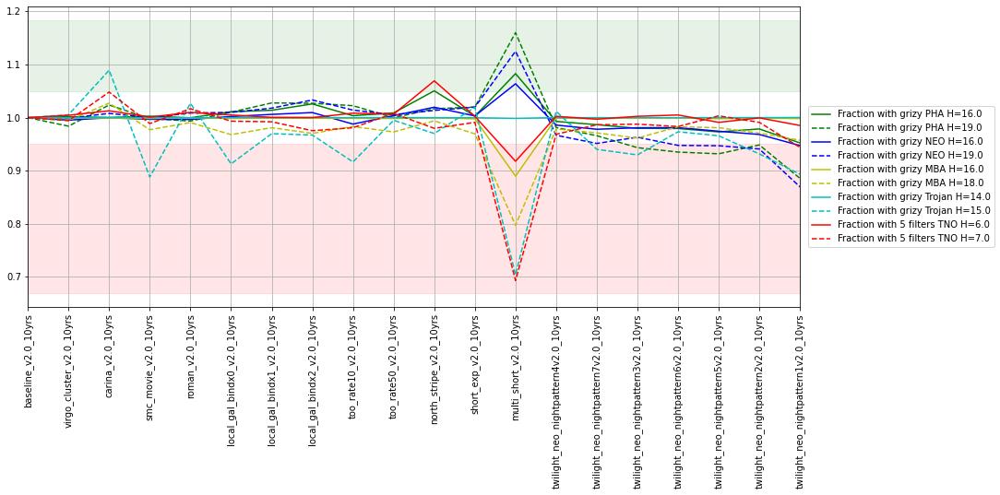

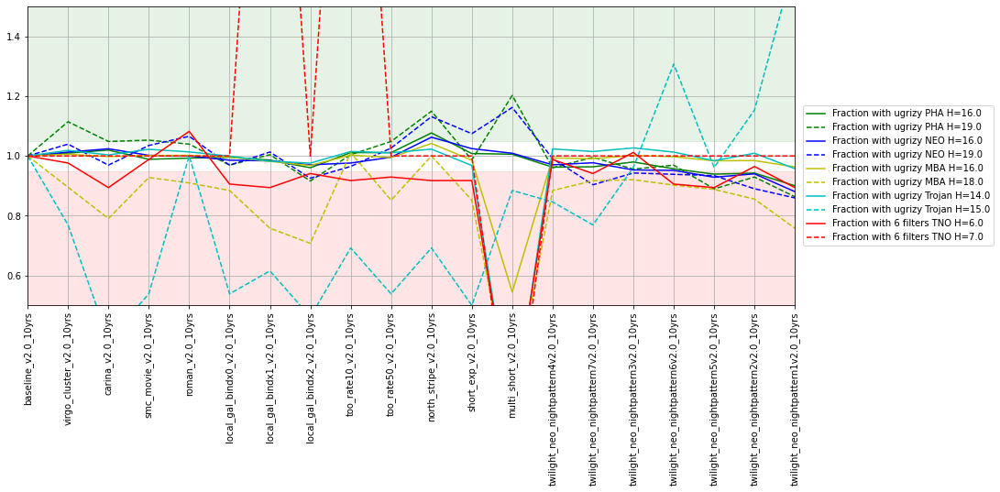

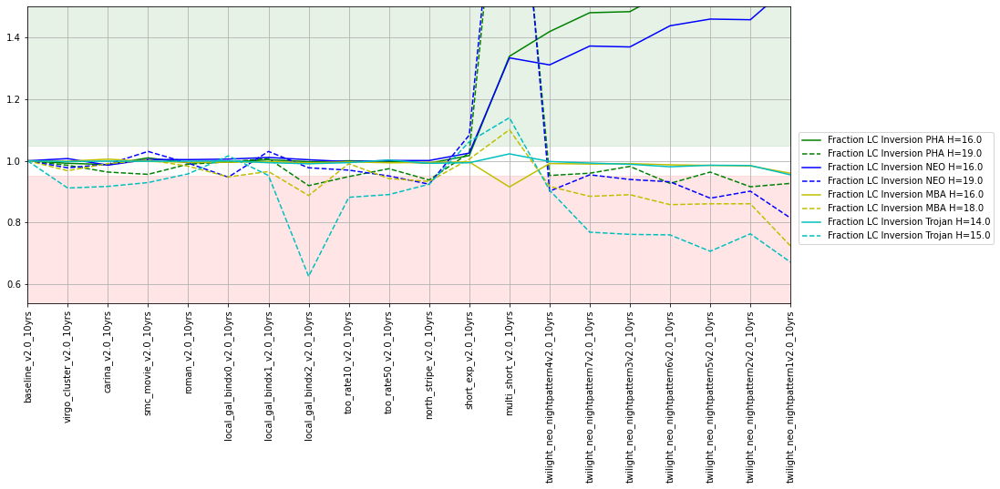

In [18]:
fam = ['microsurveys']
describe_family(fam)
for mset in sso_metrics:
    d = sso_family(fam, mset)
    IPython.display.display(d)

In [19]:
# Basic 'general' metrics for a subset of runs
tt = family_runs[['run', 'brief', 'reference']].reset_index().set_index('run')

def describe_runs(these_runs):
    baseline_run = tt['reference'].loc[these_runs].iloc[0]
    if baseline_run not in these_runs:
        these_runs = [baseline_run] + these_runs
    d = summaries.loc[these_runs, metrics.loc['short']['metric']]
    d.columns = metrics.loc['short']['short_name'].values
    d['Briefly'] = tt['brief']
    IPython.display.display(d)
    mset = 'area'
    fig, ax = maf.plot_run_metric(  # pylint: disable=invalid-name
        summaries.loc[these_runs, :], 
        metric_set=metrics.loc[mset],
        baseline_run=baseline_run,
        vertical_quantity="value",
        horizontal_quantity="run",
        metric_label_map=metrics.loc[mset]['short_name']
    )
    plt.xlim(0, len(d)-1)
    xlims = plt.xlim()
    if plt.ylim()[0] < 0.50:
        plt.ylim(bottom=0.50)
    if plt.ylim()[1] > 1.5:
        plt.ylim(top=1.5)
    plt.fill_between(xlims, 1.05, plt.ylim()[1], color='g', alpha=0.1)
    plt.fill_between(xlims, 0.95, plt.ylim()[0], color='r', alpha=0.1)

# Show and plot set of solar system specific metric outputs
def sso_runs(these_runs, mset):
    baseline_run = tt['reference'].loc[these_runs].iloc[0]
    if baseline_run not in these_runs:
        these_runs = [baseline_run] + these_runs
    fig, ax = maf.plot_run_metric(  # pylint: disable=invalid-name
            summaries.loc[these_runs, :], 
            metric_set=metrics.loc[mset],
            baseline_run=baseline_run,
            vertical_quantity="value",
            horizontal_quantity="run",
            metric_label_map=metrics.loc[mset]['short_name']
        )
    d = summaries.loc[these_runs, metrics.loc[mset]['metric']]
    d.columns = metrics.loc[mset]['short_name']
    plt.xlim(0, len(d)-1)
    xlims = plt.xlim()
    if plt.ylim()[0] < 0.50:
        plt.ylim(bottom=0.50)
    if plt.ylim()[1] > 1.5:
        plt.ylim(top=1.5)
    plt.fill_between(xlims, 1.05, plt.ylim()[1], color='g', alpha=0.1)
    plt.fill_between(xlims, 0.95, plt.ylim()[0], color='r', alpha=0.1)
    return d

,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band,Briefly
run,,,,,,,,,,,
baseline_v2.0_10yrs,12893.228978,16711.175770,2086980.0,839.0,54.0,70.0,178.0,180.0,160.0,166.0,v2.0 baseline
twilight_neo_nightpattern4v2.0_10yrs,5852.394588,16502.191652,2329938.0,813.0,52.0,67.0,189.0,192.0,167.0,161.0,Twilight neo observations 1 night on 3 off
twilight_neo_nightpattern7v2.0_10yrs,3772.624935,16352.797383,2417826.0,803.0,51.0,67.0,191.0,194.0,168.0,159.0,Twilight neo observations 2 night on 4 off
twilight_neo_nightpattern3v2.0_10yrs,3776.821403,16304.118352,2420218.0,803.0,52.0,66.0,190.0,193.0,170.0,159.0,Twilight neo observations 1 night on 2 off
twilight_neo_nightpattern6v2.0_10yrs,1927.857503,16195.849472,2524598.0,791.0,51.0,66.0,196.0,200.0,171.0,157.0,Twilight neo observations 3 night on 4 off
twilight_neo_nightpattern5v2.0_10yrs,1227.886603,16186.617242,2587302.0,784.0,50.0,65.0,205.0,212.0,177.0,155.0,Twilight neo observations 4 night on 4 off
twilight_neo_nightpattern2v2.0_10yrs,1309.298087,16055.687433,2586114.0,785.0,50.0,65.0,202.0,210.0,176.0,156.0,Twilight neo observations every other night
twilight_neo_nightpattern1v2.0_10yrs,114.983229,15352.359358,3079761.0,730.0,47.0,61.0,273.0,271.0,247.0,144.0,Twilight neo observations every night


short_name,Completeness PHA H<16.0,Completeness PHA H<22.0,Completeness NEO H<16.0,Completeness NEO H<22.0,Completeness MBA H<16.0,Completeness MBA H<21.0,Completeness Trojan H<14.0,Completeness Trojan H<18.0,Completeness TNO H<6.0,Completeness TNO H<8.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.9402,0.588894,0.9296,0.575235,1.0,0.534662,1.0,0.427171,0.695976,0.471819
twilight_neo_nightpattern4v2.0_10yrs,0.9762,0.583067,0.9612,0.569532,1.0,0.525075,1.0,0.419051,0.696283,0.470666
twilight_neo_nightpattern7v2.0_10yrs,0.9840,0.579277,0.9710,0.566780,1.0,0.527777,1.0,0.418191,0.697272,0.471395
twilight_neo_nightpattern3v2.0_10yrs,0.9848,0.580466,0.9696,0.569312,1.0,0.528925,1.0,0.415432,0.695482,0.469737
twilight_neo_nightpattern6v2.0_10yrs,0.9866,0.578081,0.9748,0.566894,1.0,0.522007,1.0,0.422846,0.694936,0.466422
twilight_neo_nightpattern5v2.0_10yrs,0.9874,0.578593,0.9756,0.566551,1.0,0.527997,1.0,0.420661,0.696958,0.468146
twilight_neo_nightpattern2v2.0_10yrs,0.9882,0.576610,0.9754,0.565865,1.0,0.521652,1.0,0.414324,0.695859,0.466474
twilight_neo_nightpattern1v2.0_10yrs,0.9904,0.561733,0.9810,0.549394,1.0,0.518780,1.0,0.416236,0.696200,0.462379


short_name,NEO Nobj <= 22 (3x2x15),NEO Nobj <= 25 (3x2x15),NEO Nobj <= 22 (3x2x30),NEO Nobj <= 25 (3x2x30),NEO Nobj <= 22 (6x60),NEO Nobj <= 25 (6x60)
run,,,,,,
baseline_v2.0_10yrs,15662.967795,57164.264343,16843.227494,65684.906894,18958.508073,94833.630288
twilight_neo_nightpattern4v2.0_10yrs,15524.584883,56959.829455,16687.850892,66120.370785,18919.611912,96581.513467
twilight_neo_nightpattern7v2.0_10yrs,15457.562487,54603.528479,16676.860958,63423.675749,18856.199023,92418.775280
twilight_neo_nightpattern3v2.0_10yrs,15523.252788,54980.904356,16762.399039,64594.781675,18975.268176,95089.612924
twilight_neo_nightpattern6v2.0_10yrs,15463.902090,53902.216734,16692.395833,62383.378324,18943.234723,92704.247900
twilight_neo_nightpattern5v2.0_10yrs,15454.870917,55768.530296,16631.610667,65130.497195,18917.507315,93592.483312
twilight_neo_nightpattern2v2.0_10yrs,15436.008399,54350.713740,16686.482428,64010.700480,18961.625169,91875.506133
twilight_neo_nightpattern1v2.0_10yrs,15007.858918,52162.165456,16317.745582,60920.407874,18735.027825,90929.872777


short_name,Fraction 3 of g and (r or i) and (z or y) PHA H=16.0,Fraction 3 of g and (r or i) and (z or y) PHA H=19.0,Fraction 3 of g and (r or i) and (z or y) NEO H=16.0,Fraction 3 of g and (r or i) and (z or y) NEO H=19.0,Fraction 3 of g and (r or i) and (z or y) MBA H=16.0,Fraction 3 of g and (r or i) and (z or y) MBA H=18.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=14.0,Fraction 3 of g and (r or i) and (z or y) Trojan H=15.0,Fraction 3 filters TNO H=6.0,Fraction 3 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8476,0.5344,0.8548,0.5272,1.0,0.901780,1.0,0.9996,0.6168,0.4794
twilight_neo_nightpattern4v2.0_10yrs,0.8520,0.5258,0.8612,0.5226,1.0,0.901380,1.0,0.9998,0.6158,0.4780
twilight_neo_nightpattern7v2.0_10yrs,0.8516,0.5218,0.8628,0.5186,1.0,0.899580,1.0,0.9998,0.6146,0.4786
twilight_neo_nightpattern3v2.0_10yrs,0.8530,0.5220,0.8610,0.5218,1.0,0.898780,1.0,0.9996,0.6158,0.4770
twilight_neo_nightpattern6v2.0_10yrs,0.8510,0.5176,0.8616,0.5182,1.0,0.898580,1.0,0.9998,0.6144,0.4748
twilight_neo_nightpattern5v2.0_10yrs,0.8508,0.5192,0.8620,0.5164,1.0,0.893379,1.0,0.9996,0.6140,0.4750
twilight_neo_nightpattern2v2.0_10yrs,0.8478,0.5202,0.8578,0.5172,1.0,0.895979,1.0,0.9996,0.6138,0.4766
twilight_neo_nightpattern1v2.0_10yrs,0.8336,0.4982,0.8474,0.4948,1.0,0.888178,1.0,0.9998,0.6140,0.4700


short_name,Fraction 4 of grizy PHA H=16.0,Fraction 4 of grizy PHA H=19.0,Fraction 4 of grizy NEO H=16.0,Fraction 4 of grizy NEO H=19.0,Fraction 4 of grizy MBA H=16.0,Fraction 4 of grizy MBA H=18.0,Fraction 4 of grizy Trojan H=14.0,Fraction 4 of grizy Trojan H=15.0,Fraction 4 filters TNO H=6.0,Fraction 4 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.8470,0.5334,0.8544,0.5264,1.0,0.901780,1.0,0.9996,0.5978,0.4248
twilight_neo_nightpattern4v2.0_10yrs,0.8518,0.5252,0.8610,0.5224,1.0,0.901380,1.0,0.9998,0.5970,0.4218
twilight_neo_nightpattern7v2.0_10yrs,0.8512,0.5214,0.8628,0.5186,1.0,0.899580,1.0,0.9998,0.5960,0.4198
twilight_neo_nightpattern3v2.0_10yrs,0.8530,0.5218,0.8610,0.5214,1.0,0.898780,1.0,0.9996,0.5950,0.4206
twilight_neo_nightpattern6v2.0_10yrs,0.8510,0.5172,0.8614,0.5180,1.0,0.898580,1.0,0.9998,0.5946,0.4196
twilight_neo_nightpattern5v2.0_10yrs,0.8506,0.5192,0.8620,0.5162,1.0,0.893379,1.0,0.9996,0.5922,0.4154
twilight_neo_nightpattern2v2.0_10yrs,0.8476,0.5202,0.8576,0.5172,1.0,0.895979,1.0,0.9996,0.5940,0.4162
twilight_neo_nightpattern1v2.0_10yrs,0.8336,0.4980,0.8472,0.4944,1.0,0.888178,1.0,0.9998,0.5910,0.4082


short_name,Fraction with grizy PHA H=16.0,Fraction with grizy PHA H=19.0,Fraction with grizy NEO H=16.0,Fraction with grizy NEO H=19.0,Fraction with grizy MBA H=16.0,Fraction with grizy MBA H=18.0,Fraction with grizy Trojan H=14.0,Fraction with grizy Trojan H=15.0,Fraction with 5 filters TNO H=6.0,Fraction with 5 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.7218,0.3112,0.7564,0.3250,0.996599,0.431086,0.9994,0.5556,0.4042,0.1786
twilight_neo_nightpattern4v2.0_10yrs,0.7166,0.3054,0.7458,0.3142,0.995799,0.421884,0.9994,0.5622,0.4052,0.1730
twilight_neo_nightpattern7v2.0_10yrs,0.7122,0.3006,0.7398,0.3092,0.994799,0.418684,0.9992,0.5224,0.4030,0.1762
twilight_neo_nightpattern3v2.0_10yrs,0.7072,0.2936,0.7420,0.3130,0.995999,0.414483,0.9994,0.5166,0.4052,0.1764
twilight_neo_nightpattern6v2.0_10yrs,0.7070,0.2910,0.7422,0.3080,0.995799,0.423685,0.9992,0.5408,0.4062,0.1756
twilight_neo_nightpattern5v2.0_10yrs,0.7024,0.2900,0.7370,0.3078,0.994599,0.422885,0.9994,0.5366,0.4006,0.1792
twilight_neo_nightpattern2v2.0_10yrs,0.7064,0.2952,0.7324,0.3058,0.995599,0.418484,0.9994,0.5176,0.4040,0.1770
twilight_neo_nightpattern1v2.0_10yrs,0.6874,0.2756,0.7166,0.2826,0.994799,0.412683,0.9996,0.4964,0.3982,0.1686


short_name,Fraction with ugrizy PHA H=16.0,Fraction with ugrizy PHA H=19.0,Fraction with ugrizy NEO H=16.0,Fraction with ugrizy NEO H=19.0,Fraction with ugrizy MBA H=16.0,Fraction with ugrizy MBA H=18.0,Fraction with ugrizy Trojan H=14.0,Fraction with ugrizy Trojan H=15.0,Fraction with 6 filters TNO H=6.0,Fraction with 6 filters TNO H=7.0
run,,,,,,,,,,
baseline_v2.0_10yrs,0.4468,0.0454,0.4654,0.0456,0.895979,0.055411,0.9272,0.0052,0.0170,0.0002
twilight_neo_nightpattern4v2.0_10yrs,0.4300,0.0436,0.4516,0.0452,0.889978,0.049010,0.9490,0.0044,0.0168,0.0002
twilight_neo_nightpattern7v2.0_10yrs,0.4306,0.0452,0.4548,0.0412,0.887778,0.050810,0.9410,0.0040,0.0160,0.0002
twilight_neo_nightpattern3v2.0_10yrs,0.4378,0.0434,0.4436,0.0430,0.897379,0.051010,0.9522,0.0050,0.0172,0.0002
twilight_neo_nightpattern6v2.0_10yrs,0.4276,0.0440,0.4430,0.0428,0.893779,0.050010,0.9392,0.0068,0.0154,0.0002
twilight_neo_nightpattern5v2.0_10yrs,0.4196,0.0404,0.4322,0.0426,0.881376,0.049210,0.9124,0.0050,0.0152,0.0002
twilight_neo_nightpattern2v2.0_10yrs,0.4212,0.0422,0.4376,0.0406,0.882176,0.047409,0.9356,0.0060,0.0164,0.0002
twilight_neo_nightpattern1v2.0_10yrs,0.4022,0.0392,0.4098,0.0392,0.863173,0.042008,0.8878,0.0086,0.0152,0.0002


short_name,Fraction LC Inversion PHA H=16.0,Fraction LC Inversion PHA H=19.0,Fraction LC Inversion NEO H=16.0,Fraction LC Inversion NEO H=19.0,Fraction LC Inversion MBA H=16.0,Fraction LC Inversion MBA H=18.0,Fraction LC Inversion Trojan H=14.0,Fraction LC Inversion Trojan H=15.0
run,,,,,,,,
baseline_v2.0_10yrs,0.4672,0.0546,0.4808,0.0528,0.947790,0.149230,0.9372,0.1132
twilight_neo_nightpattern4v2.0_10yrs,0.6628,0.0520,0.6302,0.0476,0.939388,0.136827,0.9350,0.1024
twilight_neo_nightpattern7v2.0_10yrs,0.6914,0.0524,0.6596,0.0504,0.937788,0.132026,0.9302,0.0870
twilight_neo_nightpattern3v2.0_10yrs,0.6930,0.0536,0.6582,0.0496,0.938988,0.132827,0.9266,0.0862
twilight_neo_nightpattern6v2.0_10yrs,0.7260,0.0506,0.6912,0.0492,0.935387,0.128026,0.9190,0.0860
twilight_neo_nightpattern5v2.0_10yrs,0.7368,0.0526,0.7016,0.0464,0.933587,0.128426,0.9236,0.0800
twilight_neo_nightpattern2v2.0_10yrs,0.7386,0.0500,0.7006,0.0476,0.931986,0.128426,0.9228,0.0864
twilight_neo_nightpattern1v2.0_10yrs,0.7902,0.0506,0.7548,0.0430,0.909382,0.108022,0.8944,0.0760


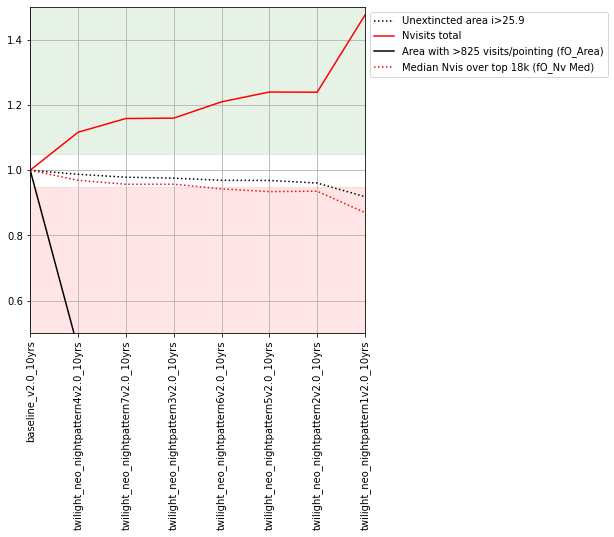

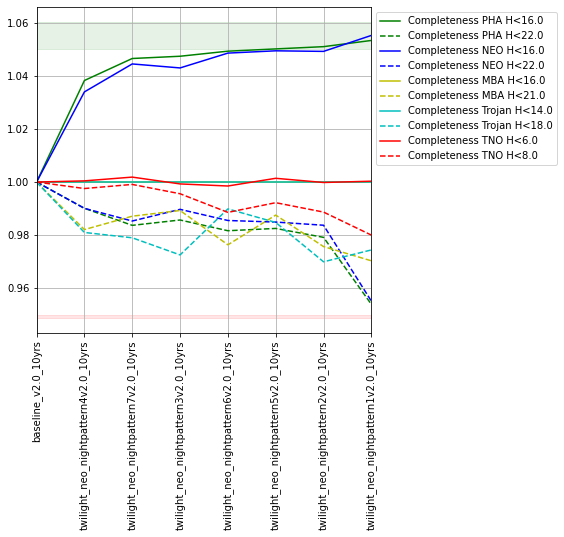

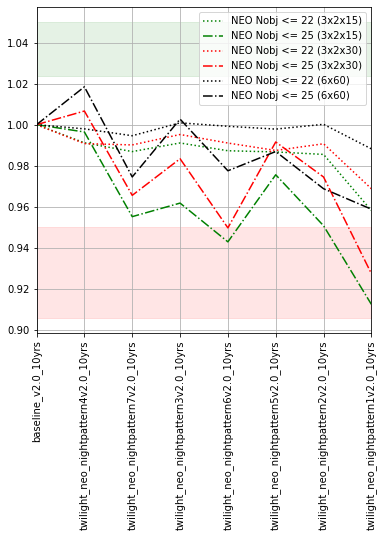

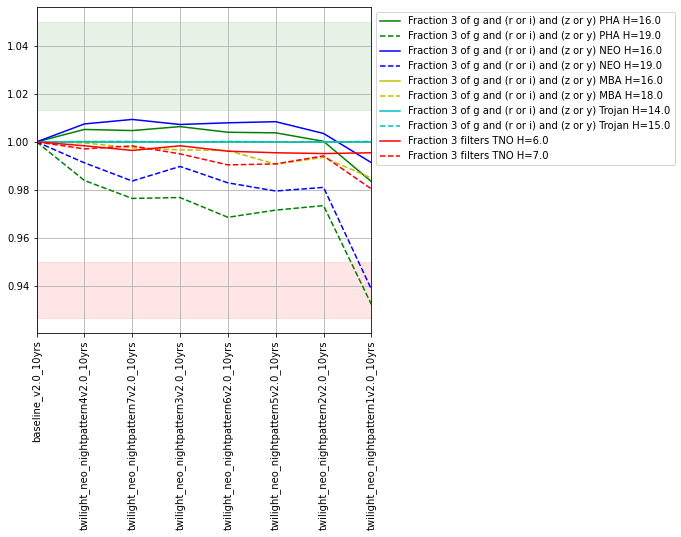

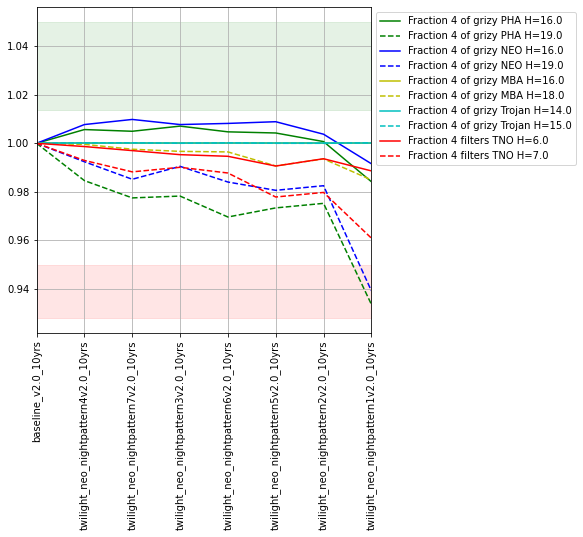

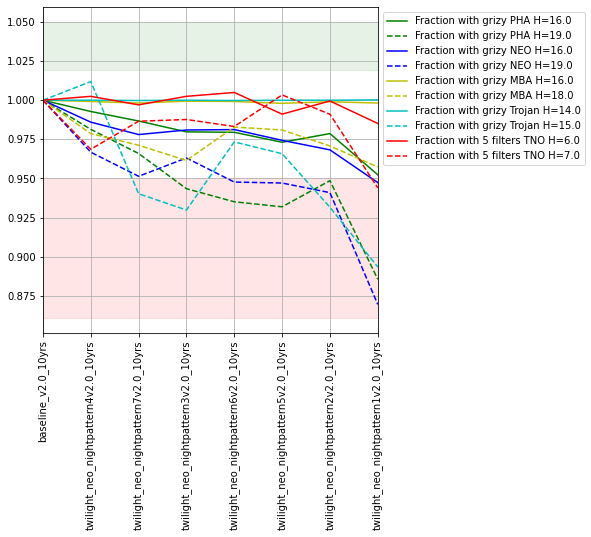

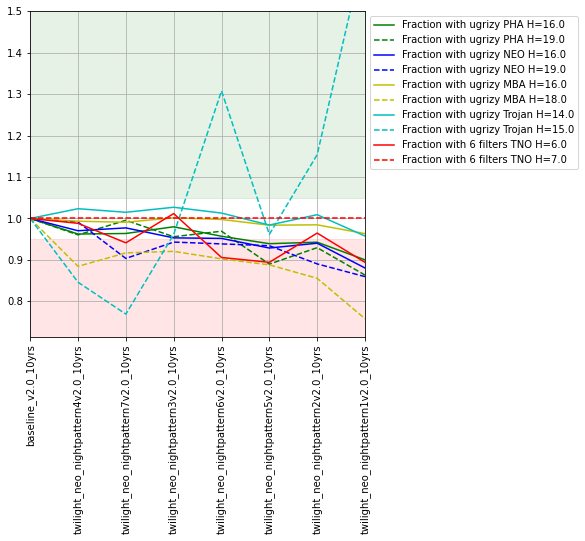

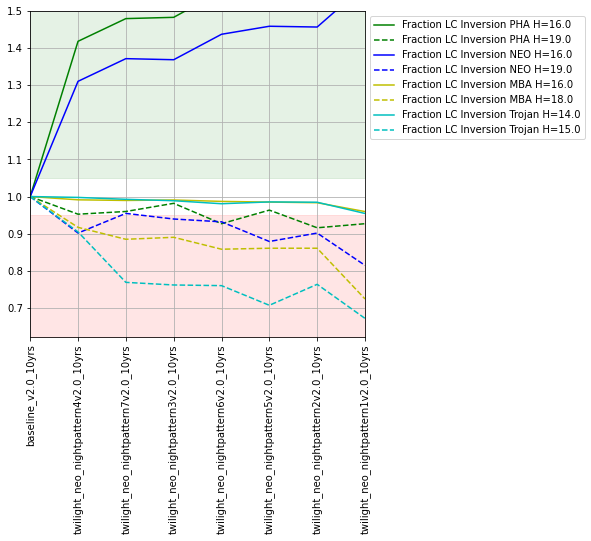

In [20]:
these_runs = [r for r in tt.index if 'twilight' in r]
describe_runs(these_runs)
for mset in sso_metrics:
    d = sso_runs(these_runs, mset)
    IPython.display.display(d)